# **Aravindan N Capstone Project Notes 2**

## **Problem Statement**

An E Commerce company or DTH (you can choose either of these two domains) provider is facing a lot of competition in the current market and it has become a challenge to retain the existing customers in the current situation. Hence, the company wants to develop a model through which they can do churn prediction of the accounts and provide segmented offers to the potential churners. In this company, account churn is a major thing because 1 account can have multiple customers. hence by losing one account the company might be losing more than one customer.

You have been assigned to develop a churn prediction model for this company and provide business recommendations on the campaign.

Your campaign suggestion should be unique and be very clear on the campaign offer because your recommendation will go through the revenue assurance team. If they find that you are giving a lot of free (or subsidized) stuff thereby making a loss to the company; they are not going to approve your recommendation. Hence be very careful while providing campaign recommendation.

## **Data Dictionary**

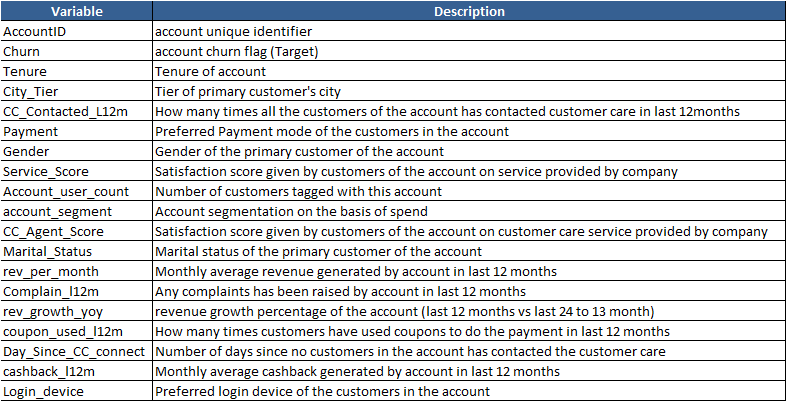

## **Load Packages**

In [ ]:
# Import the necessarry libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import missingno as msno
import matplotlib.patches as mpatches
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.metrics import confusion_matrix,classification_report,roc_auc_score,accuracy_score,roc_auc_score,roc_curve, precision_score, recall_score, f1_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_validate
from scipy.stats import zscore
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import cross_val_score
from sklearn import svm
import xgboost as xgb
from sklearn.ensemble import BaggingClassifier
from imblearn.over_sampling import SMOTE
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
import warnings
from sklearn.impute import KNNImputer
warnings.filterwarnings("ignore")

In [ ]:
pd.set_option("display.max_columns" , None)
pd.set_option("display.max_rows" , None)

## **Read Data**

In [ ]:
churn_df = pd.read_excel('/content/drive/MyDrive/PGP-DSBA/Capstone Project/Customer Churn Data.xlsx', sheet_name=1)
churn_df.head()

,AccountID,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
0,20000,1,4,3.0,6.0,Debit Card,Female,3.0,3,Super,2.0,Single,9,1.0,11,1,5,159.93,Mobile
1,20001,1,0,1.0,8.0,UPI,Male,3.0,4,Regular Plus,3.0,Single,7,1.0,15,0,0,120.9,Mobile
2,20002,1,0,1.0,30.0,Debit Card,Male,2.0,4,Regular Plus,3.0,Single,6,1.0,14,0,3,NaN,Mobile
3,20003,1,0,3.0,15.0,Debit Card,Male,2.0,4,Super,5.0,Single,8,0.0,23,0,3,134.07,Mobile
4,20004,1,0,1.0,12.0,Credit Card,Male,2.0,3,Regular Plus,5.0,Single,3,0.0,11,1,3,129.6,Mobile


In [ ]:
rfm_df = churn_df[['AccountID','CC_Contacted_LY','rev_per_month','Day_Since_CC_connect']]
rfm_df.head()

,AccountID,CC_Contacted_LY,rev_per_month,Day_Since_CC_connect
0,20000,6.0,9,5
1,20001,8.0,7,0
2,20002,30.0,6,3
3,20003,15.0,8,3
4,20004,12.0,3,3


In [ ]:
rows, cols = churn_df.shape
print('There are {} rows and {} columns in the dataset'.format(rows, cols))

There are 11260 rows and 19 columns in the dataset


In [ ]:
churn_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11260 entries, 0 to 11259
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   AccountID                11260 non-null  int64  
 1   Churn                    11260 non-null  int64  
 2   Tenure                   11158 non-null  object 
 3   City_Tier                11148 non-null  float64
 4   CC_Contacted_LY          11158 non-null  float64
 5   Payment                  11151 non-null  object 
 6   Gender                   11152 non-null  object 
 7   Service_Score            11162 non-null  float64
 8   Account_user_count       11148 non-null  object 
 9   account_segment          11163 non-null  object 
 10  CC_Agent_Score           11144 non-null  float64
 11  Marital_Status           11048 non-null  object 
 12  rev_per_month            11158 non-null  object 
 13  Complain_ly              10903 non-null  float64
 14  rev_growth_yoy        

In [ ]:
churn_df.duplicated().sum()

0

## **EDA**

In [ ]:
# Dropping unimportant columns
churn_df.drop('AccountID',axis=1,inplace=True)
churn_df.head()

,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
0,1,4,3.0,6.0,Debit Card,Female,3.0,3,Super,2.0,Single,9,1.0,11,1,5,159.93,Mobile
1,1,0,1.0,8.0,UPI,Male,3.0,4,Regular Plus,3.0,Single,7,1.0,15,0,0,120.9,Mobile
2,1,0,1.0,30.0,Debit Card,Male,2.0,4,Regular Plus,3.0,Single,6,1.0,14,0,3,NaN,Mobile
3,1,0,3.0,15.0,Debit Card,Male,2.0,4,Super,5.0,Single,8,0.0,23,0,3,134.07,Mobile
4,1,0,1.0,12.0,Credit Card,Male,2.0,3,Regular Plus,5.0,Single,3,0.0,11,1,3,129.6,Mobile


In [ ]:
for column in churn_df.columns:
  if column != 'cashback':
    print(column)
    print('***************')
    print(churn_df[column].value_counts().sort_values(ascending=False))
    print('\n')
    print('***************')

Churn
***************
0    9364
1    1896
Name: Churn, dtype: int64


***************
Tenure
***************
1     1351
0     1231
8      519
9      496
7      450
10     423
3      410
5      403
4      403
11     388
6      363
12     360
13     359
2      354
14     345
15     311
16     291
19     273
18     253
20     217
17     215
21     170
23     169
22     151
24     147
28     137
30     137
27     131
99     131
26     122
#      116
25     114
29     114
31      96
50       2
60       2
51       2
61       2
Name: Tenure, dtype: int64


***************
City_Tier
***************
1.0    7263
3.0    3405
2.0     480
Name: City_Tier, dtype: int64


***************
CC_Contacted_LY
***************
14.0     682
16.0     663
9.0      655
13.0     655
15.0     623
12.0     571
8.0      538
17.0     525
11.0     524
10.0     489
7.0      391
18.0     374
19.0     364
20.0     319
6.0      311
21.0     310
22.0     282
23.0     241
24.0     214
25.0     197
32.0     192
29.0     181


## **Data Cleaning**

In [ ]:
churn_df['cashback'] = churn_df['cashback'].replace(to_replace='$', value=0)

In [ ]:
churn_df['cashback'] = pd.to_numeric(churn_df['cashback'])

In [ ]:
churn_df['Gender'].value_counts()

Male      6328
Female    4178
M          376
F          270
Name: Gender, dtype: int64

In [ ]:
churn_df['Gender'] = churn_df['Gender'].replace(to_replace='Male', value='M').replace(to_replace="Female", value='F')

In [ ]:
churn_df['Gender'].value_counts()

M    6704
F    4448
Name: Gender, dtype: int64

In [ ]:
churn_df['Tenure'].value_counts()

1     1351
0     1231
8      519
9      496
7      450
10     423
3      410
5      403
4      403
11     388
6      363
12     360
13     359
2      354
14     345
15     311
16     291
19     273
18     253
20     217
17     215
21     170
23     169
22     151
24     147
28     137
30     137
27     131
99     131
26     122
#      116
25     114
29     114
31      96
50       2
60       2
51       2
61       2
Name: Tenure, dtype: int64

In [ ]:
churn_df['Tenure'] = churn_df['Tenure'].replace(to_replace='#', value=churn_df['Tenure'].mode()[0])

In [ ]:
churn_df['Tenure'].value_counts().sort_values(ascending=False)

1.0     1467
0.0     1231
8.0      519
9.0      496
7.0      450
10.0     423
3.0      410
5.0      403
4.0      403
11.0     388
6.0      363
12.0     360
13.0     359
2.0      354
14.0     345
15.0     311
16.0     291
19.0     273
18.0     253
20.0     217
17.0     215
21.0     170
23.0     169
22.0     151
24.0     147
28.0     137
30.0     137
27.0     131
99.0     131
26.0     122
25.0     114
29.0     114
31.0      96
50.0       2
60.0       2
51.0       2
61.0       2
Name: Tenure, dtype: int64

In [ ]:
churn_df['Account_user_count'].value_counts().sort_values(ascending=False)

4    4569
3    3261
5    1699
2     526
1     446
@     332
6     315
Name: Account_user_count, dtype: int64

In [ ]:
churn_df['Account_user_count'] = churn_df['Account_user_count'].replace(to_replace='@', value=churn_df['Account_user_count'].mode()[0])

In [ ]:
churn_df['Account_user_count'].value_counts().sort_values(ascending=False)

4.0    4901
3.0    3261
5.0    1699
2.0     526
1.0     446
6.0     315
Name: Account_user_count, dtype: int64

In [ ]:
churn_df['account_segment'].value_counts().sort_values(ascending=False)

Super           4062
Regular Plus    3862
HNI             1639
Super Plus       771
Regular          520
Regular +        262
Super +           47
Name: account_segment, dtype: int64

In [ ]:
churn_df['account_segment'] = churn_df['account_segment'].replace(to_replace='Regular +', value='Regular Plus').replace(to_replace="Super +", value='Super Plus')

In [ ]:
churn_df['account_segment'].value_counts().sort_values(ascending=False)

Regular Plus    4124
Super           4062
HNI             1639
Super Plus       818
Regular          520
Name: account_segment, dtype: int64

In [ ]:
churn_df['rev_per_month'].value_counts().sort_values(ascending=False)

3      1746
2      1585
5      1337
4      1218
6      1085
7       754
+       689
8       643
9       564
10      413
1       402
11      278
12      166
13       93
14       48
15       24
102       8
123       5
124       5
107       5
136       4
140       4
118       4
133       4
129       4
113       3
130       3
126       3
116       3
108       3
127       3
110       3
119       3
101       3
138       3
117       3
115       3
137       3
125       2
134       2
105       2
22        2
121       2
114       2
139       2
131       2
19        2
120       2
20        1
23        1
122       1
21        1
104       1
25        1
135       1
111       1
109       1
100       1
103       1
Name: rev_per_month, dtype: int64

In [ ]:
churn_df['rev_per_month'] = churn_df['rev_per_month'].replace(to_replace='+', value=churn_df['rev_per_month'].mode()[0])

In [ ]:
churn_df['rev_per_month'].value_counts().sort_values(ascending=False)

3.0      2435
2.0      1585
5.0      1337
4.0      1218
6.0      1085
7.0       754
8.0       643
9.0       564
10.0      413
1.0       402
11.0      278
12.0      166
13.0       93
14.0       48
15.0       24
102.0       8
107.0       5
123.0       5
124.0       5
140.0       4
118.0       4
129.0       4
133.0       4
136.0       4
115.0       3
127.0       3
113.0       3
126.0       3
130.0       3
138.0       3
137.0       3
119.0       3
116.0       3
101.0       3
108.0       3
117.0       3
110.0       3
125.0       2
134.0       2
114.0       2
121.0       2
105.0       2
22.0        2
131.0       2
120.0       2
139.0       2
19.0        2
20.0        1
23.0        1
122.0       1
104.0       1
21.0        1
25.0        1
135.0       1
111.0       1
109.0       1
100.0       1
103.0       1
Name: rev_per_month, dtype: int64

In [ ]:
churn_df['rev_growth_yoy'].value_counts().sort_values(ascending=False)

14    1524
13    1427
15    1283
12    1210
16     949
18     708
17     704
19     619
20     562
11     523
21     433
22     403
23     345
24     229
25     188
26      98
27      35
28      14
$        3
4        3
Name: rev_growth_yoy, dtype: int64

In [ ]:
churn_df['rev_growth_yoy'] = churn_df['rev_growth_yoy'].replace(to_replace='$', value=churn_df['rev_growth_yoy'].mode()[0])

In [ ]:
churn_df['rev_growth_yoy'].value_counts().sort_values(ascending=False)

14    1527
13    1427
15    1283
12    1210
16     949
18     708
17     704
19     619
20     562
11     523
21     433
22     403
23     345
24     229
25     188
26      98
27      35
28      14
4        3
Name: rev_growth_yoy, dtype: int64

In [ ]:
churn_df['coupon_used_for_payment'].value_counts().sort_values(ascending=False)

1     4373
2     2656
0     2150
3      698
4      424
5      284
6      234
7      184
8       88
9       34
10      34
11      30
12      26
13      22
14      12
15       4
16       4
#        1
$        1
*        1
Name: coupon_used_for_payment, dtype: int64

In [ ]:
churn_df['coupon_used_for_payment'] = churn_df['coupon_used_for_payment'].replace(to_replace='#', value=churn_df['coupon_used_for_payment'].mode()[0]).replace(to_replace="$", value=churn_df['coupon_used_for_payment'].mode()[0]).replace(to_replace="*", value=churn_df['coupon_used_for_payment'].mode()[0])

In [ ]:
churn_df['coupon_used_for_payment'].value_counts().sort_values(ascending=False)

1     4376
2     2656
0     2150
3      698
4      424
5      284
6      234
7      184
8       88
9       34
10      34
11      30
12      26
13      22
14      12
15       4
16       4
Name: coupon_used_for_payment, dtype: int64

In [ ]:
churn_df['Day_Since_CC_connect'].value_counts().sort_values(ascending=False)

3     1816
2     1574
1     1256
8     1169
0      964
7      911
4      893
9      622
5      479
10     339
6      229
11     183
12     146
13     117
14      74
15      37
17      34
16      26
18      26
30       2
31       2
47       2
$        1
46       1
Name: Day_Since_CC_connect, dtype: int64

In [ ]:
churn_df['Day_Since_CC_connect'] = churn_df['Day_Since_CC_connect'].replace(to_replace='$', value=churn_df['Day_Since_CC_connect'].mode()[0])

In [ ]:
churn_df['Day_Since_CC_connect'].value_counts().sort_values(ascending=False)

3.0     1817
2.0     1574
1.0     1256
8.0     1169
0.0      964
7.0      911
4.0      893
9.0      622
5.0      479
10.0     339
6.0      229
11.0     183
12.0     146
13.0     117
14.0      74
15.0      37
17.0      34
16.0      26
18.0      26
30.0       2
31.0       2
47.0       2
46.0       1
Name: Day_Since_CC_connect, dtype: int64

In [ ]:
churn_df['Login_device'].value_counts().sort_values(ascending=False)

Mobile      7482
Computer    3018
&&&&         539
Name: Login_device, dtype: int64

In [ ]:
churn_df['Login_device'] = churn_df['Login_device'].replace(to_replace='&&&&', value='Both')

In [ ]:
churn_df['Login_device'].value_counts().sort_values(ascending=False)

Mobile      7482
Computer    3018
Both         539
Name: Login_device, dtype: int64

In [ ]:
# Statistical Summary
churn_df_stat = churn_df.describe().T
churn_df_stat['Skew']=churn_df.skew(axis=0)
churn_df_stat['Kurtosis']=churn_df.kurtosis(axis=0)
churn_df_stat

,count,mean,std,min,25%,50%,75%,max,Skew,Kurtosis
Churn,11260.0,0.168384,0.374223,0.0,0.0,0.00,0.00,1.0,1.772606,1.142336
Tenure,11158.0,10.920864,12.852941,0.0,2.0,8.00,16.00,99.0,3.898796,23.447498
City_Tier,11148.0,1.653929,0.915015,1.0,1.0,1.00,3.00,3.0,0.737107,-1.398498
CC_Contacted_LY,11158.0,17.867091,8.853269,4.0,11.0,16.00,23.00,132.0,1.422977,8.226080
Service_Score,11162.0,2.902526,0.725584,0.0,2.0,3.00,3.00,5.0,0.003891,-0.668069
Account_user_count,11148.0,3.702009,1.008979,1.0,3.0,4.00,4.00,6.0,-0.423846,0.690713
CC_Agent_Score,11144.0,3.066493,1.379772,1.0,2.0,3.00,4.00,5.0,-0.142149,-1.124834
rev_per_month,11158.0,6.154956,11.564446,1.0,3.0,4.00,7.00,140.0,9.371767,92.615897
Complain_ly,10903.0,0.285334,0.451594,0.0,0.0,0.00,1.00,1.0,0.950876,-1.096036
rev_growth_yoy,11260.0,16.192806,3.757391,4.0,13.0,15.00,19.00,28.0,0.752886,-0.218964


In [ ]:
rfm_df['rev_per_month'] = rfm_df['rev_per_month'].replace(to_replace='+', value=rfm_df['rev_per_month'].mode()[0])
rfm_df['Day_Since_CC_connect'] = rfm_df['Day_Since_CC_connect'].replace(to_replace='$', value=rfm_df['Day_Since_CC_connect'].mode()[0])

## **Univariate Analysis**

In [ ]:
churn_df.columns

Index(['Churn', 'Tenure', 'City_Tier', 'CC_Contacted_LY', 'Payment', 'Gender',
       'Service_Score', 'Account_user_count', 'account_segment',
       'CC_Agent_Score', 'Marital_Status', 'rev_per_month', 'Complain_ly',
       'rev_growth_yoy', 'coupon_used_for_payment', 'Day_Since_CC_connect',
       'cashback', 'Login_device'],
      dtype='object')

In [ ]:
num_col_list = ['Tenure', 'CC_Contacted_LY', 'rev_per_month', 'rev_growth_yoy', 'Day_Since_CC_connect', 'cashback']
cat_col_list = ['City_Tier', 'Payment', 'Gender', 'Service_Score', 'Account_user_count', 'account_segment', 'CC_Agent_Score', 'Marital_Status', 'Complain_ly', 'coupon_used_for_payment','Login_device']

In [ ]:
palette1 = itertools.cycle(sns.color_palette(palette='Set1'))
palette2 = itertools.cycle(sns.color_palette(palette='Set2'))

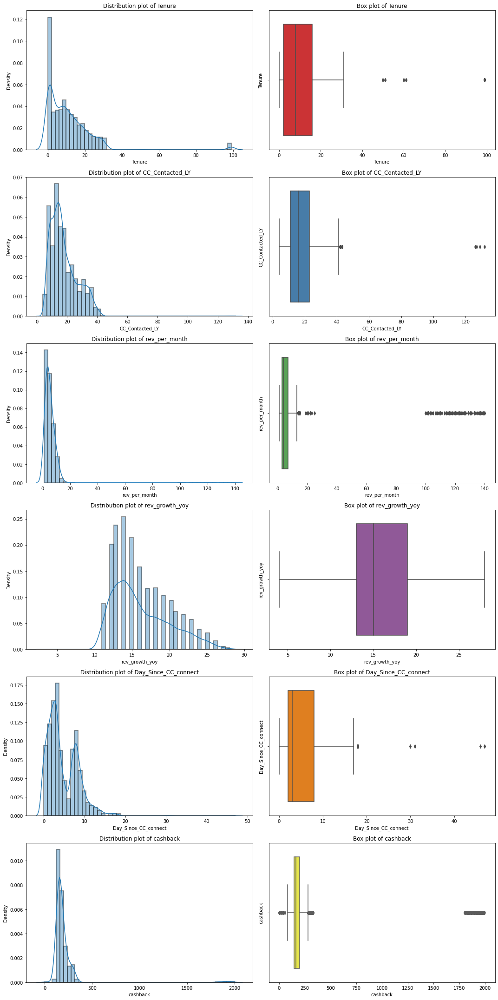

In [ ]:
# Distribution and boxplots of the variables

a = len(num_col_list)  # number of rows
b = 2  # number of columns
c = 1  # initialize plot counter

fig1 = plt.figure(figsize=(15,30))

for i in num_col_list:
    plt.subplot(a, b, c)
    plt.title('Distribution plot of {}'.format(i))
    plt.xlabel(i)
    sns.distplot(churn_df[i], hist_kws=dict(edgecolor="k", linewidth=2))
    c = c + 1

    plt.subplot(a, b, c)
    plt.title('Box plot of {}'.format(i))
    plt.ylabel(i)
    sns.boxplot(x = churn_df[i], orient='h', palette=palette1)
    c = c + 1

plt.tight_layout()
plt.show()

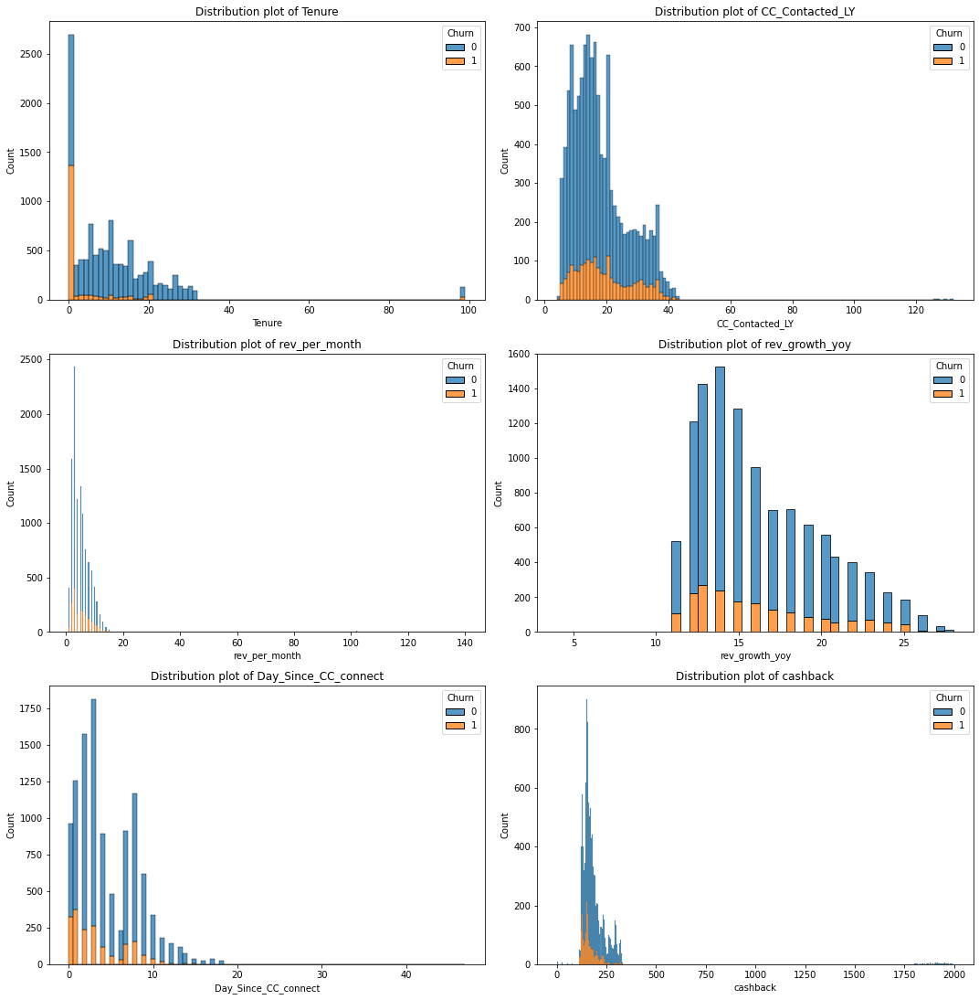

In [ ]:
# Distribution and boxplots of the variables

a = len(num_col_list)  # number of rows
b = 2  # number of columns
c = 1  # initialize plot counter

fig1 = plt.figure(figsize=(15,30))

for i in num_col_list:
    plt.subplot(a, b, c)
    plt.title('Distribution plot of {}'.format(i))
    plt.xlabel(i)
    sns.histplot(data=churn_df, x=churn_df[i], hue='Churn', multiple='stack')
    c = c + 1

plt.tight_layout()
plt.show()

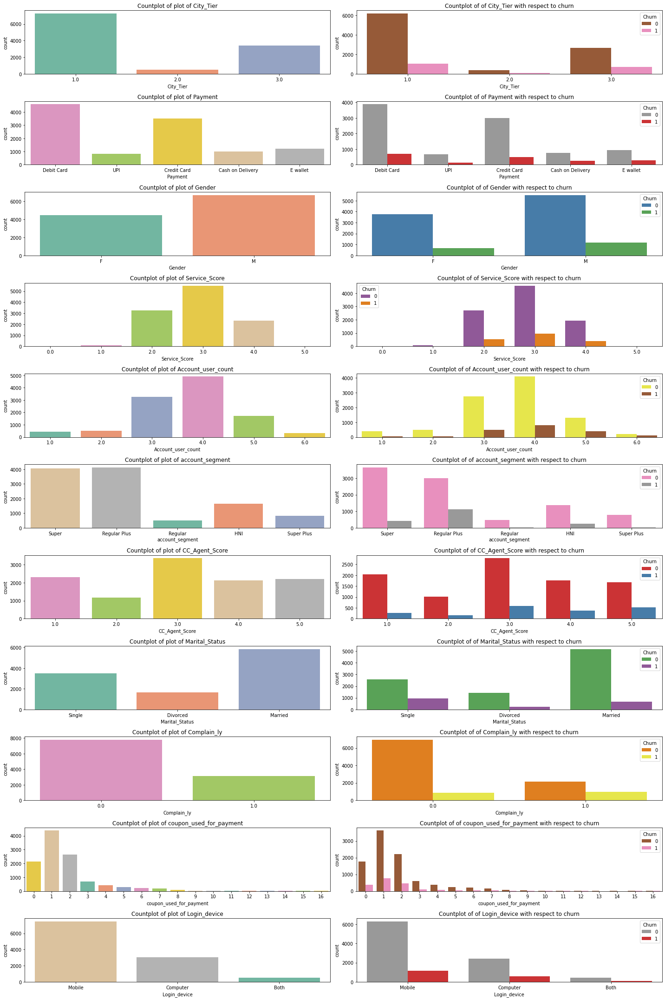

In [ ]:
#Count plots of the categorical variables

a = len(cat_col_list)  # number of rows
b = 2 # number of columns
c = 1  # initialize plot counter

fig2 = plt.figure(figsize=(20,30))

for i in cat_col_list:
    plt.subplot(a, b, c)
    plt.title('Countplot of plot of {}'.format(i))
    plt.xlabel(i)
    sns.countplot(data=churn_df, x=churn_df[i], palette=palette2);
    c = c + 1

    plt.subplot(a, b, c)
    plt.title('Countplot of of {} with respect to churn'.format(i))
    plt.xlabel(i)
    sns.countplot(data=churn_df, x=churn_df[i], hue='Churn', palette=palette1);
    c = c + 1

plt.tight_layout()
plt.show()

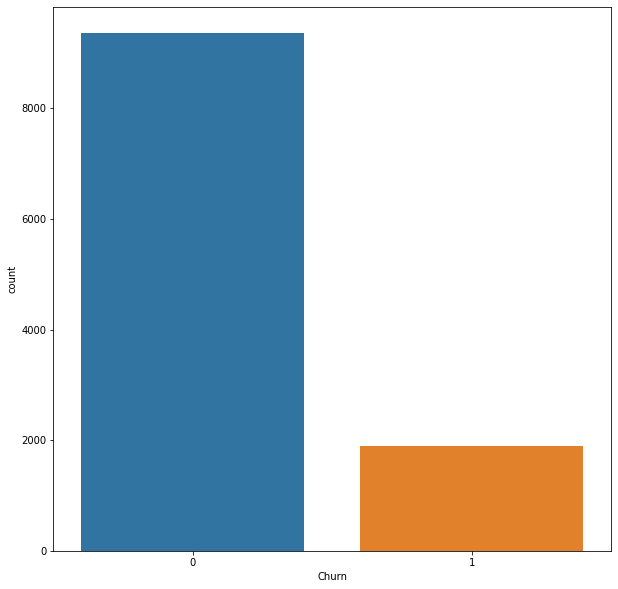

0    0.831616
1    0.168384
Name: Churn, dtype: float64

In [ ]:
fig3 = plt.figure(figsize=(10,10))
sns.countplot(x=churn_df['Churn']);
plt.show()
churn_df['Churn'].value_counts(normalize=True)

## **Multivariate Analysis**

<Figure size 720x720 with 0 Axes>

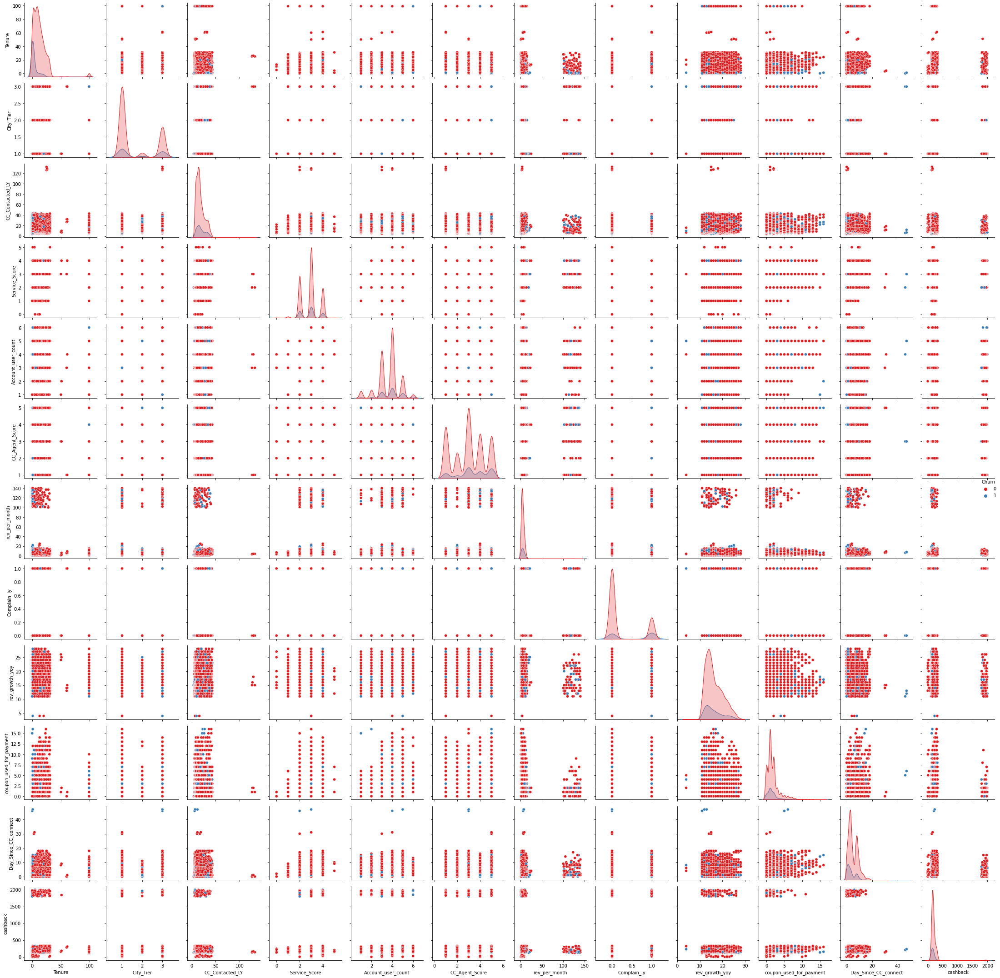

In [ ]:
# Pair plot of the numerical variables
fig5 = plt.figure(figsize=(10,10))
sns.pairplot(data=churn_df, hue='Churn', palette='Set1')
plt.tight_layout()
plt.show()

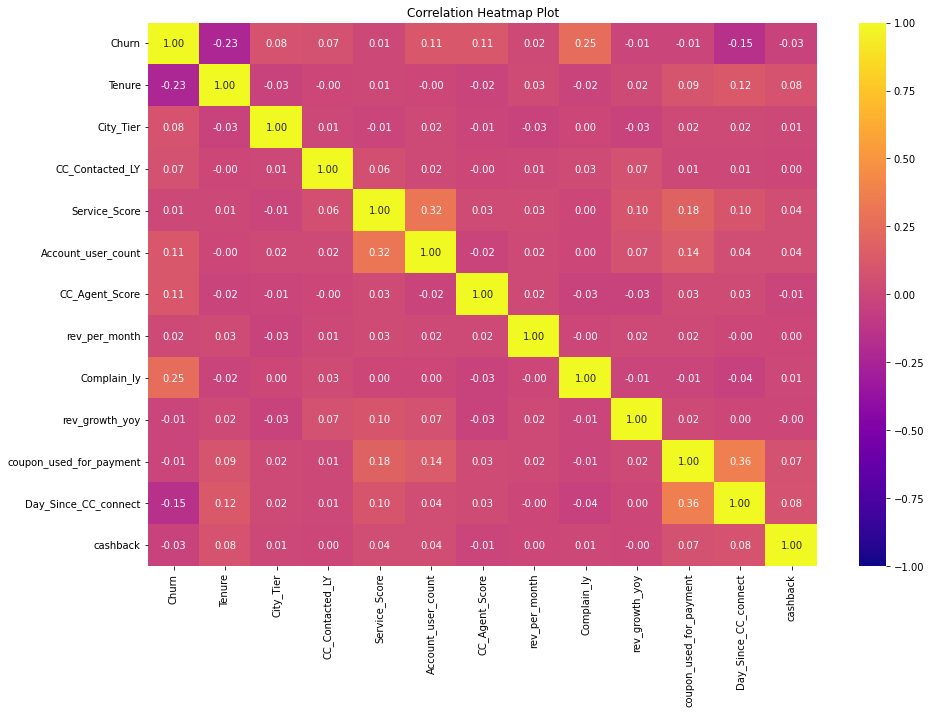

In [ ]:
fig6=plt.figure(figsize=(15,10))
sns.heatmap(round(churn_df.corr(),2),fmt='.2f',annot=True,cmap='plasma', vmin=-1, vmax=1,)
plt.title('Correlation Heatmap Plot')
plt.show()

## **Missing Value Treatment**

In [ ]:
churn_df.isnull().sum().sort_values(ascending=False)

cashback                   471
Day_Since_CC_connect       357
Complain_ly                357
Login_device               221
Marital_Status             212
CC_Agent_Score             116
Account_user_count         112
City_Tier                  112
Payment                    109
Gender                     108
Tenure                     102
rev_per_month              102
CC_Contacted_LY            102
Service_Score               98
account_segment             97
rev_growth_yoy               0
coupon_used_for_payment      0
Churn                        0
dtype: int64

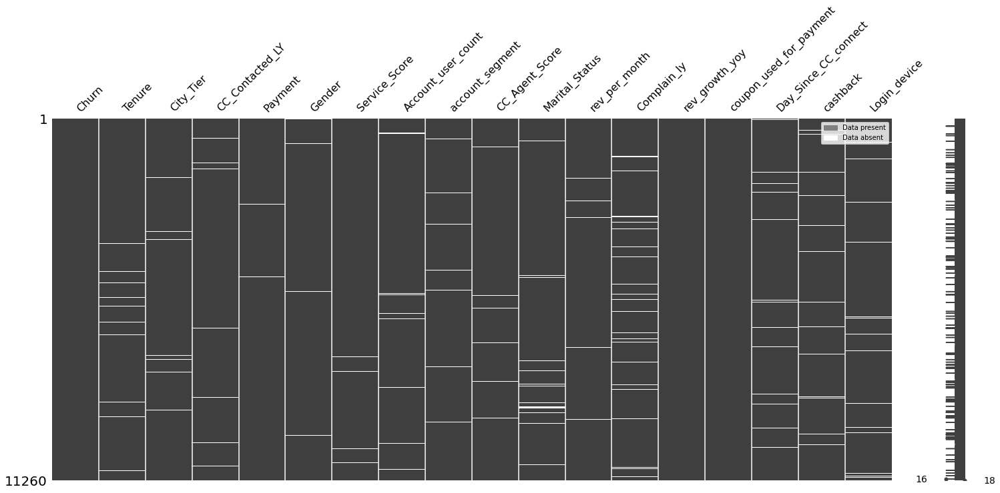

In [ ]:
msno.matrix(churn_df);
gray_patch = mpatches.Patch(color='gray', label='Data present')
white_patch = mpatches.Patch(color='white', label='Data absent ')
plt.legend(handles=[gray_patch, white_patch])
plt.show()

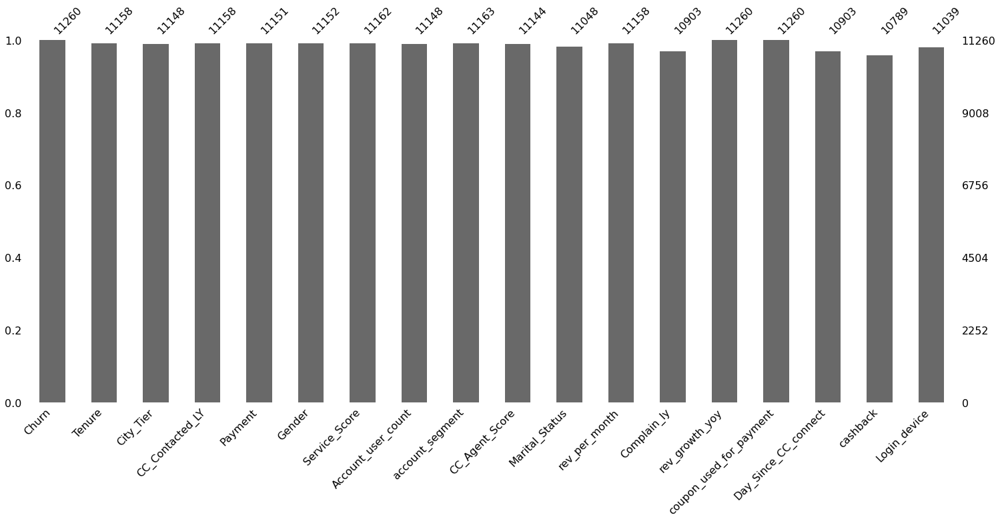

In [ ]:
msno.bar(churn_df);

In [ ]:
round(churn_df.isnull().sum().sort_values(ascending=False) / rows * 100,2)

cashback                   4.18
Day_Since_CC_connect       3.17
Complain_ly                3.17
Login_device               1.96
Marital_Status             1.88
CC_Agent_Score             1.03
Account_user_count         0.99
City_Tier                  0.99
Payment                    0.97
Gender                     0.96
Tenure                     0.91
rev_per_month              0.91
CC_Contacted_LY            0.91
Service_Score              0.87
account_segment            0.86
rev_growth_yoy             0.00
coupon_used_for_payment    0.00
Churn                      0.00
dtype: float64

In [ ]:
for column in churn_df.columns:
  if (column in num_col_list):
    churn_df[column] = churn_df[column].fillna(churn_df[column].mean())
  elif (column in cat_col_list):
    churn_df[column] = churn_df[column].fillna(churn_df[column].mode()[0])

In [ ]:
round(churn_df.isnull().sum().sort_values(ascending=False) / rows * 100,2)

Churn                      0.0
Tenure                     0.0
cashback                   0.0
Day_Since_CC_connect       0.0
coupon_used_for_payment    0.0
rev_growth_yoy             0.0
Complain_ly                0.0
rev_per_month              0.0
Marital_Status             0.0
CC_Agent_Score             0.0
account_segment            0.0
Account_user_count         0.0
Service_Score              0.0
Gender                     0.0
Payment                    0.0
CC_Contacted_LY            0.0
City_Tier                  0.0
Login_device               0.0
dtype: float64

## **Outlier Treatment**

In [ ]:
q1 = churn_df.loc[:, churn_df.columns!='Churn'].quantile(0.25)
q3 = churn_df.loc[:, churn_df.columns!='Churn'].quantile(0.75)
IQR = q3 - q1
upper_limit = q3 + (1.5 * IQR)   
lower_limit = q1 - (1.5 * IQR)

In [ ]:
outlier_df = pd.DataFrame()
outlier_df['% Upper Outlier'] = ((churn_df.loc[:, churn_df.columns!='Churn'] > upper_limit).sum()/len(churn_df)*100)
outlier_df['% Lower Outlier'] = ((churn_df.loc[:, churn_df.columns!='Churn'] < lower_limit).sum()/len(churn_df)*100)
outlier_df['% Total Outlier'] = outlier_df['% Upper Outlier'] + outlier_df['% Lower Outlier']
outlier_df.sort_values(by='% Total Outlier', ascending=False)

,% Upper Outlier,% Lower Outlier,% Total Outlier
coupon_used_for_payment,12.255773,0.000000,12.255773
cashback,8.579041,0.195382,8.774423
Account_user_count,2.797513,3.960924,6.758437
rev_per_month,1.642984,0.000000,1.642984
Tenure,1.234458,0.000000,1.234458
Day_Since_CC_connect,1.154529,0.000000,1.154529
CC_Contacted_LY,0.373002,0.000000,0.373002
Service_Score,0.044405,0.071048,0.115453
Complain_ly,0.000000,0.000000,0.000000
Gender,0.000000,0.000000,0.000000


In [ ]:
churn_df.columns

Index(['Churn', 'Tenure', 'City_Tier', 'CC_Contacted_LY', 'Payment', 'Gender',
       'Service_Score', 'Account_user_count', 'account_segment',
       'CC_Agent_Score', 'Marital_Status', 'rev_per_month', 'Complain_ly',
       'rev_growth_yoy', 'coupon_used_for_payment', 'Day_Since_CC_connect',
       'cashback', 'Login_device'],
      dtype='object')

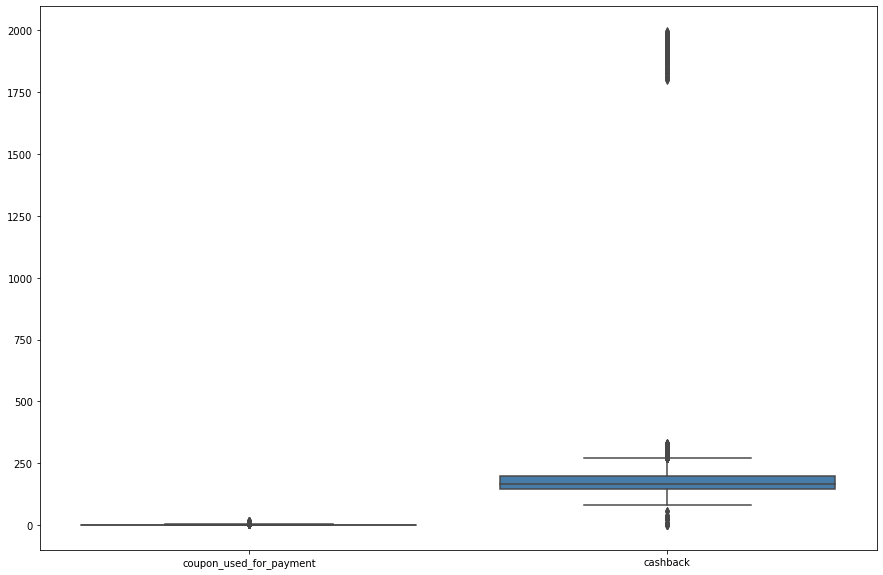

In [ ]:
fig7=plt.figure(figsize=(15,10))
sns.boxplot(data=churn_df[['coupon_used_for_payment','cashback' ]], palette='Set1', orient='v');
plt.show()

In [ ]:
def remove_outlier(col):
    sorted(col)
    q1 = col.quantile(0.25)
    q3 = col.quantile(0.75)
    IQR = q3 - q1
    lower_range= q1-(1.5 * IQR)
    upper_range= q3+(1.5 * IQR)
    return lower_range, upper_range

In [ ]:
outlier_col_list = ['coupon_used_for_payment','cashback' ]
outlier_col_list

['coupon_used_for_payment', 'cashback']

In [ ]:
for column in outlier_col_list:
  lr,ur=remove_outlier(churn_df[column])
  churn_df[column]=np.where(churn_df[column]>ur,ur,churn_df[column])
  churn_df[column]=np.where(churn_df[column]<lr,lr,churn_df[column])

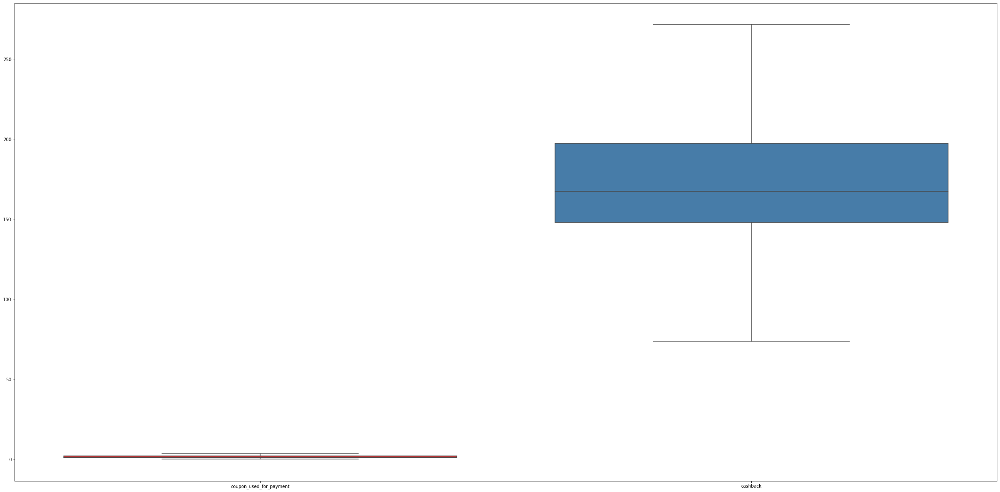

In [ ]:
fig8=plt.figure(figsize=(40,20))
sns.boxplot(data=churn_df[['coupon_used_for_payment','cashback']], palette='Set1', orient='v');
plt.show()

In [ ]:
cat_col_list

['City_Tier',
 'Payment',
 'Gender',
 'Service_Score',
 'Account_user_count',
 'account_segment',
 'CC_Agent_Score',
 'Marital_Status',
 'Complain_ly',
 'coupon_used_for_payment',
 'Login_device']

In [ ]:
cat_col_list1 = ['Payment', 'Gender','account_segment','Marital_Status','Login_device']

In [ ]:
for feature in cat_col_list1: 
    print('\n')
    print('Feature:',feature)
    print(pd.Categorical(churn_df[feature].unique()))
    print(pd.Categorical(churn_df[feature].unique()).codes)
    churn_df[feature] = pd.Categorical(churn_df[feature]).codes



Feature: Payment
['Debit Card', 'UPI', 'Credit Card', 'Cash on Delivery', 'E wallet']
Categories (5, object): ['Cash on Delivery', 'Credit Card', 'Debit Card', 'E wallet', 'UPI']
[2 4 1 0 3]


Feature: Gender
['F', 'M']
Categories (2, object): ['F', 'M']
[0 1]


Feature: account_segment
['Super', 'Regular Plus', 'Regular', 'HNI', 'Super Plus']
Categories (5, object): ['HNI', 'Regular', 'Regular Plus', 'Super', 'Super Plus']
[3 2 1 0 4]


Feature: Marital_Status
['Single', 'Divorced', 'Married']
Categories (3, object): ['Divorced', 'Married', 'Single']
[2 0 1]


Feature: Login_device
['Mobile', 'Computer', 'Both']
Categories (3, object): ['Both', 'Computer', 'Mobile']
[2 1 0]


In [ ]:
churn_df.head()

,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
0,1,4.0,3.0,6.0,2,0,3.0,3.0,3,2.0,2,9.0,1.0,11,1.0,5.0,159.930000,2
1,1,0.0,1.0,8.0,4,1,3.0,4.0,2,3.0,2,7.0,1.0,15,0.0,0.0,120.900000,2
2,1,0.0,1.0,30.0,2,1,2.0,4.0,2,3.0,2,6.0,1.0,14,0.0,3.0,196.199993,2
3,1,0.0,3.0,15.0,2,1,2.0,4.0,3,5.0,2,8.0,0.0,23,0.0,3.0,134.070000,2
4,1,0.0,1.0,12.0,1,1,2.0,3.0,2,5.0,2,3.0,0.0,11,1.0,3.0,129.600000,2


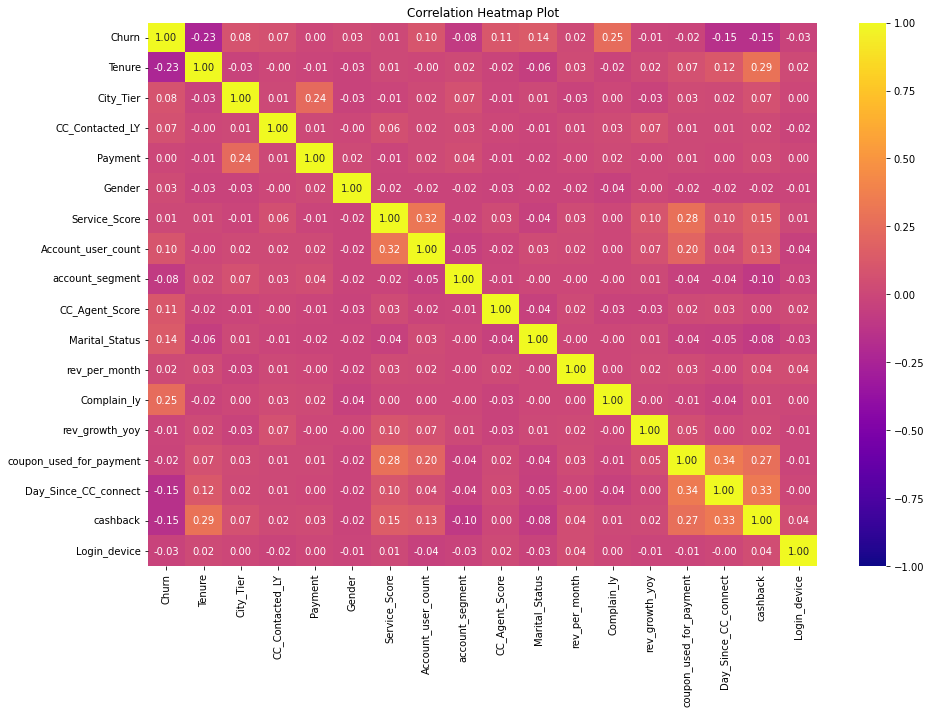

In [ ]:
fig7=plt.figure(figsize=(15,10))
sns.heatmap(round(churn_df.corr(),2),fmt='.2f',annot=True,cmap='plasma', vmin=-1, vmax=1,)
plt.title('Correlation Heatmap Plot')
plt.show()

## **RFM**

In [ ]:
rfm_df.head()

,AccountID,CC_Contacted_LY,rev_per_month,Day_Since_CC_connect
0,20000,6.0,9.0,5.0
1,20001,8.0,7.0,0.0
2,20002,30.0,6.0,3.0
3,20003,15.0,8.0,3.0
4,20004,12.0,3.0,3.0


In [ ]:
rfm_df.set_index('AccountID', inplace=True)
rfm_df.head()

,CC_Contacted_LY,rev_per_month,Day_Since_CC_connect
AccountID,,,
20000,6.0,9.0,5.0
20001,8.0,7.0,0.0
20002,30.0,6.0,3.0
20003,15.0,8.0,3.0
20004,12.0,3.0,3.0


In [ ]:
rfm_df.rename(columns={'CC_Contacted_LY': 'Frequency', 
                         'rev_per_month': 'Monetary',
                         'Day_Since_CC_connect': 'Recency'}, inplace=True)
rfm_df.head()

,Frequency,Monetary,Recency
AccountID,,,
20000,6.0,9.0,5.0
20001,8.0,7.0,0.0
20002,30.0,6.0,3.0
20003,15.0,8.0,3.0
20004,12.0,3.0,3.0


In [ ]:
#Calculating R and F groups
# Create labels for Recency, Frequency and Monetary
r_labels = range(1, 5, 1); f_labels = range(4, 0, -1); m_labels = range(1, 5, 1)
# Assign these labels to 4 equal percentile groups 
r_groups = pd.qcut(rfm_df['Recency'], q=4, labels=r_labels)
# Assign these labels to 4 equal percentile groups 
f_groups = pd.qcut(rfm_df['Frequency'], q=4, labels=f_labels)
# Create new columns R and F 
rfm_df = rfm_df.assign(R = r_groups.values, F = f_groups.values)
# Assign these labels to 4 equal percentile groups 
m_groups = pd.qcut(rfm_df['Monetary'], q=4, labels=m_labels)
# Create new column M
rfm_df = rfm_df.assign(M = m_groups.values)
rfm_df.head(5)

,Frequency,Monetary,Recency,R,F,M
AccountID,,,,,,
20000,6.0,9.0,5.0,3,4,4
20001,8.0,7.0,0.0,1,4,3
20002,30.0,6.0,3.0,2,1,3
20003,15.0,8.0,3.0,2,3,4
20004,12.0,3.0,3.0,2,3,1


In [ ]:
# Concating the RFM quartile values to create RFM Segments
def join_rfm(x): return (str(x['R']).replace('.0','') + str(x['F']).replace('.0','') + str(x['M']).replace('.0',''))
rfm_df['RFM_Segment'] = rfm_df.apply(join_rfm, axis=1)
final_rfm_df = rfm_df
final_rfm_df.head()

,Frequency,Monetary,Recency,R,F,M,RFM_Segment
AccountID,,,,,,,
20000,6.0,9.0,5.0,3,4,4,344
20001,8.0,7.0,0.0,1,4,3,143
20002,30.0,6.0,3.0,2,1,3,213
20003,15.0,8.0,3.0,2,3,4,234
20004,12.0,3.0,3.0,2,3,1,231


In [ ]:
# Calculate RFM_Score
final_rfm_df['RFM_Score'] = final_rfm_df[['R','F','M']].sum(axis=1)
final_rfm_df.head()

,Frequency,Monetary,Recency,R,F,M,RFM_Segment,RFM_Score
AccountID,,,,,,,,
20000,6.0,9.0,5.0,3,4,4,344,11
20001,8.0,7.0,0.0,1,4,3,143,8
20002,30.0,6.0,3.0,2,1,3,213,6
20003,15.0,8.0,3.0,2,3,4,234,9
20004,12.0,3.0,3.0,2,3,1,231,6


In [ ]:
# Define rfm_level function
def rfm_level(df):
    if df['RFM_Score'] >= 9:
        return 'Best Customer'
    elif ((df['RFM_Score'] >= 7) and (df['RFM_Score'] < 9)):
        return 'Loyal Customer'
    elif ((df['RFM_Score'] >= 5) and (df['RFM_Score'] < 7)):
        return 'Potential Churn Customer'
    elif ((df['RFM_Score'] >= 4) and (df['RFM_Score'] < 5)):
        return 'About to Churn Customer'
    else:
        return 'Churned Customer'
# Create a new variable RFM_Level
final_rfm_df['RFM_Level'] = final_rfm_df.apply(rfm_level, axis=1)
# Printing the header with top 15 rows 
final_rfm_df.head(5)

,Frequency,Monetary,Recency,R,F,M,RFM_Segment,RFM_Score,RFM_Level
AccountID,,,,,,,,,
20000,6.0,9.0,5.0,3,4,4,344,11,Best Customer
20001,8.0,7.0,0.0,1,4,3,143,8,Loyal Customer
20002,30.0,6.0,3.0,2,1,3,213,6,Potential Churn Customer
20003,15.0,8.0,3.0,2,3,4,234,9,Best Customer
20004,12.0,3.0,3.0,2,3,1,231,6,Potential Churn Customer


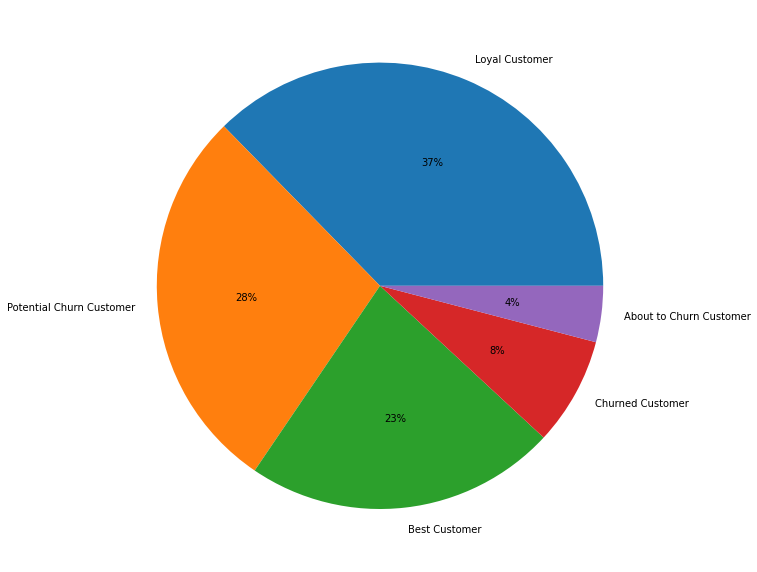

In [ ]:
fig7=plt.figure(figsize=(10,15))
plt.pie(final_rfm_df.RFM_Level.value_counts(),
        labels=final_rfm_df.RFM_Level.value_counts().index,
        autopct='%.0f%%')
plt.show()

## **X-Y Split**

In [ ]:
X = churn_df.drop("Churn", axis=1)
y = churn_df.pop("Churn")

In [ ]:
# Z-Score Scaling

X_scaled = X.apply(zscore)
X_scaled.head()

,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
0,-0.540945,1.481914,-1.346592,0.236005,-1.237528,0.133748,-0.701928,0.743123,-0.776488,1.268725,0.247149,1.618461,-1.382086,-0.431239,0.100863,-0.426608,0.63596
1,-0.853591,-0.709334,-1.119646,2.220635,0.808063,0.133748,0.293752,-0.150848,-0.047944,1.268725,0.073409,1.618461,-0.317470,-1.338515,-1.273426,-1.320171,0.63596
2,-0.853591,-0.709334,1.376755,0.236005,0.808063,-1.250443,0.293752,-0.150848,-0.047944,1.268725,-0.013461,1.618461,-0.583624,-1.338515,-0.448853,0.403766,0.63596
3,-0.853591,1.481914,-0.325337,0.236005,0.808063,-1.250443,0.293752,0.743123,1.409143,1.268725,0.160279,-0.617871,1.811761,-1.338515,-0.448853,-1.018653,0.63596
4,-0.853591,-0.709334,-0.665755,-0.756310,0.808063,-1.250443,-0.701928,-0.150848,1.409143,1.268725,-0.274072,-0.617871,-1.382086,-0.431239,-0.448853,-1.120991,0.63596


## **Model Building**

### **Calculate VIF and Drop Columns Iteratively**

In [ ]:
def calc_vif(X):

    # Calculating VIF
    vif = pd.DataFrame()
    vif["Variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(len(X.columns))]

    return(vif)

In [ ]:
vif = calc_vif(X).sort_values(by = 'VIF', ascending = False)
vif

,Variables,VIF
15,cashback,20.059364
5,Service_Score,19.144311
12,rev_growth_yoy,16.472924
6,Account_user_count,15.670113
16,Login_device,8.290536
8,CC_Agent_Score,5.597379
2,CC_Contacted_LY,5.037911
7,account_segment,4.536492
1,City_Tier,4.523519
3,Payment,4.253613


In [ ]:
import time
import math
start = time.time()

for i in range(65):
    v = calc_vif(X).sort_values(by = 'VIF', ascending = False)
    if (v.iloc[0,1] > 5):
        X = X.drop(columns=v.iloc[0,0])

end = time.time()
print('Time taken =', end-start)

Time taken = 9.138418912887573


In [ ]:
calc_vif(X).sort_values(by = 'VIF', ascending = False)

,Variables,VIF
6,CC_Agent_Score,4.793383
2,CC_Contacted_LY,4.448713
1,City_Tier,4.285246
5,account_segment,4.219887
3,Payment,4.055596
7,Marital_Status,3.529342
10,coupon_used_for_payment,3.071203
11,Day_Since_CC_connect,2.938669
4,Gender,2.343480
0,Tenure,1.720449


In [ ]:
vif = calc_vif(X_scaled).sort_values(by = 'VIF', ascending = False)
vif

,Variables,VIF
15,cashback,1.299191
13,coupon_used_for_payment,1.264980
14,Day_Since_CC_connect,1.228213
5,Service_Score,1.192755
6,Account_user_count,1.147093
0,Tenure,1.108877
1,City_Tier,1.079648
3,Payment,1.067185
7,account_segment,1.024399
12,rev_growth_yoy,1.020699


In [ ]:
start = time.time()

for i in range(65):
    v1 = calc_vif(X_scaled).sort_values(by = 'VIF', ascending = False)
    if (v1.iloc[0,1] > 5):
        X_scaled = X_scaled.drop(columns=v1.iloc[0,0])

end = time.time()
print('Time taken =', end-start)

Time taken = 17.58963418006897


In [ ]:
calc_vif(X_scaled).sort_values(by = 'VIF', ascending = False)

,Variables,VIF
15,cashback,1.299191
13,coupon_used_for_payment,1.264980
14,Day_Since_CC_connect,1.228213
5,Service_Score,1.192755
6,Account_user_count,1.147093
0,Tenure,1.108877
1,City_Tier,1.079648
3,Payment,1.067185
7,account_segment,1.024399
12,rev_growth_yoy,1.020699


### **Train-Test Split**

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=1)

In [ ]:
print('X_train',X_train.shape)
print('X_test',X_test.shape)
print('y_train',y_train.shape)
print('y_test',y_test.shape)

X_train (7882, 12)
X_test (3378, 12)
y_train (7882,)
y_test (3378,)


In [ ]:
X_scaled_train, X_scaled_test, y_scaled_train, y_scaled_test = train_test_split(X_scaled, y, test_size=0.30, random_state=1)

In [ ]:
print('X_scaled_train',X_scaled_train.shape)
print('X_scaled_test',X_scaled_test.shape)
print('y_scaled_train',y_scaled_train.shape)
print('y_scaled_test',y_scaled_test.shape)

X_scaled_train (7882, 17)
X_scaled_test (3378, 17)
y_scaled_train (7882,)
y_scaled_test (3378,)


### **SMOTE**

In [ ]:
smote_unscaled = SMOTE(random_state=1)

X_train_smote, y_train_smote = smote_unscaled.fit_resample(X_train, y_train)

In [ ]:
X_test_smote = X_test
y_test_smote = y_test

In [ ]:
print('X_train_smote',X_train_smote.shape)
print('y_train_smote',y_train_smote.shape)
print('X_test_smote',X_test_smote.shape)
print('y_test_smote',y_test_smote.shape)

X_train_smote (13112, 12)
y_train_smote (13112,)
X_test_smote (3378, 12)
y_test_smote (3378,)


In [ ]:
smote_scaled = SMOTE(random_state=1)

X_scaled_train_smote, y_scaled_train_smote = smote_scaled.fit_resample(X_scaled_train, y_scaled_train)

In [ ]:
print('X_scaled_train_smote',X_scaled_train_smote.shape)
print('y_scaled_train_smote',y_scaled_train_smote.shape)

X_scaled_train_smote (13112, 17)
y_scaled_train_smote (13112,)


In [ ]:
X_scaled_test_smote = X_scaled_test
y_scaled_test_smote = y_scaled_test

In [ ]:
print('X_scaled_train_smote',X_scaled_train_smote.shape)
print('y_scaled_train_smote',y_scaled_train_smote.shape)
print('X_scaled_test_smote',X_scaled_test_smote.shape)
print('y_scaled_test_smote',y_scaled_test_smote.shape)

X_scaled_train_smote (13112, 17)
y_scaled_train_smote (13112,)
X_scaled_test_smote (3378, 17)
y_scaled_test_smote (3378,)


### **Fit SM Logit and Drop Columns Iteratively**

In [ ]:
unscaled_model_1 = sm.Logit(y_train, X_train).fit()
unscaled_model_1.summary()

Optimization terminated successfully.
         Current function value: 0.355688
         Iterations 8


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                  Churn   No. Observations:                 7882
Model:                          Logit   Df Residuals:                     7870
Method:                           MLE   Df Model:                           11
Date:                Fri, 17 Jun 2022   Pseudo R-squ.:                  0.2149
Time:                        09:55:25   Log-Likelihood:                -2803.5
converged:                       True   LL-Null:                       -3571.1
Covariance Type:            nonrobust   LLR p-value:                     0.000
===========================================================================================
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Tenure                     -0.1449      0.006    -24.219      0.000      -0.157      -0.133
City_Tier                   0.1536      0.036      4.219      0.000       0.082       0.225
CC_Contacted_LY         -8.528e-05      0.004     -0.023      0.982      -0.007       0.007
Payment                    -0.1895      0.033     -5.680      0.000      -0.255      -0.124
Gender                     -0.0598      0.066     -0.902      0.367      -0.190       0.070
account_segment            -0.5025      0.032    -15.884      0.000      -0.564      -0.440
CC_Agent_Score              0.0998      0.022      4.519      0.000       0.057       0.143
Marital_Status              0.2344      0.047      4.992      0.000       0.142       0.326
rev_per_month               0.0076      0.003      2.928      0.003       0.003       0.013
Complain_ly                 1.3388      0.070     19.237      0.000       1.202       1.475
coupon_used_for_payment     0.0520      0.034      1.540      0.124      -0.014       0.118
Day_Since_CC_connect       -0.1394      0.012    -11.276      0.000      -0.164      -0.115
===========================================================================================
"""

In [ ]:
p_val_unscaled_df = pd.DataFrame(unscaled_model_1.pvalues.sort_values(ascending=False), columns=['p-value']).reset_index()
p_val_unscaled_df

,index,p-value
0,CC_Contacted_LY,9.817380e-01
1,Gender,3.668316e-01
2,coupon_used_for_payment,1.236321e-01
3,rev_per_month,3.411118e-03
4,City_Tier,2.454754e-05
5,CC_Agent_Score,6.223355e-06
6,Marital_Status,5.987247e-07
7,Payment,1.343446e-08
8,Day_Since_CC_connect,1.716308e-29
9,account_segment,8.144414e-57


In [ ]:
import time
start = time.time()

for i in range(25):
    unscaled_model_2 = sm.Logit(y_train, X_train).fit()
    v1 = pd.DataFrame(unscaled_model_2.pvalues.sort_values(ascending=False), columns=['pvalue']).reset_index()
    if (v1.iloc[0,1] > 0.05):
        X_train = X_train.drop(columns=v1.iloc[0,0])

end = time.time()
print('Time taken =', end-start)

Optimization terminated successfully.
         Current function value: 0.355688
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.355688
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.355740
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.355885
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.355885
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.355885
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.355885
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.355885
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.355885
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.355885
  

In [ ]:
p_val_unscaled_df_1 = pd.DataFrame(unscaled_model_2.pvalues.sort_values(ascending=False), columns=['p-value']).reset_index()
p_val_unscaled_df_1

,index,p-value
0,rev_per_month,2.873569e-03
1,City_Tier,1.449029e-05
2,CC_Agent_Score,2.127448e-06
3,Marital_Status,3.478519e-07
4,Payment,9.442425e-09
5,Day_Since_CC_connect,1.398020e-31
6,account_segment,6.641242e-60
7,Complain_ly,6.430321e-84
8,Tenure,1.430786e-131


In [ ]:
X_train.shape

(7882, 9)

In [ ]:
y_train.shape

(7882,)

In [ ]:
X_test = X_test[X_train.columns]

In [ ]:
X_test.shape

(3378, 9)

In [ ]:
scaled_model_1 = sm.Logit(y_scaled_train, X_scaled_train).fit()
scaled_model_1.summary()

Optimization terminated successfully.
         Current function value: 0.635760
         Iterations 5


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                  Churn   No. Observations:                 7882
Model:                          Logit   Df Residuals:                     7865
Method:                           MLE   Df Model:                           16
Date:                Fri, 17 Jun 2022   Pseudo R-squ.:                 -0.4032
Time:                        09:55:26   Log-Likelihood:                -5011.1
converged:                       True   LL-Null:                       -3571.1
Covariance Type:            nonrobust   LLR p-value:                     1.000
===========================================================================================
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Tenure                     -0.3343      0.031    -10.644      0.000      -0.396      -0.273
City_Tier                   0.1688      0.025      6.745      0.000       0.120       0.218
CC_Contacted_LY             0.1247      0.025      5.087      0.000       0.077       0.173
Payment                    -0.0396      0.025     -1.609      0.108      -0.088       0.009
Gender                      0.0542      0.024      2.256      0.024       0.007       0.101
Service_Score              -0.0358      0.026     -1.384      0.167      -0.087       0.015
Account_user_count          0.1706      0.025      6.733      0.000       0.121       0.220
account_segment            -0.1453      0.025     -5.916      0.000      -0.193      -0.097
CC_Agent_Score              0.2007      0.024      8.325      0.000       0.153       0.248
Marital_Status              0.2215      0.024      9.130      0.000       0.174       0.269
rev_per_month               0.0614      0.024      2.548      0.011       0.014       0.109
Complain_ly                 0.4114      0.025     16.737      0.000       0.363       0.460
rev_growth_yoy             -0.0112      0.024     -0.460      0.646      -0.059       0.037
coupon_used_for_payment     0.0458      0.027      1.705      0.088      -0.007       0.098
Day_Since_CC_connect       -0.1525      0.027     -5.687      0.000      -0.205      -0.100
cashback                   -0.1390      0.028     -4.920      0.000      -0.194      -0.084
Login_device               -0.0302      0.024     -1.272      0.203      -0.077       0.016
===========================================================================================
"""

In [ ]:
p_val_scaled_df = pd.DataFrame(scaled_model_1.pvalues.sort_values(ascending=False), columns=['p-value']).reset_index()
p_val_scaled_df

,index,p-value
0,rev_growth_yoy,6.458610e-01
1,Login_device,2.033765e-01
2,Service_Score,1.665007e-01
3,Payment,1.076010e-01
4,coupon_used_for_payment,8.817109e-02
5,Gender,2.403970e-02
6,rev_per_month,1.082943e-02
7,cashback,8.634248e-07
8,CC_Contacted_LY,3.638834e-07
9,Day_Since_CC_connect,1.289337e-08


In [ ]:
import time
start = time.time()

for i in range(25):
    scaled_model_2 = sm.Logit(y_scaled_train, X_scaled_train).fit()
    v2 = pd.DataFrame(scaled_model_2.pvalues.sort_values(ascending=False), columns=['pvalue']).reset_index()
    if (v2.iloc[0,1] > 0.05):
        X_scaled_train = X_scaled_train.drop(columns=v2.iloc[0,0])

end = time.time()
print('Time taken =', end-start)

Optimization terminated successfully.
         Current function value: 0.635760
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.635773
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.635875
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.636006
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.636137
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.636297
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.636297
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.636297
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.636297
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.636297
  

In [ ]:
p_val_scaled_df_1 = pd.DataFrame(scaled_model_2.pvalues.sort_values(ascending=False), columns=['p-value']).reset_index()
p_val_scaled_df_1

,index,p-value
0,Gender,2.541617e-02
1,rev_per_month,1.200327e-02
2,cashback,7.611195e-07
3,CC_Contacted_LY,4.924800e-07
4,Day_Since_CC_connect,3.934210e-08
5,account_segment,2.251762e-09
6,City_Tier,4.055325e-11
7,Account_user_count,3.645209e-12
8,CC_Agent_Score,7.807696e-17
9,Marital_Status,2.023546e-20


In [ ]:
X_scaled_train.shape

(7882, 12)

In [ ]:
y_scaled_train.shape

(7882,)

In [ ]:
X_scaled_test = X_scaled_test[X_scaled_train.columns]

In [ ]:
X_scaled_test.shape

(3378, 12)

In [ ]:
unscaled_smote_model_1 = sm.Logit(y_train_smote, X_train_smote).fit()
unscaled_smote_model_1.summary()

Optimization terminated successfully.
         Current function value: 0.516065
         Iterations 6


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                  Churn   No. Observations:                13112
Model:                          Logit   Df Residuals:                    13100
Method:                           MLE   Df Model:                           11
Date:                Fri, 17 Jun 2022   Pseudo R-squ.:                  0.2555
Time:                        09:55:27   Log-Likelihood:                -6766.6
converged:                       True   LL-Null:                       -9088.5
Covariance Type:            nonrobust   LLR p-value:                     0.000
===========================================================================================
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Tenure                     -0.0988      0.003    -32.733      0.000      -0.105      -0.093
City_Tier                   0.3341      0.024     14.121      0.000       0.288       0.380
CC_Contacted_LY             0.0151      0.002      6.676      0.000       0.011       0.020
Payment                    -0.2708      0.021    -12.738      0.000      -0.313      -0.229
Gender                     -0.2238      0.041     -5.415      0.000      -0.305      -0.143
account_segment            -0.4560      0.021    -21.596      0.000      -0.497      -0.415
CC_Agent_Score              0.2432      0.014     17.316      0.000       0.216       0.271
Marital_Status              0.2359      0.029      8.130      0.000       0.179       0.293
rev_per_month               0.0074      0.002      4.150      0.000       0.004       0.011
Complain_ly                 1.5063      0.047     32.360      0.000       1.415       1.598
coupon_used_for_payment     0.1481      0.022      6.763      0.000       0.105       0.191
Day_Since_CC_connect       -0.1228      0.007    -17.282      0.000      -0.137      -0.109
===========================================================================================
"""

In [ ]:
p_val_unscaled_smote_df = pd.DataFrame(unscaled_smote_model_1.pvalues.sort_values(ascending=False), columns=['p-value']).reset_index()
p_val_unscaled_smote_df

,index,p-value
0,rev_per_month,3.328287e-05
1,Gender,6.114611e-08
2,CC_Contacted_LY,2.452988e-11
3,coupon_used_for_payment,1.348803e-11
4,Marital_Status,4.281079e-16
5,Payment,3.620102e-37
6,City_Tier,2.823309e-45
7,Day_Since_CC_connect,6.411765e-67
8,CC_Agent_Score,3.591115e-67
9,account_segment,1.943657e-103


In [ ]:
scaled_smote_model_1 = sm.Logit(y_scaled_train_smote, X_scaled_train_smote).fit()
scaled_smote_model_1.summary()

Optimization terminated successfully.
         Current function value: 0.538146
         Iterations 6


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                  Churn   No. Observations:                13112
Model:                          Logit   Df Residuals:                    13095
Method:                           MLE   Df Model:                           16
Date:                Fri, 17 Jun 2022   Pseudo R-squ.:                  0.2236
Time:                        09:55:27   Log-Likelihood:                -7056.2
converged:                       True   LL-Null:                       -9088.5
Covariance Type:            nonrobust   LLR p-value:                     0.000
===========================================================================================
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Tenure                     -0.6075      0.031    -19.412      0.000      -0.669      -0.546
City_Tier                   0.2691      0.022     12.330      0.000       0.226       0.312
CC_Contacted_LY             0.1856      0.022      8.451      0.000       0.143       0.229
Payment                    -0.0900      0.021     -4.295      0.000      -0.131      -0.049
Gender                      0.0930      0.021      4.464      0.000       0.052       0.134
Service_Score              -0.0419      0.023     -1.814      0.070      -0.087       0.003
Account_user_count          0.2931      0.022     13.131      0.000       0.249       0.337
account_segment            -0.3242      0.023    -14.063      0.000      -0.369      -0.279
CC_Agent_Score              0.3415      0.021     16.125      0.000       0.300       0.383
Marital_Status              0.3121      0.020     15.297      0.000       0.272       0.352
rev_per_month               0.0843      0.021      4.002      0.000       0.043       0.126
Complain_ly                 0.5753      0.020     28.420      0.000       0.536       0.615
rev_growth_yoy             -0.0821      0.021     -3.856      0.000      -0.124      -0.040
coupon_used_for_payment     0.1475      0.024      6.102      0.000       0.100       0.195
Day_Since_CC_connect       -0.2603      0.024    -10.796      0.000      -0.308      -0.213
cashback                   -0.2883      0.027    -10.639      0.000      -0.341      -0.235
Login_device               -0.0406      0.021     -1.941      0.052      -0.082       0.000
===========================================================================================
"""

In [ ]:
p_val_scaled_smote_df = pd.DataFrame(scaled_smote_model_1.pvalues.sort_values(ascending=False), columns=['p-value']).reset_index()
p_val_scaled_smote_df

,index,p-value
0,Service_Score,6.961167e-02
1,Login_device,5.229918e-02
2,rev_growth_yoy,1.150423e-04
3,rev_per_month,6.290231e-05
4,Payment,1.744693e-05
5,Gender,8.028584e-06
6,coupon_used_for_payment,1.044339e-09
7,CC_Contacted_LY,2.878263e-17
8,cashback,1.957858e-26
9,Day_Since_CC_connect,3.591486e-27


In [ ]:
import time
start = time.time()

for i in range(25):
    scaled_smote_model_2 = sm.Logit(y_scaled_train_smote, X_scaled_train_smote).fit()
    v3 = pd.DataFrame(scaled_smote_model_2.pvalues.sort_values(ascending=False), columns=['pvalue']).reset_index()
    if (v3.iloc[0,1] > 0.05):
        X_scaled_train_smote = X_scaled_train_smote.drop(columns=v3.iloc[0,0])

end = time.time()
print('Time taken =', end-start)

Optimization terminated successfully.
         Current function value: 0.538146
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538272
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538412
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538412
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538412
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538412
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538412
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538412
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538412
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538412
  

In [ ]:
p_val_scaled_smote_df_1 = pd.DataFrame(scaled_smote_model_2.pvalues.sort_values(ascending=False), columns=['p-value']).reset_index()
p_val_scaled_smote_df_1

,index,p-value
0,rev_per_month,9.342766e-05
1,rev_growth_yoy,6.107147e-05
2,Payment,2.160520e-05
3,Gender,5.906796e-06
4,coupon_used_for_payment,4.073343e-09
5,CC_Contacted_LY,4.024037e-17
6,Day_Since_CC_connect,7.798310e-27
7,cashback,1.249382e-27
8,City_Tier,1.419753e-35
9,Account_user_count,1.478929e-39


In [ ]:
X_scaled_train_smote.shape

(13112, 15)

In [ ]:
y_scaled_train_smote.shape

(13112,)

In [ ]:
X_scaled_test_smote = X_scaled_test_smote[X_scaled_train_smote.columns]

In [ ]:
X_scaled_test_smote.shape

(3378, 15)

### **Instantiate the models**

In [ ]:
# Instantiate the models

#Instantiate the Logistic Regression Model
clfLR = LogisticRegression(random_state=1)

# Instantiate the LDA model
clfLDA = LinearDiscriminantAnalysis()

# Instantiate the KNN Classifier
clfKNN = KNeighborsClassifier(n_neighbors= 5 , weights = 'uniform')

# Instantiate the Gaussian Naive Bias Classifier
clfNB = GaussianNB()

# Instantiate the Decision Tree Classifier
clfDTC = DecisionTreeClassifier(random_state=1)

# Instantiate the Gaussian Classifier for the Ensemble Random Forest Classifier Model
clfRF=RandomForestClassifier(random_state=1)

# Instantiate the Adaboost Classifier Model
clfADB = AdaBoostClassifier(random_state=1)

# Instantiate the Gradient Boosting Model
clfGBC = GradientBoostingClassifier(random_state=1)

# Instantiate the Support Vector Machine Model
clfSVC = svm.SVC(probability=True)

# Instantiate the XGBoost Model
clfXGB= xgb.XGBClassifier(random_state=1)

# Instantiate the Bagging Classifier Model
clfBGCL = BaggingClassifier(base_estimator=RandomForestClassifier(), random_state=1)

In [ ]:
model_names = {clfLR:'Logistic Regression', clfLDA:'Linear Discriminant Analysis', clfKNN:'K-Nearest Neighbours Classifier', clfNB:'Gaussian Naive Bias Classifier', clfRF:'Ensemble Random Forest', clfADB:'Ada Boost',clfGBC:'Gradient Boosting', clfSVC:'Support Vector Machine', clfXGB:'XGBoost', clfBGCL:'Bagging Classifier Model', clfDTC:'Decision Tree Classifier'}

In [ ]:
# Parameter Grids

# Parameter Grid for Logistic Regression
param_grid_LR = {
    'penalty': ['l1', 'l2', 'elasticnet', 'none'],
    'tol': [0.0001,0.00001,0.000001],
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'], 
    'max_iter': [100,1000,10000,100000],
  }

# Parameter Grid for LDA
param_grid_LDA = {
    'solver':['svd', 'lsqr', 'eigen'],
    'tol': [0.0001,0.00001,0.000001],
    }

# Parmeter Grid for KNN
param_grid_KNN = {
    'n_neighbors': [2,3,4,5],
    'weights': ['uniform', 'distance'],
    'metric': ['minkowski','euclidean','manhattan'],
  }

# Parameter Grid for Gaussian Naive Bias
param_grid_NB = {
    'var_smoothing': np.logspace(0,-9, num=100)
}

# Parameter Grid for Decision Tree Classifier
param_grid_DTC = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [10,20,30,50],
    'min_samples_leaf': [50,100,150,200], 
    'min_samples_split': [150,300,450,500],
}

# Parameter Grid for Random Forest
param_grid_RF = {
    'n_estimators':[100, 250, 500],
    'criterion': ['gini', 'entropy'],
    'max_features':['auto', 'sqrt', 'log2'],
    'bootstrap': [True, False], 
    'max_samples': [100, 250, 500],
    }

# Parameter Grid for Adaptive Boosting Classifier
param_grid_ADB = {
          'n_estimators': [50, 100, 150],
          'learning_rate': [1.0, 1.5, 2.0],
          'algorithm': ['SAMME', 'SAMME.R'],
}

# Parameter Grid for Gradient Boosting Classifier
param_grid_GBC = {
          'loss': ['deviance', 'exponential'],
          'n_estimators': [100, 150, 200]
}

# Parameter Grid for Support Vector Machine
param_grid_SVC = {'C': [0.1, 1, 10],
              'gamma': [1, 0.1, 0.01],
              'kernel': ['rbf']
}

# Parameter Grid for XGBoost
param_grid_XGB = {
        'min_child_weight': [1, 5, 10],
        'gamma': [0.5, 1, 1.5, 2, 5],
        'max_depth': [3, 4, 5]
}

# Parameter Grid for Bagging Classifier
param_grid_BGCL = {
          'base_estimator__max_features': [None, 'auto'],
          'bootstrap_features': [False, True],
          'max_samples': [100, 250, 500],
}

### **Custom Function For Model Performance Estimation**

In [ ]:
# Custom Function for ffitting models and generating performance metrics

def model_func(model, param_grid, x_train, x_test, Y_train, Y_test, data):

  if param_grid!=None:    # Check if param_grid is passed
        grid_search = GridSearchCV(estimator = model, param_grid = param_grid, cv = 3,n_jobs=4)
        gs=grid_search.fit(x_train,Y_train)
        print("--------------------Best Parameters--------------------")
        print(gs.best_params_)
        best_grid_estimator=gs.best_estimator_
        print()
        print()
        print("--------------------Best Model Params--------------------")
        print(best_grid_estimator)
        print()
        print()
        Y_train_predict = best_grid_estimator.predict(x_train)
        Y_test_predict = best_grid_estimator.predict(x_test)

  elif param_grid == None:      # Fit on base model
        best_grid_estimator=model
        best_grid_estimator.fit(x_train,Y_train)
        Y_train_predict = best_grid_estimator.predict(x_train)
        Y_test_predict = best_grid_estimator.predict(x_test)
        print("--------------------Best Model Params--------------------")
        print(best_grid_estimator.get_params())
        print('\n')

  # Evaluate the performance metrics on the train set

  acc_train = accuracy_score(Y_train,Y_train_predict)
  roc_train = roc_auc_score(Y_train,best_grid_estimator.predict_proba(x_train)[:,1])
  precision_train = precision_score(Y_train,Y_train_predict)
  recall_train = recall_score(Y_train,Y_train_predict)
  f1_train = f1_score(Y_train,Y_train_predict)
  train_scores = cross_val_score(best_grid_estimator, x_train, Y_train, cv=10)
  mean_cv_score_train = np.mean(train_scores)
  
  # Evaluate the performance metrics on the test set

  acc_test = accuracy_score(Y_test,Y_test_predict)
  roc_test = roc_auc_score(Y_test,best_grid_estimator.predict_proba(x_test)[:,1])
  precision_test = precision_score(Y_test,Y_test_predict)
  recall_test = recall_score(Y_test,Y_test_predict)
  f1_test = f1_score(Y_test,Y_test_predict)
  test_scores = cross_val_score(best_grid_estimator, x_test, Y_test, cv=10)
  mean_cv_score_test = np.mean(test_scores)
  
  # Display the performance metrics

  if (param_grid==None and data == 'Unscaled'): # For Unscaled data without grid search
    
    # Print classification report for the training data
    print('Classification report for the {} model on the Unscaled training set is'.format(model_names[model]),'\n',classification_report(Y_train,Y_train_predict))

    # Display the confusion matrix for the train data
    sns.heatmap(confusion_matrix(Y_train,Y_train_predict),annot=True,fmt='d',cbar=False, cmap='plasma')
    plt.title('Confusion Matrix for the {} model on the Unscaled training set'.format(model_names[model]))
    plt.xlabel('Predicted Label')
    plt.ylabel('Actual Label')
    plt.show()

    # Display the ROC-AUC curve for the train data
    fpr_train, tpr_train, thresholds = roc_curve(Y_train,best_grid_estimator.predict_proba(x_train)[:,1])
    plt.plot(fpr_train, tpr_train, marker='.')
    plt.plot([0, 1], [0, 1], linestyle='--')

    plt.title('ROC Curve for the {} model on the Unscaled training set'.format(model_names[model]))
    plt.xlabel('FPR')
    plt.ylabel('TPR')
    plt.legend(['{}_Unscaled_train'.format(model_names[model])], loc='best')
    plt.show()

    print('\n')

    print('############################################Testing Set################################################', '\n')

    # Print classification report for the testing data
    print('Classification report for the {} model on the Unscaled testing set is'.format(model_names[model]),'\n',classification_report(Y_test,Y_test_predict))

    # Display the confusion matrix for the test data
    sns.heatmap(confusion_matrix(Y_test,Y_test_predict),annot=True,fmt='d',cbar=False, cmap='summer')
    plt.title('Confusion Matrix for the {} model on the unscaled testing set'.format(model_names[model]))
    plt.xlabel('Predicted Label')
    plt.ylabel('Actual Label')
    plt.show()

    # Display the ROC-AUC curve for the test data
    fpr_test, tpr_test, thresholds = roc_curve(Y_test,best_grid_estimator.predict_proba(x_test)[:,1])
    plt.plot(fpr_test, tpr_test, marker='*')
    plt.plot([0, 1], [0, 1], linestyle='--')

    plt.title('ROC Curve for the {} model on the Unscaled testing set'.format(model_names[model]))
    plt.xlabel('FPR')
    plt.ylabel('TPR')
    plt.legend(['{}_Unscaled_test'.format(model_names[model])], loc='best')
    plt.show()

    print('\n')

    index=['Accuracy', 'ROC-AUC', 'Precision', 'Recall', 'F1-Score', 'Mean_CV_Score']
    data = pd.DataFrame({'{}_Unscaled_Train'.format(model_names[model]):[acc_train, roc_train, precision_train, recall_train, f1_train, mean_cv_score_train], 
                       '{}_Unscaled_Test'.format(model_names[model]):[acc_test, roc_test, precision_test, recall_test, f1_test, mean_cv_score_test]},
                      index=index)
    round(data,3)
  
  elif (param_grid == None and data == 'Scaled'): # For scaled data without grid search
    
    # Print classification report for the training data
    print('Classification report for the {} model on the Scaled training set is'.format(model_names[model]),'\n',classification_report(Y_train,Y_train_predict))

    # Display the confusion matrix for the train data
    sns.heatmap(confusion_matrix(Y_train,Y_train_predict),annot=True,fmt='d',cbar=False, cmap='plasma')
    plt.title('Confusion Matrix for the {} model on the Scaled training set'.format(model_names[model]))
    plt.xlabel('Predicted Label')
    plt.ylabel('Actual Label')
    plt.show()

    # Display the ROC-AUC curve for the train data
    fpr_train, tpr_train, thresholds = roc_curve(Y_train,best_grid_estimator.predict_proba(x_train)[:,1])
    plt.plot(fpr_train, tpr_train, marker='.')
    plt.plot([0, 1], [0, 1], linestyle='--')

    plt.title('ROC Curve for the {} model on the Scaled training set'.format(model_names[model]))
    plt.xlabel('FPR')
    plt.ylabel('TPR')
    plt.legend(['{}_Scaled_train'.format(model_names[model])], loc='best')
    plt.show()

    print('\n')

    print('############################################Testing Set################################################', '\n')

    # Print classification report for the testing data
    print('Classification report for the {} model on the Scaled testing set is'.format(model_names[model]),'\n',classification_report(Y_test,Y_test_predict))

    # Display the confusion matrix for the test data
    sns.heatmap(confusion_matrix(Y_test,Y_test_predict),annot=True,fmt='d',cbar=False, cmap='summer')
    plt.title('Confusion Matrix for the {} model on the Scaled testing set'.format(model_names[model]))
    plt.xlabel('Predicted Label')
    plt.ylabel('Actual Label')
    plt.show()

    # Display the ROC-AUC curve for the test data
    fpr_test, tpr_test, thresholds = roc_curve(Y_test,best_grid_estimator.predict_proba(x_test)[:,1])
    plt.plot(fpr_test, tpr_test, marker='*')
    plt.plot([0, 1], [0, 1], linestyle='--')

    plt.title('ROC Curve for the {} model on the Scaled testing set'.format(model_names[model]))
    plt.xlabel('FPR')
    plt.ylabel('TPR')
    plt.legend(['{}_Scaled_test'.format(model_names[model])], loc='best')
    plt.show()

    print('\n')

    index=['Accuracy', 'ROC-AUC', 'Precision', 'Recall', 'F1-Score', 'Mean_CV_Score']
    data = pd.DataFrame({'{}_Scaled_Train'.format(model_names[model]):[acc_train, roc_train, precision_train, recall_train, f1_train, mean_cv_score_train], 
                       '{}_Scaled_Test'.format(model_names[model]):[acc_test, roc_test, precision_test, recall_test, f1_test, mean_cv_score_test]},
                      index=index)
    round(data,3)

  elif (param_grid == None and data == 'SMOTE'): # For SMOTE data without grid search
    
    # Print classification report for the training data
    print('Classification report for the {} model on the SMOTE training set is'.format(model_names[model]),'\n',classification_report(Y_train,Y_train_predict))

    # Display the confusion matrix for the train data
    sns.heatmap(confusion_matrix(Y_train,Y_train_predict),annot=True,fmt='d',cbar=False, cmap='plasma')
    plt.title('Confusion Matrix for the {} model on the SMOTE training set'.format(model_names[model]))
    plt.xlabel('Predicted Label')
    plt.ylabel('Actual Label')
    plt.show()

    # Display the ROC-AUC curve for the train data
    fpr_train, tpr_train, thresholds = roc_curve(Y_train,best_grid_estimator.predict_proba(x_train)[:,1])
    plt.plot(fpr_train, tpr_train, marker='.')
    plt.plot([0, 1], [0, 1], linestyle='--')

    plt.title('ROC Curve for the {} model on the SMOTE training set'.format(model_names[model]))
    plt.xlabel('FPR')
    plt.ylabel('TPR')
    plt.legend(['{}_SMOTE_train'.format(model_names[model])], loc='best')
    plt.show()

    print('\n')

    print('############################################Testing Set################################################', '\n')

    # Print classification report for the testing data
    print('Classification report for the {} model on the SMOTE testing set is'.format(model_names[model]),'\n',classification_report(Y_test,Y_test_predict))

    # Display the confusion matrix for the test data
    sns.heatmap(confusion_matrix(Y_test,Y_test_predict),annot=True,fmt='d',cbar=False, cmap='summer')
    plt.title('Confusion Matrix for the {} model on the SMOTE testing set'.format(model_names[model]))
    plt.xlabel('Predicted Label')
    plt.ylabel('Actual Label')
    plt.show()

    # Display the ROC-AUC curve for the test data
    fpr_test, tpr_test, thresholds = roc_curve(Y_test,best_grid_estimator.predict_proba(x_test)[:,1])
    plt.plot(fpr_test, tpr_test, marker='*')
    plt.plot([0, 1], [0, 1], linestyle='--')

    plt.title('ROC Curve for the {} model on the Scaled testing set'.format(model_names[model]))
    plt.xlabel('FPR')
    plt.ylabel('TPR')
    plt.legend(['{}_SMOTE_test'.format(model_names[model])], loc='best')
    plt.show()

    print('\n')
    index=['Accuracy', 'ROC-AUC', 'Precision', 'Recall', 'F1-Score', 'Mean_CV_Score']
    data = pd.DataFrame({'{}_SMOTE_Train'.format(model_names[model]):[acc_train, roc_train, precision_train, recall_train, f1_train, mean_cv_score_train], 
                       '{}_SMOTE_Test'.format(model_names[model]):[acc_test, roc_test, precision_test, recall_test, f1_test, mean_cv_score_test]},
                      index=index)
    round(data,3)

  elif (param_grid == None and data == 'SMOTE_Scaled'): # For SMOTE scaled data without grid search
    
    # Print classification report for the training data
    print('Classification report for the {} model on the SMOTE scaled training set is'.format(model_names[model]),'\n',classification_report(Y_train,Y_train_predict))

    # Display the confusion matrix for the train data
    sns.heatmap(confusion_matrix(Y_train,Y_train_predict),annot=True,fmt='d',cbar=False, cmap='plasma')
    plt.title('Confusion Matrix for the {} model on the SMOTE scaled training set'.format(model_names[model]))
    plt.xlabel('Predicted Label')
    plt.ylabel('Actual Label')
    plt.show()

    # Display the ROC-AUC curve for the train data
    fpr_train, tpr_train, thresholds = roc_curve(Y_train,best_grid_estimator.predict_proba(x_train)[:,1])
    plt.plot(fpr_train, tpr_train, marker='.')
    plt.plot([0, 1], [0, 1], linestyle='--')

    plt.title('ROC Curve for the {} model on the SMOTE scaled training set'.format(model_names[model]))
    plt.xlabel('FPR')
    plt.ylabel('TPR')
    plt.legend(['{}_SMOTE_scaled_train'.format(model_names[model])], loc='best')
    plt.show()

    print('\n')

    print('############################################Testing Set################################################', '\n')

    # Print classification report for the testing data
    print('Classification report for the {} model on the SMOTE scaled testing set is'.format(model_names[model]),'\n',classification_report(Y_test,Y_test_predict))

    # Display the confusion matrix for the test data
    sns.heatmap(confusion_matrix(Y_test,Y_test_predict),annot=True,fmt='d',cbar=False, cmap='summer')
    plt.title('Confusion Matrix for the {} model on the SMOTE scaled testing set'.format(model_names[model]))
    plt.xlabel('Predicted Label')
    plt.ylabel('Actual Label')
    plt.show()

    # Display the ROC-AUC curve for the test data
    fpr_test, tpr_test, thresholds = roc_curve(Y_test,best_grid_estimator.predict_proba(x_test)[:,1])
    plt.plot(fpr_test, tpr_test, marker='*')
    plt.plot([0, 1], [0, 1], linestyle='--')

    plt.title('ROC Curve for the {} model on the SMOTE scaled testing set'.format(model_names[model]))
    plt.xlabel('FPR')
    plt.ylabel('TPR')
    plt.legend(['{}_SMOTE_scaled_test'.format(model_names[model])], loc='best')
    plt.show()

    print('\n')
    index=['Accuracy', 'ROC-AUC', 'Precision', 'Recall', 'F1-Score', 'Mean_CV_Score']
    data = pd.DataFrame({'{}_SMOTE_Scaled_Train'.format(model_names[model]):[acc_train, roc_train, precision_train, recall_train, f1_train, mean_cv_score_train], 
                       '{}_SMOTE_Scaled_Test'.format(model_names[model]):[acc_test, roc_test, precision_test, recall_test, f1_test, mean_cv_score_test]},
                      index=index)
    round(data,3)

  elif (param_grid != None and data == 'Scaled'):  # For scaled data after grid search

    # Print classification report for the training data
    print('Classification report for the {} model after grid search on the Scaled training set is'.format(model_names[model]),'\n',classification_report(Y_train,Y_train_predict))

    # Display the confusion matrix for the train data
    sns.heatmap(confusion_matrix(Y_train,Y_train_predict),annot=True,fmt='d',cbar=False, cmap='plasma')
    plt.title('Confusion Matrix for the {} model after grid search on the Scaled training set'.format(model_names[model]))
    plt.xlabel('Predicted Label')
    plt.ylabel('Actual Label')
    plt.show()

    # Display the ROC-AUC curve for the train data
    fpr_train, tpr_train, thresholds = roc_curve(Y_train,best_grid_estimator.predict_proba(x_train)[:,1])
    plt.plot(fpr_train, tpr_train, marker='.')
    plt.plot([0, 1], [0, 1], linestyle='--')

    plt.title('ROC Curve for the {} model after grid search on the Scaled training set'.format(model_names[model]))
    plt.xlabel('FPR')
    plt.ylabel('TPR')
    plt.legend(['{}_Scaled_train_GS'.format(model_names[model])], loc='best')
    plt.show()

    print('\n')

    print('############################################Testing Set################################################', '\n')

    # Print classification report for the testing data
    print('Classification report for the {} model after grid search on the Scaled testing set is'.format(model_names[model]),'\n',classification_report(Y_test,Y_test_predict))

    # Display the confusion matrix for the test data
    sns.heatmap(confusion_matrix(Y_test,Y_test_predict),annot=True,fmt='d',cbar=False, cmap='summer')
    plt.title('Confusion Matrix for the {} model after grid search on the Scaled testing set'.format(model_names[model]))
    plt.xlabel('Predicted Label')
    plt.ylabel('Actual Label')
    plt.show()

    # Display the ROC-AUC curve for the test data
    fpr_test, tpr_test, thresholds = roc_curve(Y_test,best_grid_estimator.predict_proba(x_test)[:,1])
    plt.plot(fpr_test, tpr_test, marker='*')
    plt.plot([0, 1], [0, 1], linestyle='--')

    plt.title('ROC Curve for the {} model after grid search on the Scaled testing set'.format(model_names[model]))
    plt.xlabel('FPR')
    plt.ylabel('TPR')
    plt.legend(['{}_Scaled_test_GS'.format(model_names[model])], loc='best')
    plt.show()

    print('\n')

    index=['Accuracy', 'ROC-AUC', 'Precision', 'Recall', 'F1-Score', 'Mean_CV_Score']
    data = pd.DataFrame({'{}_Scaled_Train_GS'.format(model_names[model]):[acc_train, roc_train, precision_train, recall_train, f1_train, mean_cv_score_train], 
                       '{}_Scaled_Test_GS'.format(model_names[model]):[acc_test, roc_test, precision_test, recall_test, f1_test, mean_cv_score_test]},
                      index=index)
    round(data,3)
  
  elif (param_grid != None and data == 'SMOTE'):  # For SMOTE data after grid search

    # Print classification report for the training data
    print('Classification report for the {} model after grid search on the SMOTE training set is'.format(model_names[model]),'\n',classification_report(Y_train,Y_train_predict))

    # Display the confusion matrix for the train data
    sns.heatmap(confusion_matrix(Y_train,Y_train_predict),annot=True,fmt='d',cbar=False, cmap='plasma')
    plt.title('Confusion Matrix for the {} model after grid search on the SMOTE training set'.format(model_names[model]))
    plt.xlabel('Predicted Label')
    plt.ylabel('Actual Label')
    plt.show()

    # Display the ROC-AUC curve for the train data
    fpr_train, tpr_train, thresholds = roc_curve(Y_train,best_grid_estimator.predict_proba(x_train)[:,1])
    plt.plot(fpr_train, tpr_train, marker='.')
    plt.plot([0, 1], [0, 1], linestyle='--')

    plt.title('ROC Curve for the {} model after grid search on the SMOTE training set'.format(model_names[model]))
    plt.xlabel('FPR')
    plt.ylabel('TPR')
    plt.legend(['{}_SMOTE_train_GS'.format(model_names[model])], loc='best')
    plt.show()

    print('\n')

    print('############################################Testing Set################################################', '\n')

    # Print classification report for the testing data
    print('Classification report for the {} model after grid search on the SMOTE testing set is'.format(model_names[model]),'\n',classification_report(Y_test,Y_test_predict))

    # Display the confusion matrix for the test data
    sns.heatmap(confusion_matrix(Y_test,Y_test_predict),annot=True,fmt='d',cbar=False, cmap='summer')
    plt.title('Confusion Matrix for the {} model after grid search on the SMOTE testing set'.format(model_names[model]))
    plt.xlabel('Predicted Label')
    plt.ylabel('Actual Label')
    plt.show()

    # Display the ROC-AUC curve for the test data
    fpr_test, tpr_test, thresholds = roc_curve(Y_test,best_grid_estimator.predict_proba(x_test)[:,1])
    plt.plot(fpr_test, tpr_test, marker='*')
    plt.plot([0, 1], [0, 1], linestyle='--')

    plt.title('ROC Curve for the {} model after grid search on the SMOTE testing set'.format(model_names[model]))
    plt.xlabel('FPR')
    plt.ylabel('TPR')
    plt.legend(['{}_SMOTE_test_GS'.format(model_names[model])], loc='best')
    plt.show()

    print('\n')
    index=['Accuracy', 'ROC-AUC', 'Precision', 'Recall', 'F1-Score', 'Mean_CV_Score']
    data = pd.DataFrame({'{}_SMOTE_Train_GS'.format(model_names[model]):[acc_train, roc_train, precision_train, recall_train, f1_train, mean_cv_score_train], 
                       '{}_SMOTE_Test_GS'.format(model_names[model]):[acc_test, roc_test, precision_test, recall_test, f1_test, mean_cv_score_test]},
                      index=index)
    round(data,3)

  elif (param_grid != None and data == 'SMOTE_Scaled'):  # For SMOTE scaled data after grid search

    # Print classification report for the training data
    print('Classification report for the {} model after grid search on the SMOTE scaled training set is'.format(model_names[model]),'\n',classification_report(Y_train,Y_train_predict))

    # Display the confusion matrix for the train data
    sns.heatmap(confusion_matrix(Y_train,Y_train_predict),annot=True,fmt='d',cbar=False, cmap='plasma')
    plt.title('Confusion Matrix for the {} model after grid search on the SMOTE scaled training set'.format(model_names[model]))
    plt.xlabel('Predicted Label')
    plt.ylabel('Actual Label')
    plt.show()

    # Display the ROC-AUC curve for the train data
    fpr_train, tpr_train, thresholds = roc_curve(Y_train,best_grid_estimator.predict_proba(x_train)[:,1])
    plt.plot(fpr_train, tpr_train, marker='.')
    plt.plot([0, 1], [0, 1], linestyle='--')

    plt.title('ROC Curve for the {} model after grid search on the SMOTE scaled training set'.format(model_names[model]))
    plt.xlabel('FPR')
    plt.ylabel('TPR')
    plt.legend(['{}_SMOTE_scaled_train_GS'.format(model_names[model])], loc='best')
    plt.show()

    print('\n')

    print('############################################Testing Set################################################', '\n')

    # Print classification report for the testing data
    print('Classification report for the {} model after grid search on the SMOTE scaled testing set is'.format(model_names[model]),'\n',classification_report(Y_test,Y_test_predict))

    # Display the confusion matrix for the test data
    sns.heatmap(confusion_matrix(Y_test,Y_test_predict),annot=True,fmt='d',cbar=False, cmap='summer')
    plt.title('Confusion Matrix for the {} model after grid search on the SMOTE scaled testing set'.format(model_names[model]))
    plt.xlabel('Predicted Label')
    plt.ylabel('Actual Label')
    plt.show()

    # Display the ROC-AUC curve for the test data
    fpr_test, tpr_test, thresholds = roc_curve(Y_test,best_grid_estimator.predict_proba(x_test)[:,1])
    plt.plot(fpr_test, tpr_test, marker='*')
    plt.plot([0, 1], [0, 1], linestyle='--')

    plt.title('ROC Curve for the {} model after grid search on the SMOTE scaled testing set'.format(model_names[model]))
    plt.xlabel('FPR')
    plt.ylabel('TPR')
    plt.legend(['{}_SMOTE_scaled_test_GS'.format(model_names[model])], loc='best')
    plt.show()

    print('\n')
    index=['Accuracy', 'ROC-AUC', 'Precision', 'Recall', 'F1-Score', 'Mean_CV_Score']
    data = pd.DataFrame({'{}_SMOTE_Scaled_Train_GS'.format(model_names[model]):[acc_train, roc_train, precision_train, recall_train, f1_train, mean_cv_score_train], 
                       '{}_SMOTE_Scaled_Test_GS'.format(model_names[model]):[acc_test, roc_test, precision_test, recall_test, f1_test, mean_cv_score_test]},
                      index=index)
    round(data,3)

  else: # For Unscaled data after grid search

    # Print classification report for the training data
    print('Classification report for the {} model after grid search on the Unscaled training set is'.format(model_names[model]),'\n',classification_report(Y_train,Y_train_predict))

    # Display the confusion matrix for the train data
    sns.heatmap(confusion_matrix(Y_train,Y_train_predict),annot=True,fmt='d',cbar=False, cmap='plasma')
    plt.title('Confusion Matrix for the {} model after grid search on the Unscaled training set'.format(model_names[model]))
    plt.xlabel('Predicted Label')
    plt.ylabel('Actual Label')
    plt.show()

    # Display the ROC-AUC curve for the train data
    fpr_train, tpr_train, thresholds = roc_curve(Y_train,best_grid_estimator.predict_proba(x_train)[:,1])
    plt.plot(fpr_train, tpr_train, marker='.')
    plt.plot([0, 1], [0, 1], linestyle='--')

    plt.title('ROC Curve for the {} model after grid search on the Unscaled training set'.format(model_names[model]))
    plt.xlabel('FPR')
    plt.ylabel('TPR')
    plt.legend(['{}_Unscaled_train_GS'.format(model_names[model])], loc='best')
    plt.show()

    print('\n')

    print('############################################Testing Set################################################', '\n')

    # Print classification report for the testing data
    print('Classification report for the {} model after grid search on the Unscaled testing set is'.format(model_names[model]),'\n',classification_report(Y_test,Y_test_predict))

    # Display the confusion matrix for the test data
    sns.heatmap(confusion_matrix(Y_test,Y_test_predict),annot=True,fmt='d',cbar=False, cmap='summer')
    plt.title('Confusion Matrix for the {} model after grid search on the Unscaled testing set'.format(model_names[model]))
    plt.xlabel('Predicted Label')
    plt.ylabel('Actual Label')
    plt.show()

    # Display the ROC-AUC curve for the test data
    fpr_test, tpr_test, thresholds = roc_curve(Y_test,best_grid_estimator.predict_proba(x_test)[:,1])
    plt.plot(fpr_test, tpr_test, marker='*')
    plt.plot([0, 1], [0, 1], linestyle='--')

    plt.title('ROC Curve for the {} model after grid search on the Unscaled testing set'.format(model_names[model]))
    plt.xlabel('FPR')
    plt.ylabel('TPR')
    plt.legend(['{}_Unscaled_test_GS'.format(model_names[model])], loc='best')
    plt.show()

    print('\n')

    index=['Accuracy', 'ROC-AUC', 'Precision', 'Recall', 'F1-Score', 'Mean_CV_Score']
    data = pd.DataFrame({'{}_Unscaled_Train_GS'.format(model_names[model]):[acc_train, roc_train, precision_train, recall_train, f1_train, mean_cv_score_train], 
                       '{}_Unscaled_Test_GS'.format(model_names[model]):[acc_test, roc_test, precision_test, recall_test, f1_test, mean_cv_score_test]},
                      index=index)
    round(data,3)
    
  return data.T, best_grid_estimator

### **Logistic Regression**

#### Unscaled Data

--------------------Best Model Params--------------------
{'C': 1.0, 'class_weight': None, 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 100, 'multi_class': 'auto', 'n_jobs': None, 'penalty': 'l2', 'random_state': 1, 'solver': 'lbfgs', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}


Classification report for the Logistic Regression model on the Unscaled training set is 
               precision    recall  f1-score   support

           0       0.88      0.98      0.92      6556
           1       0.73      0.31      0.44      1326

    accuracy                           0.86      7882
   macro avg       0.80      0.65      0.68      7882
weighted avg       0.85      0.86      0.84      7882



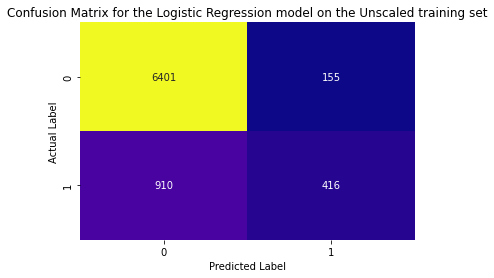

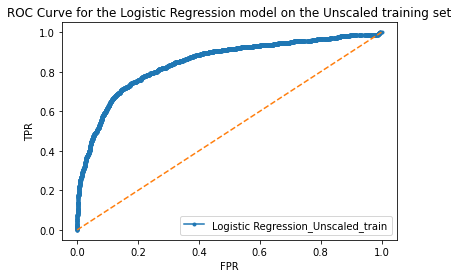



############################################Testing Set################################################ 

Classification report for the Logistic Regression model on the Unscaled testing set is 
               precision    recall  f1-score   support

           0       0.88      0.97      0.92      2808
           1       0.69      0.33      0.45       570

    accuracy                           0.86      3378
   macro avg       0.78      0.65      0.68      3378
weighted avg       0.84      0.86      0.84      3378



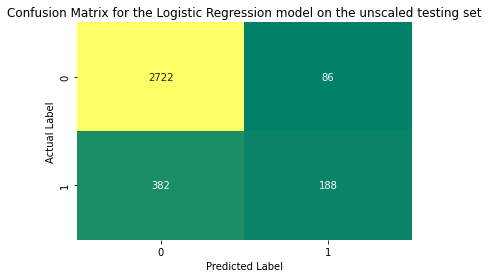

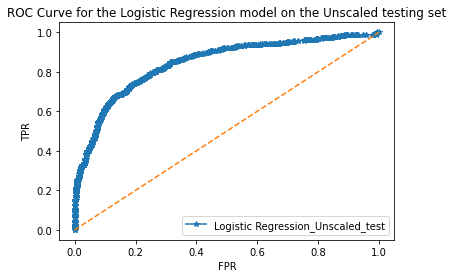

In [ ]:
perf_met_df_unscaled_lr, best_model_unscaled_lr = model_func(clfLR, None, X_train, X_test, y_train, y_test, 'Unscaled')

#### Scaled Data

--------------------Best Model Params--------------------
{'C': 1.0, 'class_weight': None, 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 100, 'multi_class': 'auto', 'n_jobs': None, 'penalty': 'l2', 'random_state': 1, 'solver': 'lbfgs', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}


Classification report for the Logistic Regression model on the Scaled training set is 
               precision    recall  f1-score   support

           0       0.88      0.98      0.93      6556
           1       0.78      0.37      0.50      1326

    accuracy                           0.88      7882
   macro avg       0.83      0.67      0.71      7882
weighted avg       0.87      0.88      0.86      7882



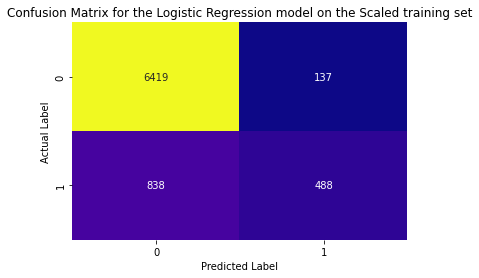

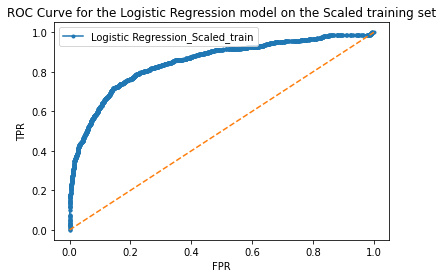



############################################Testing Set################################################ 

Classification report for the Logistic Regression model on the Scaled testing set is 
               precision    recall  f1-score   support

           0       0.89      0.97      0.93      2808
           1       0.75      0.38      0.51       570

    accuracy                           0.87      3378
   macro avg       0.82      0.68      0.72      3378
weighted avg       0.86      0.87      0.86      3378



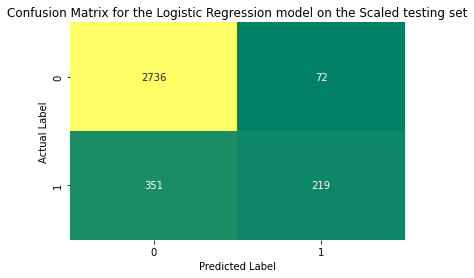

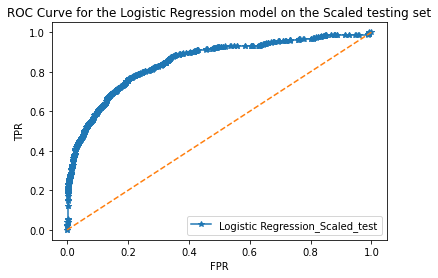

In [ ]:
perf_met_df_scaled_lr, best_model_scaled_lr = model_func(clfLR, None, X_scaled_train, X_scaled_test, y_scaled_train, y_scaled_test, 'Scaled')

#### Unscaled SMOTE Data

--------------------Best Model Params--------------------
{'C': 1.0, 'class_weight': None, 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 100, 'multi_class': 'auto', 'n_jobs': None, 'penalty': 'l2', 'random_state': 1, 'solver': 'lbfgs', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}


Classification report for the Logistic Regression model on the SMOTE training set is 
               precision    recall  f1-score   support

           0       0.80      0.76      0.78      6556
           1       0.77      0.81      0.79      6556

    accuracy                           0.78     13112
   macro avg       0.78      0.78      0.78     13112
weighted avg       0.78      0.78      0.78     13112



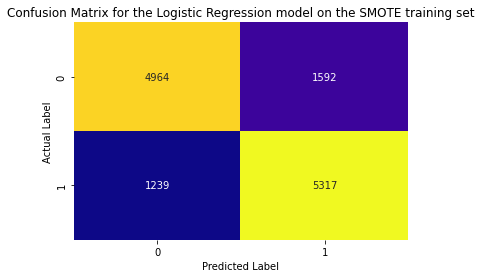

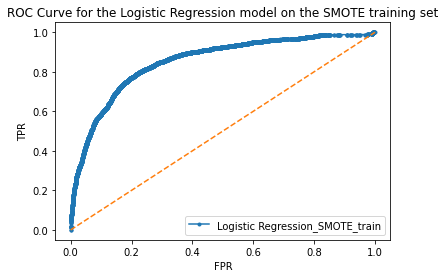



############################################Testing Set################################################ 

Classification report for the Logistic Regression model on the SMOTE testing set is 
               precision    recall  f1-score   support

           0       0.95      0.74      0.83      2808
           1       0.38      0.79      0.52       570

    accuracy                           0.75      3378
   macro avg       0.66      0.77      0.67      3378
weighted avg       0.85      0.75      0.78      3378



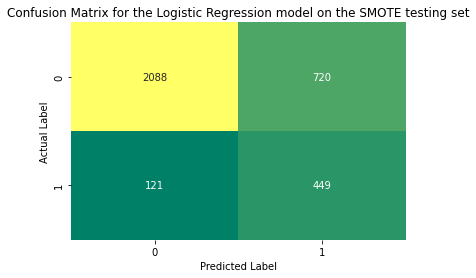

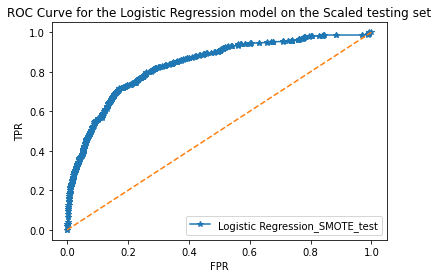

In [ ]:
perf_met_df_unscaled_lr_smote, best_model_unscaled_lr_smote = model_func(clfLR, None, X_train_smote, X_test_smote, y_train_smote, y_test_smote, 'SMOTE')

#### Scaled SMOTE Data 

--------------------Best Model Params--------------------
{'C': 1.0, 'class_weight': None, 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 100, 'multi_class': 'auto', 'n_jobs': None, 'penalty': 'l2', 'random_state': 1, 'solver': 'lbfgs', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}


Classification report for the Logistic Regression model on the SMOTE scaled training set is 
               precision    recall  f1-score   support

           0       0.79      0.76      0.78      6556
           1       0.77      0.80      0.79      6556

    accuracy                           0.78     13112
   macro avg       0.78      0.78      0.78     13112
weighted avg       0.78      0.78      0.78     13112



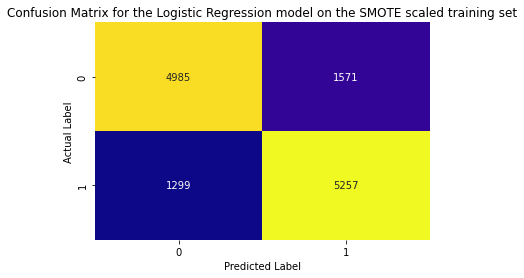

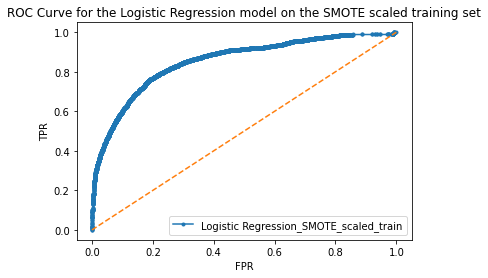



############################################Testing Set################################################ 

Classification report for the Logistic Regression model on the SMOTE scaled testing set is 
               precision    recall  f1-score   support

           0       0.94      0.76      0.84      2808
           1       0.40      0.78      0.53       570

    accuracy                           0.76      3378
   macro avg       0.67      0.77      0.68      3378
weighted avg       0.85      0.76      0.79      3378



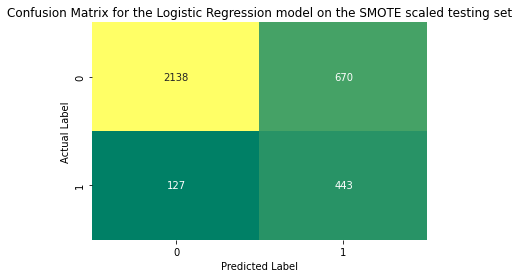

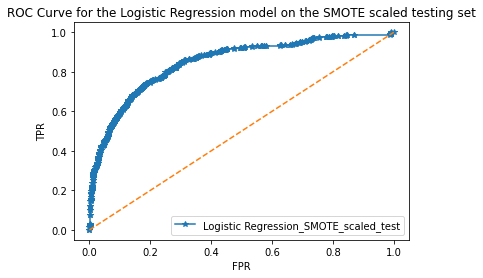

In [ ]:
perf_met_df_scaled_lr_smote, best_model_scaled_lr_smote = model_func(clfLR, None, X_scaled_train_smote, X_scaled_test_smote, y_scaled_train_smote, y_scaled_test_smote, 'SMOTE_Scaled')

#### Unscaled Data - GS

--------------------Best Parameters--------------------
{'max_iter': 100, 'penalty': 'l2', 'solver': 'sag', 'tol': 0.0001}


--------------------Best Model Params--------------------
LogisticRegression(random_state=1, solver='sag')


Classification report for the Logistic Regression model after grid search on the Unscaled training set is 
               precision    recall  f1-score   support

           0       0.88      0.98      0.92      6556
           1       0.74      0.32      0.45      1326

    accuracy                           0.87      7882
   macro avg       0.81      0.65      0.69      7882
weighted avg       0.85      0.87      0.84      7882



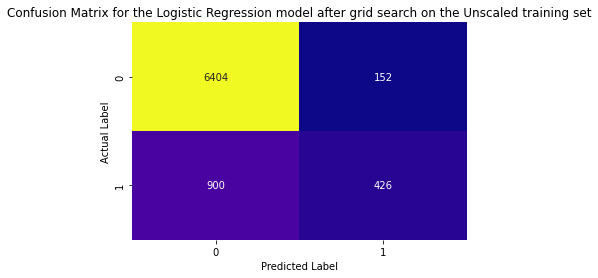

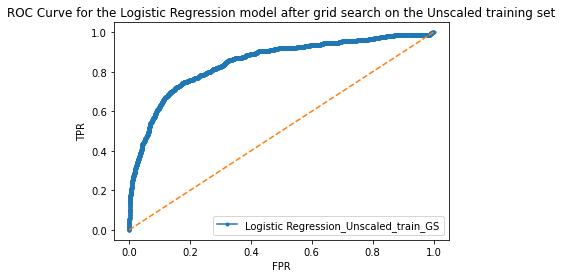



############################################Testing Set################################################ 

Classification report for the Logistic Regression model after grid search on the Unscaled testing set is 
               precision    recall  f1-score   support

           0       0.88      0.97      0.92      2808
           1       0.71      0.33      0.45       570

    accuracy                           0.86      3378
   macro avg       0.79      0.65      0.69      3378
weighted avg       0.85      0.86      0.84      3378



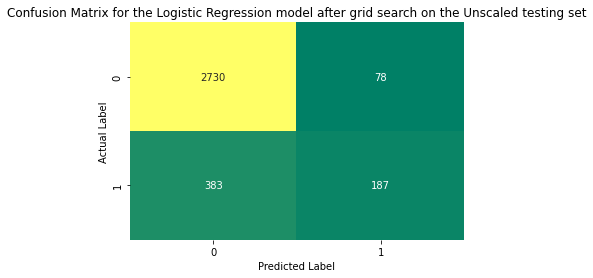

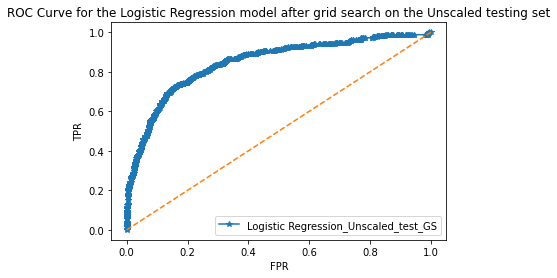

In [ ]:
perf_met_df_unscaled_lr_gs, best_model_unscaled_lr_gs = model_func(clfLR, param_grid_LR, X_train, X_test, y_train, y_test, 'Unscaled')

#### Scaled Data - GS

--------------------Best Parameters--------------------
{'max_iter': 100, 'penalty': 'l2', 'solver': 'newton-cg', 'tol': 0.0001}


--------------------Best Model Params--------------------
LogisticRegression(random_state=1, solver='newton-cg')


Classification report for the Logistic Regression model after grid search on the Scaled training set is 
               precision    recall  f1-score   support

           0       0.88      0.98      0.93      6556
           1       0.78      0.37      0.50      1326

    accuracy                           0.88      7882
   macro avg       0.83      0.67      0.71      7882
weighted avg       0.87      0.88      0.86      7882



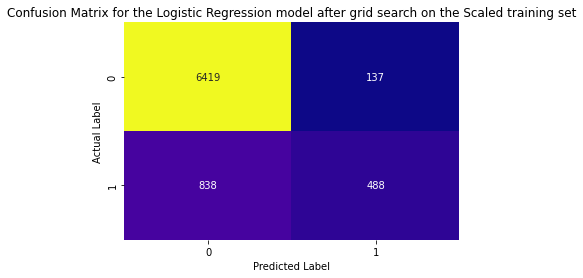

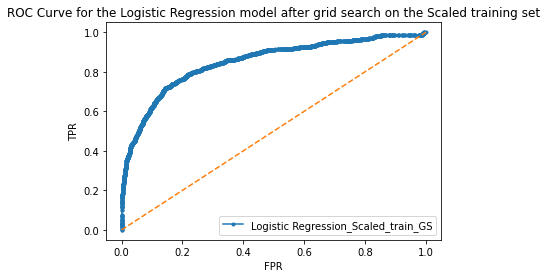



############################################Testing Set################################################ 

Classification report for the Logistic Regression model after grid search on the Scaled testing set is 
               precision    recall  f1-score   support

           0       0.89      0.97      0.93      2808
           1       0.75      0.38      0.51       570

    accuracy                           0.87      3378
   macro avg       0.82      0.68      0.72      3378
weighted avg       0.86      0.87      0.86      3378



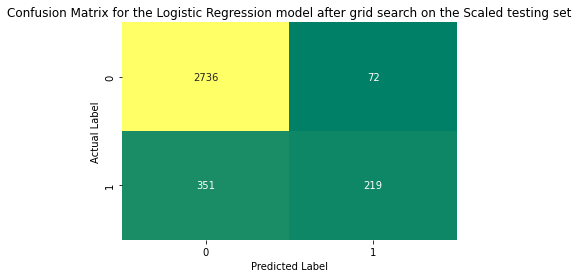

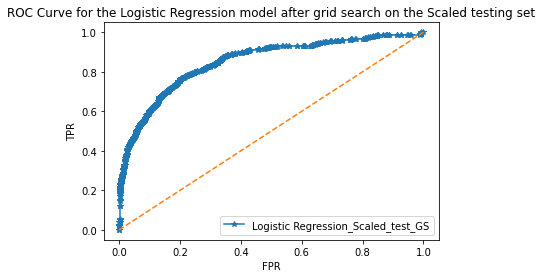

In [ ]:
perf_met_df_scaled_lr_gs, best_model_scaled_lr_gs = model_func(clfLR, param_grid_LR, X_scaled_train, X_scaled_test, y_scaled_train, y_scaled_test, 'Scaled')

#### Unscaled SMOTE Data - GS

--------------------Best Parameters--------------------
{'max_iter': 1000, 'penalty': 'none', 'solver': 'sag', 'tol': 1e-05}


--------------------Best Model Params--------------------
LogisticRegression(max_iter=1000, penalty='none', random_state=1, solver='sag',
                   tol=1e-05)


Classification report for the Logistic Regression model after grid search on the SMOTE training set is 
               precision    recall  f1-score   support

           0       0.80      0.76      0.78      6556
           1       0.77      0.81      0.79      6556

    accuracy                           0.78     13112
   macro avg       0.78      0.78      0.78     13112
weighted avg       0.78      0.78      0.78     13112



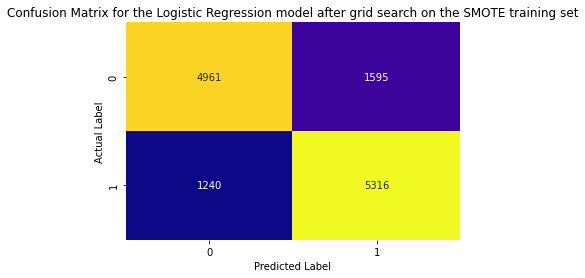

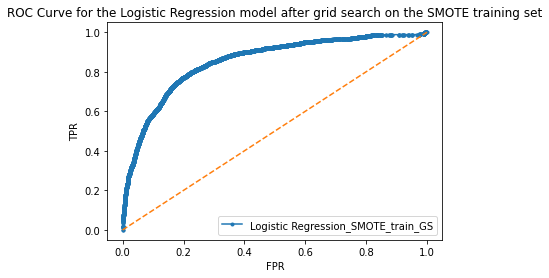



############################################Testing Set################################################ 

Classification report for the Logistic Regression model after grid search on the SMOTE testing set is 
               precision    recall  f1-score   support

           0       0.95      0.74      0.83      2808
           1       0.38      0.79      0.52       570

    accuracy                           0.75      3378
   macro avg       0.66      0.77      0.67      3378
weighted avg       0.85      0.75      0.78      3378



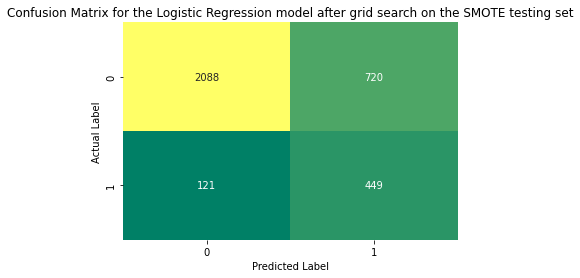

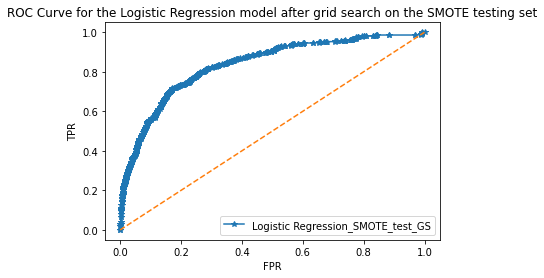

In [ ]:
perf_met_df_unscaled_lr_smote_gs, best_model_unscaled_lr_smote_gs = model_func(clfLR, param_grid_LR, X_train_smote, X_test_smote, y_train_smote, y_test_smote, 'SMOTE')

#### Scaled SMOTE Data - GS

--------------------Best Parameters--------------------
{'max_iter': 100, 'penalty': 'none', 'solver': 'sag', 'tol': 0.0001}


--------------------Best Model Params--------------------
LogisticRegression(penalty='none', random_state=1, solver='sag')


Classification report for the Logistic Regression model after grid search on the SMOTE scaled training set is 
               precision    recall  f1-score   support

           0       0.79      0.76      0.78      6556
           1       0.77      0.80      0.79      6556

    accuracy                           0.78     13112
   macro avg       0.78      0.78      0.78     13112
weighted avg       0.78      0.78      0.78     13112



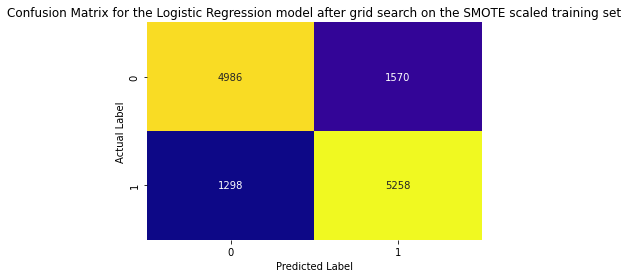

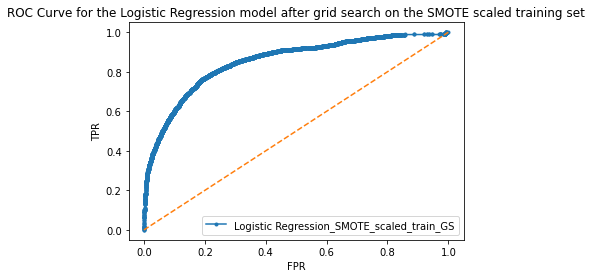



############################################Testing Set################################################ 

Classification report for the Logistic Regression model after grid search on the SMOTE scaled testing set is 
               precision    recall  f1-score   support

           0       0.94      0.76      0.84      2808
           1       0.40      0.78      0.53       570

    accuracy                           0.76      3378
   macro avg       0.67      0.77      0.68      3378
weighted avg       0.85      0.76      0.79      3378



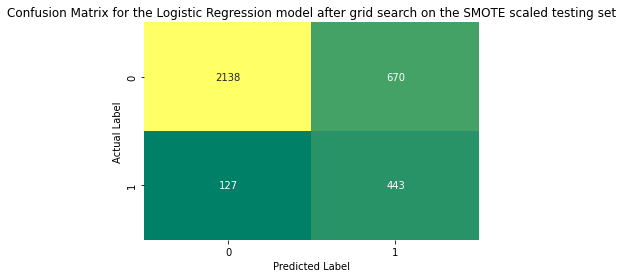

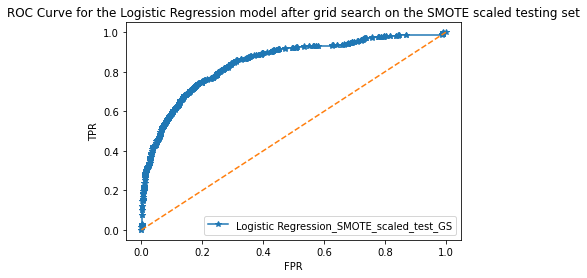

In [ ]:
perf_met_df_scaled_lr_smote_gs, best_model_scaled_lr_smote_gs = model_func(clfLR, param_grid_LR, X_scaled_train_smote, X_scaled_test_smote, y_scaled_train_smote, y_scaled_test_smote, 'SMOTE_Scaled')

### **Linear Discriminant Analysis**

#### Unscaled Data

--------------------Best Model Params--------------------
{'covariance_estimator': None, 'n_components': None, 'priors': None, 'shrinkage': None, 'solver': 'svd', 'store_covariance': False, 'tol': 0.0001}


Classification report for the Linear Discriminant Analysis model on the Unscaled training set is 
               precision    recall  f1-score   support

           0       0.87      0.98      0.92      6556
           1       0.71      0.26      0.38      1326

    accuracy                           0.86      7882
   macro avg       0.79      0.62      0.65      7882
weighted avg       0.84      0.86      0.83      7882



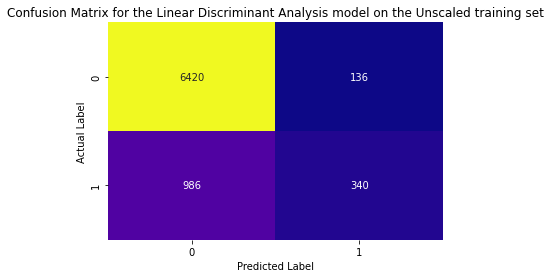

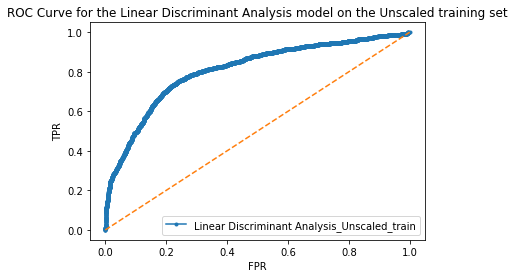



############################################Testing Set################################################ 

Classification report for the Linear Discriminant Analysis model on the Unscaled testing set is 
               precision    recall  f1-score   support

           0       0.87      0.97      0.92      2808
           1       0.68      0.29      0.41       570

    accuracy                           0.86      3378
   macro avg       0.78      0.63      0.66      3378
weighted avg       0.84      0.86      0.83      3378



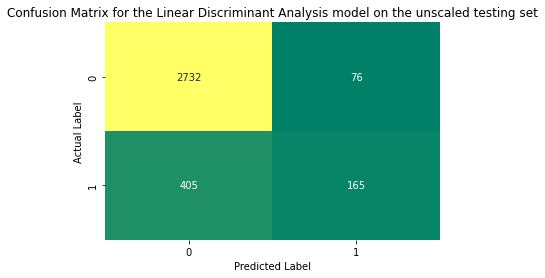

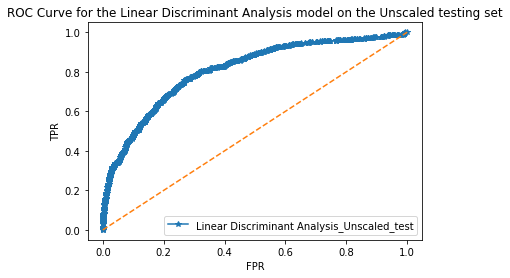

In [ ]:
perf_met_df_unscaled_lda, best_model_unscaled_lda = model_func(clfLDA, None, X_train, X_test, y_train, y_test, 'Unscaled')

#### Scaled Data

--------------------Best Model Params--------------------
{'covariance_estimator': None, 'n_components': None, 'priors': None, 'shrinkage': None, 'solver': 'svd', 'store_covariance': False, 'tol': 0.0001}


Classification report for the Linear Discriminant Analysis model on the Scaled training set is 
               precision    recall  f1-score   support

           0       0.87      0.98      0.92      6556
           1       0.76      0.31      0.44      1326

    accuracy                           0.87      7882
   macro avg       0.82      0.64      0.68      7882
weighted avg       0.86      0.87      0.84      7882



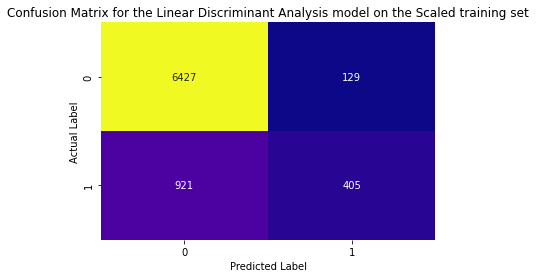

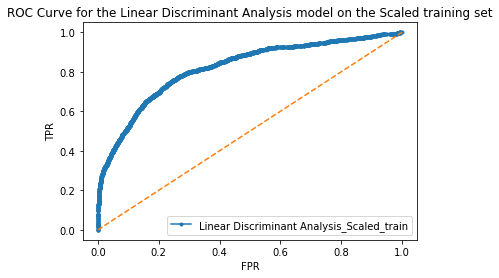



############################################Testing Set################################################ 

Classification report for the Linear Discriminant Analysis model on the Scaled testing set is 
               precision    recall  f1-score   support

           0       0.88      0.98      0.92      2808
           1       0.73      0.34      0.46       570

    accuracy                           0.87      3378
   macro avg       0.81      0.66      0.69      3378
weighted avg       0.85      0.87      0.85      3378



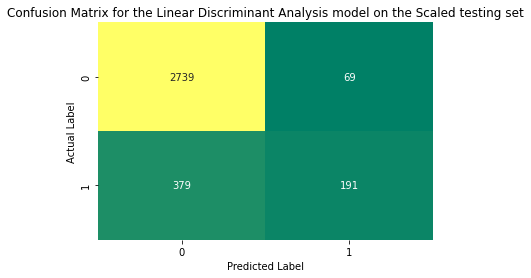

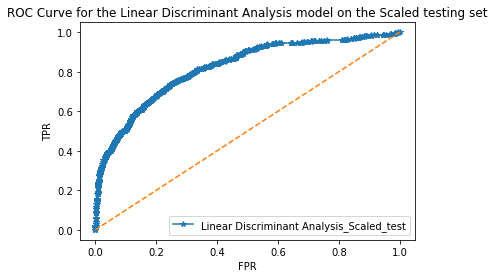

In [ ]:
perf_met_df_scaled_lda, best_model_scaled_lda = model_func(clfLDA, None, X_scaled_train, X_scaled_test, y_scaled_train, y_scaled_test, 'Scaled')

#### Unscaled SMOTE Data

--------------------Best Model Params--------------------
{'covariance_estimator': None, 'n_components': None, 'priors': None, 'shrinkage': None, 'solver': 'svd', 'store_covariance': False, 'tol': 0.0001}


Classification report for the Linear Discriminant Analysis model on the SMOTE training set is 
               precision    recall  f1-score   support

           0       0.78      0.73      0.75      6556
           1       0.75      0.79      0.77      6556

    accuracy                           0.76     13112
   macro avg       0.76      0.76      0.76     13112
weighted avg       0.76      0.76      0.76     13112



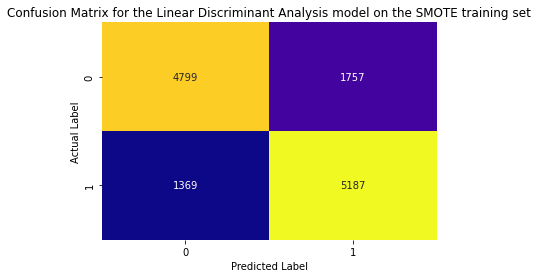

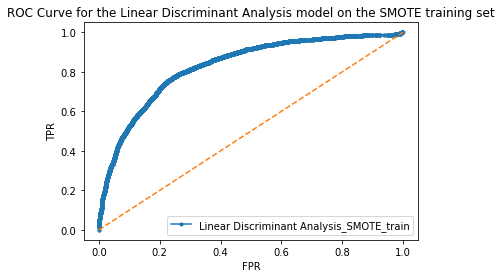



############################################Testing Set################################################ 

Classification report for the Linear Discriminant Analysis model on the SMOTE testing set is 
               precision    recall  f1-score   support

           0       0.93      0.72      0.81      2808
           1       0.35      0.75      0.48       570

    accuracy                           0.72      3378
   macro avg       0.64      0.73      0.64      3378
weighted avg       0.84      0.72      0.76      3378



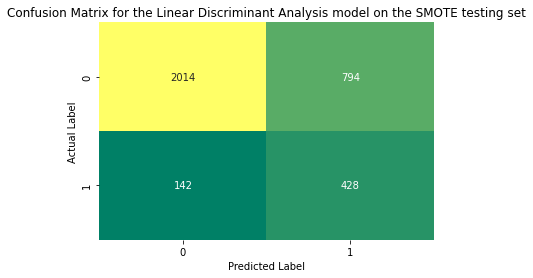

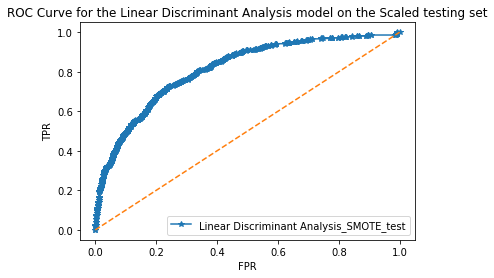

In [ ]:
perf_met_df_unscaled_lda_smote, best_model_unscaled_lda_smote = model_func(clfLDA, None, X_train_smote, X_test_smote, y_train_smote, y_test_smote, 'SMOTE')

#### Scaled SMOTE Data 

--------------------Best Model Params--------------------
{'covariance_estimator': None, 'n_components': None, 'priors': None, 'shrinkage': None, 'solver': 'svd', 'store_covariance': False, 'tol': 0.0001}


Classification report for the Linear Discriminant Analysis model on the SMOTE scaled training set is 
               precision    recall  f1-score   support

           0       0.78      0.74      0.76      6556
           1       0.75      0.79      0.77      6556

    accuracy                           0.77     13112
   macro avg       0.77      0.77      0.77     13112
weighted avg       0.77      0.77      0.77     13112



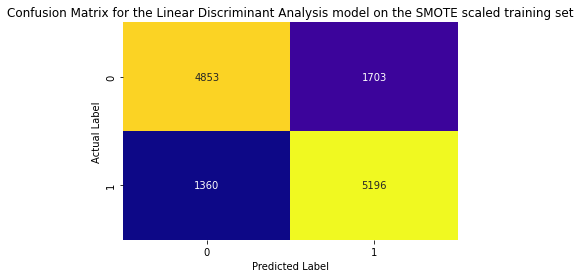

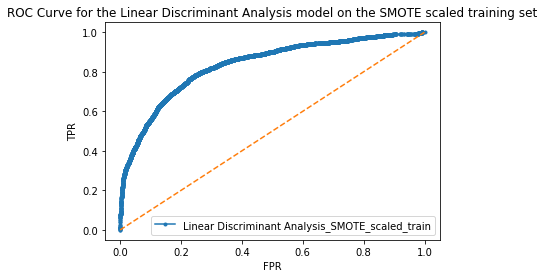



############################################Testing Set################################################ 

Classification report for the Linear Discriminant Analysis model on the SMOTE scaled testing set is 
               precision    recall  f1-score   support

           0       0.94      0.74      0.83      2808
           1       0.38      0.78      0.51       570

    accuracy                           0.74      3378
   macro avg       0.66      0.76      0.67      3378
weighted avg       0.85      0.74      0.77      3378



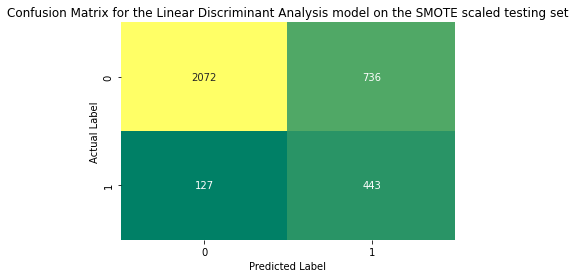

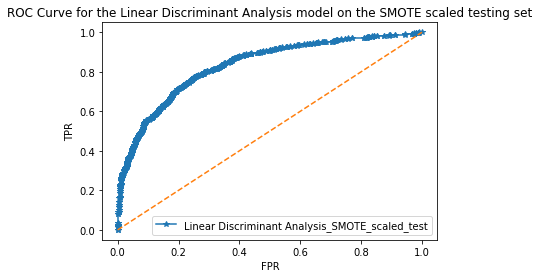

In [ ]:
perf_met_df_scaled_lda_smote, best_model_scaled_lda_smote = model_func(clfLDA, None, X_scaled_train_smote, X_scaled_test_smote, y_scaled_train_smote, y_scaled_test_smote, 'SMOTE_Scaled')

#### Unscaled Data - GS

--------------------Best Parameters--------------------
{'solver': 'svd', 'tol': 0.0001}


--------------------Best Model Params--------------------
LinearDiscriminantAnalysis()


Classification report for the Linear Discriminant Analysis model after grid search on the Unscaled training set is 
               precision    recall  f1-score   support

           0       0.87      0.98      0.92      6556
           1       0.71      0.26      0.38      1326

    accuracy                           0.86      7882
   macro avg       0.79      0.62      0.65      7882
weighted avg       0.84      0.86      0.83      7882



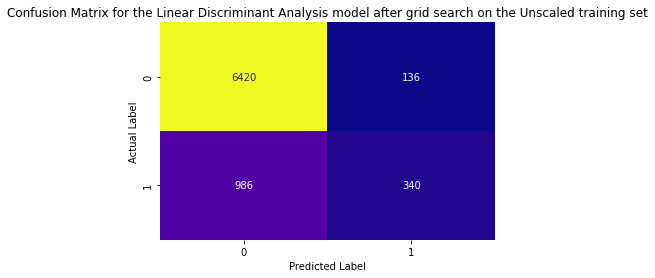

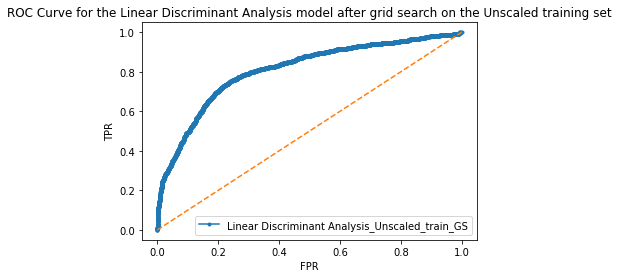



############################################Testing Set################################################ 

Classification report for the Linear Discriminant Analysis model after grid search on the Unscaled testing set is 
               precision    recall  f1-score   support

           0       0.87      0.97      0.92      2808
           1       0.68      0.29      0.41       570

    accuracy                           0.86      3378
   macro avg       0.78      0.63      0.66      3378
weighted avg       0.84      0.86      0.83      3378



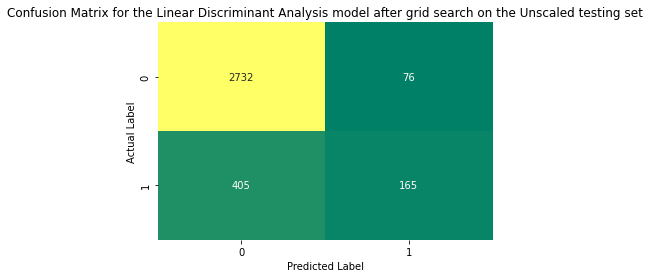

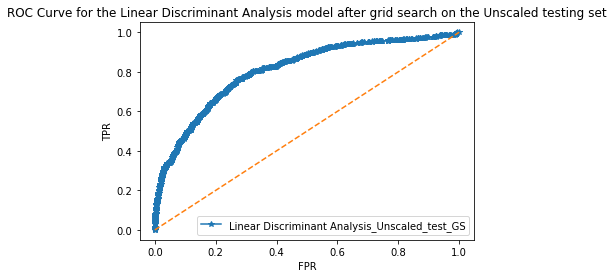

In [ ]:
perf_met_df_unscaled_lda_gs, best_model_unscaled_lda_gs = model_func(clfLDA, param_grid_LDA, X_train, X_test, y_train, y_test, 'Unscaled')

#### Scaled Data - GS

--------------------Best Parameters--------------------
{'solver': 'svd', 'tol': 0.0001}


--------------------Best Model Params--------------------
LinearDiscriminantAnalysis()


Classification report for the Linear Discriminant Analysis model after grid search on the Scaled training set is 
               precision    recall  f1-score   support

           0       0.87      0.98      0.92      6556
           1       0.76      0.31      0.44      1326

    accuracy                           0.87      7882
   macro avg       0.82      0.64      0.68      7882
weighted avg       0.86      0.87      0.84      7882



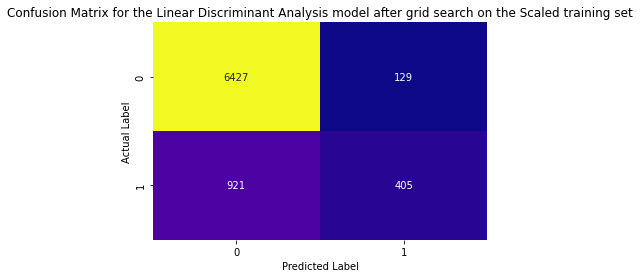

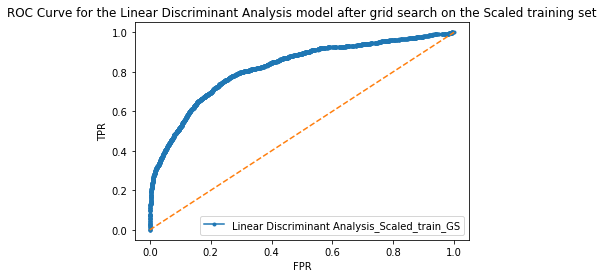



############################################Testing Set################################################ 

Classification report for the Linear Discriminant Analysis model after grid search on the Scaled testing set is 
               precision    recall  f1-score   support

           0       0.88      0.98      0.92      2808
           1       0.73      0.34      0.46       570

    accuracy                           0.87      3378
   macro avg       0.81      0.66      0.69      3378
weighted avg       0.85      0.87      0.85      3378



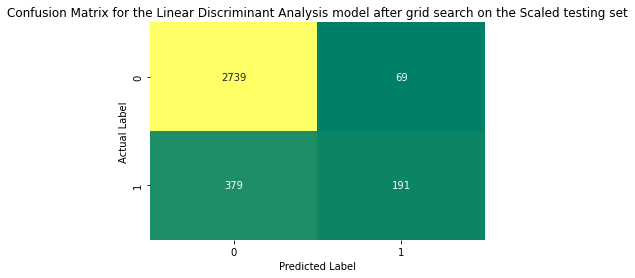

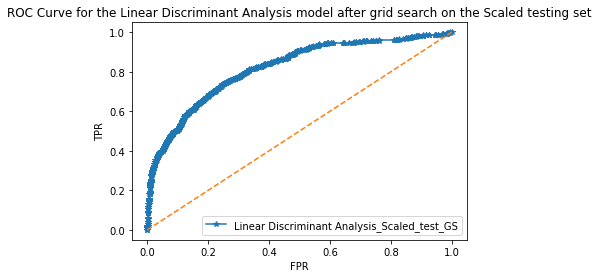

In [ ]:
perf_met_df_scaled_lda_gs, best_model_scaled_lda_gs = model_func(clfLDA, param_grid_LDA, X_scaled_train, X_scaled_test, y_scaled_train, y_scaled_test, 'Scaled')

#### Unscaled SMOTE Data - GS

--------------------Best Parameters--------------------
{'solver': 'svd', 'tol': 0.0001}


--------------------Best Model Params--------------------
LinearDiscriminantAnalysis()


Classification report for the Linear Discriminant Analysis model after grid search on the SMOTE training set is 
               precision    recall  f1-score   support

           0       0.78      0.73      0.75      6556
           1       0.75      0.79      0.77      6556

    accuracy                           0.76     13112
   macro avg       0.76      0.76      0.76     13112
weighted avg       0.76      0.76      0.76     13112



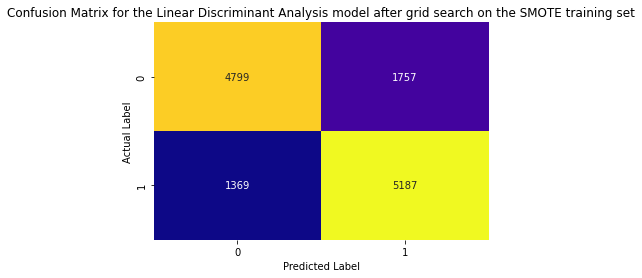

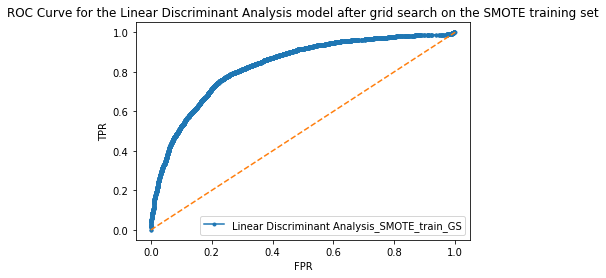



############################################Testing Set################################################ 

Classification report for the Linear Discriminant Analysis model after grid search on the SMOTE testing set is 
               precision    recall  f1-score   support

           0       0.93      0.72      0.81      2808
           1       0.35      0.75      0.48       570

    accuracy                           0.72      3378
   macro avg       0.64      0.73      0.64      3378
weighted avg       0.84      0.72      0.76      3378



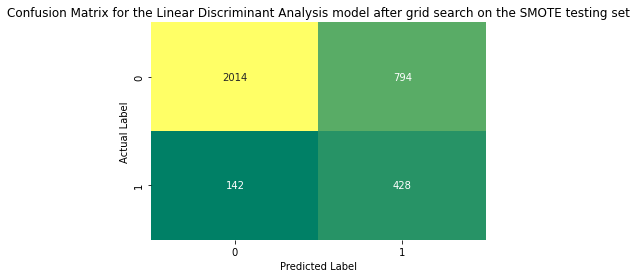

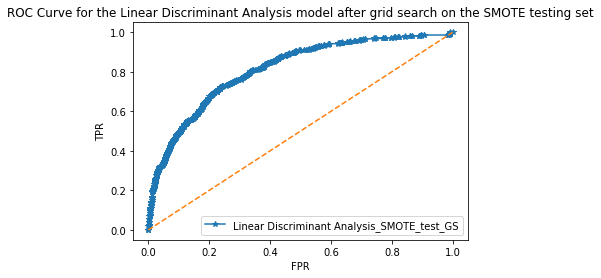

In [ ]:
perf_met_df_unscaled_lda_smote_gs, best_model_unscaled_lda_smote_gs = model_func(clfLDA, param_grid_LDA, X_train_smote, X_test_smote, y_train_smote, y_test_smote, 'SMOTE')

#### Scaled SMOTE Data - GS

--------------------Best Parameters--------------------
{'solver': 'svd', 'tol': 0.0001}


--------------------Best Model Params--------------------
LinearDiscriminantAnalysis()


Classification report for the Linear Discriminant Analysis model after grid search on the SMOTE scaled training set is 
               precision    recall  f1-score   support

           0       0.78      0.74      0.76      6556
           1       0.75      0.79      0.77      6556

    accuracy                           0.77     13112
   macro avg       0.77      0.77      0.77     13112
weighted avg       0.77      0.77      0.77     13112



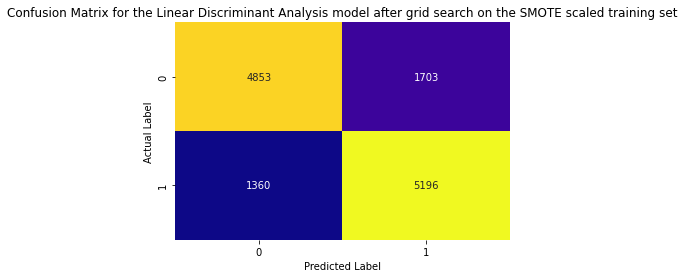

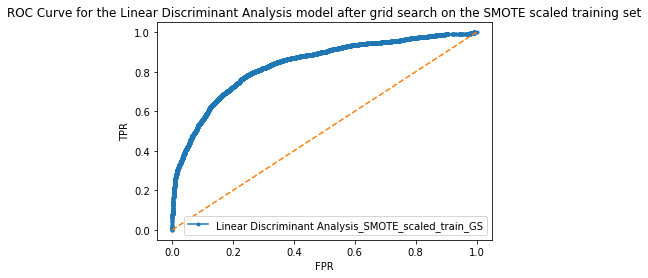



############################################Testing Set################################################ 

Classification report for the Linear Discriminant Analysis model after grid search on the SMOTE scaled testing set is 
               precision    recall  f1-score   support

           0       0.94      0.74      0.83      2808
           1       0.38      0.78      0.51       570

    accuracy                           0.74      3378
   macro avg       0.66      0.76      0.67      3378
weighted avg       0.85      0.74      0.77      3378



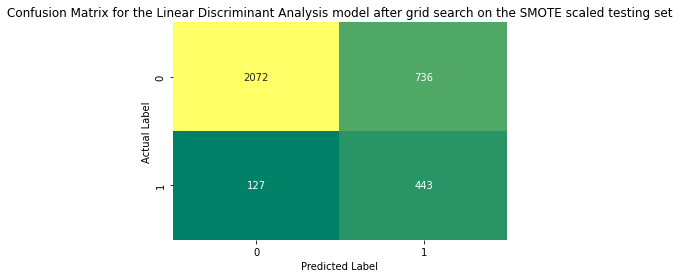

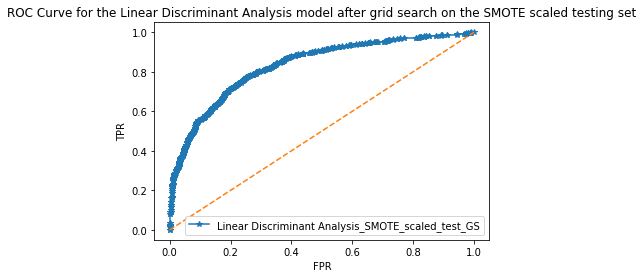

In [ ]:
perf_met_df_scaled_lda_smote_gs, best_model_scaled_lda_smote_gs = model_func(clfLDA, param_grid_LDA, X_scaled_train_smote, X_scaled_test_smote, y_scaled_train_smote, y_scaled_test_smote, 'SMOTE_Scaled')

### **KNN Classifier**

#### Unscaled Data

--------------------Best Model Params--------------------
{'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': None, 'n_neighbors': 5, 'p': 2, 'weights': 'uniform'}


Classification report for the K-Nearest Neighbours Classifier model on the Unscaled training set is 
               precision    recall  f1-score   support

           0       0.96      0.97      0.97      6556
           1       0.86      0.81      0.83      1326

    accuracy                           0.95      7882
   macro avg       0.91      0.89      0.90      7882
weighted avg       0.94      0.95      0.94      7882



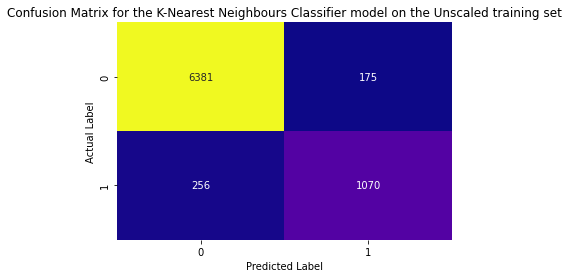

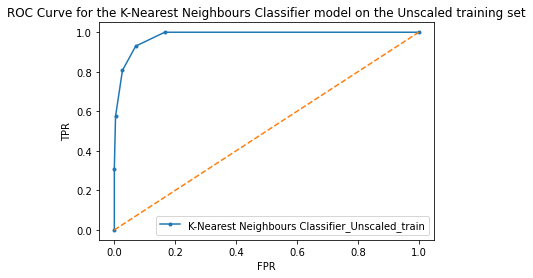



############################################Testing Set################################################ 

Classification report for the K-Nearest Neighbours Classifier model on the Unscaled testing set is 
               precision    recall  f1-score   support

           0       0.94      0.96      0.95      2808
           1       0.80      0.71      0.75       570

    accuracy                           0.92      3378
   macro avg       0.87      0.83      0.85      3378
weighted avg       0.92      0.92      0.92      3378



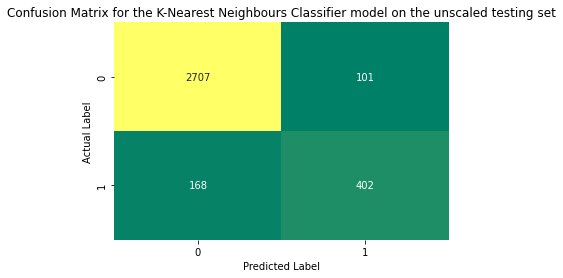

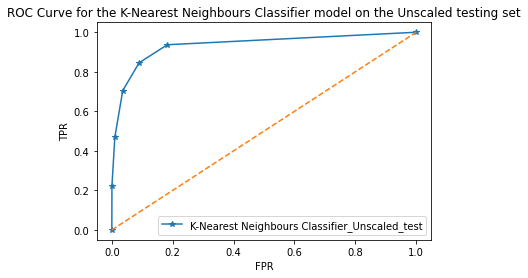

In [ ]:
perf_met_df_unscaled_knn, best_model_unscaled_knn = model_func(clfKNN, None, X_train, X_test, y_train, y_test, 'Unscaled')

#### Scaled Data

--------------------Best Model Params--------------------
{'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': None, 'n_neighbors': 5, 'p': 2, 'weights': 'uniform'}


Classification report for the K-Nearest Neighbours Classifier model on the Scaled training set is 
               precision    recall  f1-score   support

           0       0.97      0.99      0.98      6556
           1       0.92      0.83      0.87      1326

    accuracy                           0.96      7882
   macro avg       0.94      0.91      0.92      7882
weighted avg       0.96      0.96      0.96      7882



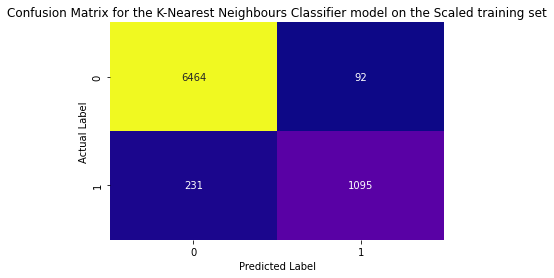

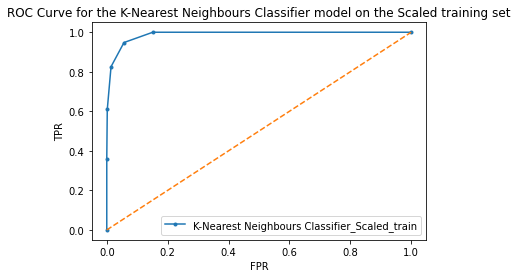



############################################Testing Set################################################ 

Classification report for the K-Nearest Neighbours Classifier model on the Scaled testing set is 
               precision    recall  f1-score   support

           0       0.95      0.98      0.96      2808
           1       0.86      0.73      0.79       570

    accuracy                           0.93      3378
   macro avg       0.90      0.85      0.87      3378
weighted avg       0.93      0.93      0.93      3378



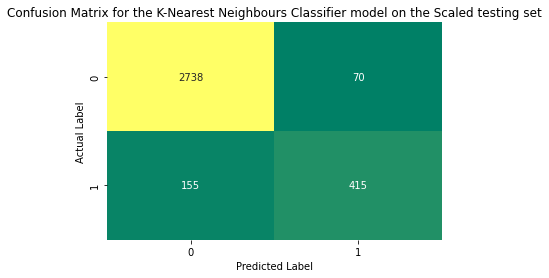

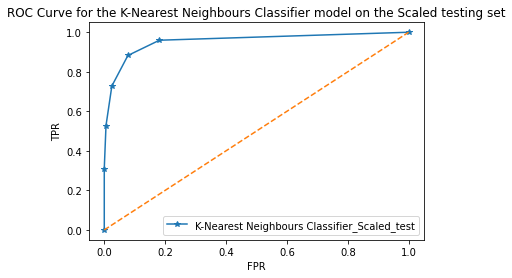

In [ ]:
perf_met_df_scaled_knn, best_model_scaled_knn = model_func(clfKNN, None, X_scaled_train, X_scaled_test, y_scaled_train, y_scaled_test, 'Scaled')

#### Unscaled SMOTE Data

--------------------Best Model Params--------------------
{'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': None, 'n_neighbors': 5, 'p': 2, 'weights': 'uniform'}


Classification report for the K-Nearest Neighbours Classifier model on the SMOTE training set is 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95      6556
           1       0.91      1.00      0.95      6556

    accuracy                           0.95     13112
   macro avg       0.96      0.95      0.95     13112
weighted avg       0.96      0.95      0.95     13112



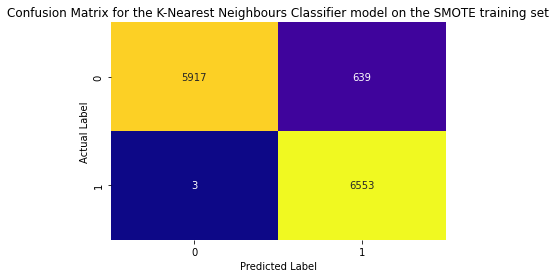

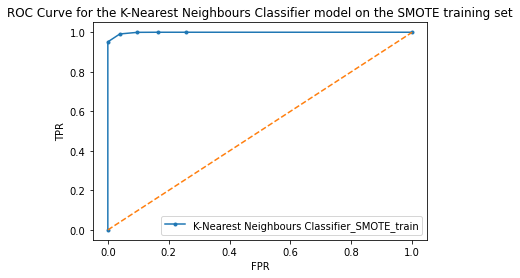



############################################Testing Set################################################ 

Classification report for the K-Nearest Neighbours Classifier model on the SMOTE testing set is 
               precision    recall  f1-score   support

           0       0.98      0.85      0.91      2808
           1       0.56      0.90      0.69       570

    accuracy                           0.86      3378
   macro avg       0.77      0.88      0.80      3378
weighted avg       0.91      0.86      0.87      3378



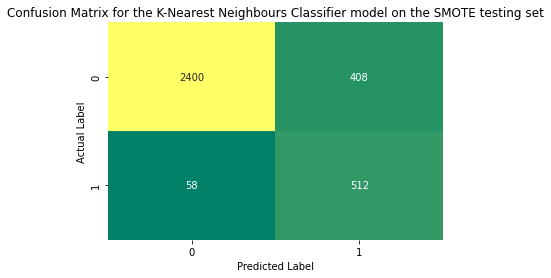

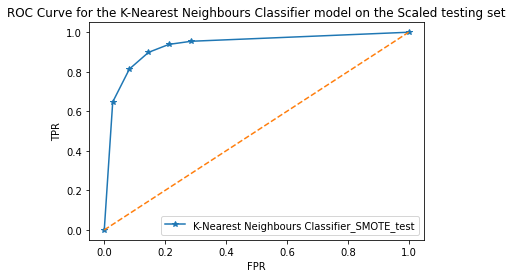

In [ ]:
perf_met_df_unscaled_knn_smote, best_model_unscaled_knn_smote = model_func(clfKNN, None, X_train_smote, X_test_smote, y_train_smote, y_test_smote, 'SMOTE')

#### Scaled SMOTE Data 

--------------------Best Model Params--------------------
{'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': None, 'n_neighbors': 5, 'p': 2, 'weights': 'uniform'}


Classification report for the K-Nearest Neighbours Classifier model on the SMOTE scaled training set is 
               precision    recall  f1-score   support

           0       1.00      0.96      0.98      6556
           1       0.96      1.00      0.98      6556

    accuracy                           0.98     13112
   macro avg       0.98      0.98      0.98     13112
weighted avg       0.98      0.98      0.98     13112



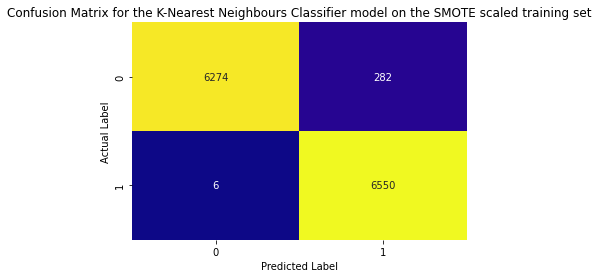

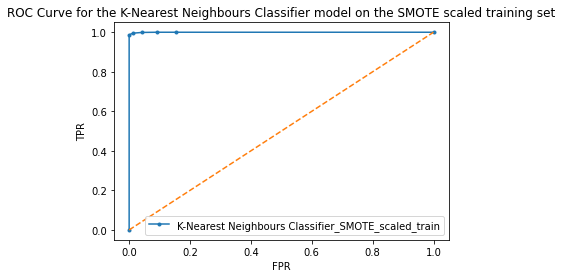



############################################Testing Set################################################ 

Classification report for the K-Nearest Neighbours Classifier model on the SMOTE scaled testing set is 
               precision    recall  f1-score   support

           0       0.99      0.93      0.96      2808
           1       0.74      0.95      0.83       570

    accuracy                           0.93      3378
   macro avg       0.86      0.94      0.90      3378
weighted avg       0.95      0.93      0.94      3378



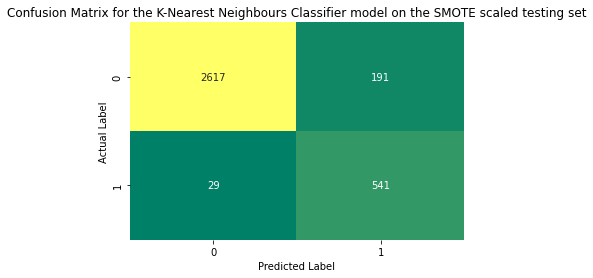

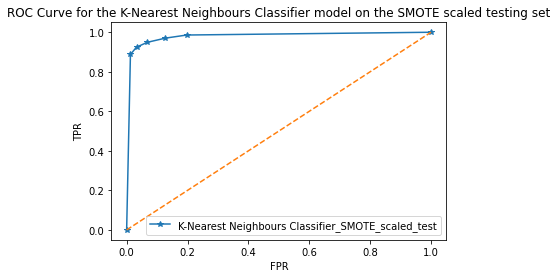

In [ ]:
perf_met_df_scaled_knn_smote, best_model_scaled_knn_smote = model_func(clfKNN, None, X_scaled_train_smote, X_scaled_test_smote, y_scaled_train_smote, y_scaled_test_smote, 'SMOTE_Scaled')

#### Unscaled Data - GS

--------------------Best Parameters--------------------
{'metric': 'manhattan', 'n_neighbors': 4, 'weights': 'distance'}


--------------------Best Model Params--------------------
KNeighborsClassifier(metric='manhattan', n_neighbors=4, weights='distance')


Classification report for the K-Nearest Neighbours Classifier model after grid search on the Unscaled training set is 
               precision    recall  f1-score   support

           0       0.99      1.00      1.00      6556
           1       1.00      0.97      0.98      1326

    accuracy                           0.99      7882
   macro avg       0.99      0.99      0.99      7882
weighted avg       0.99      0.99      0.99      7882



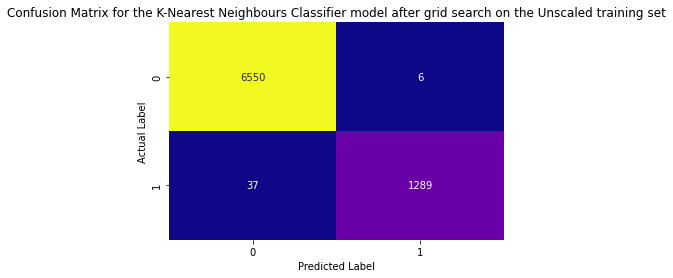

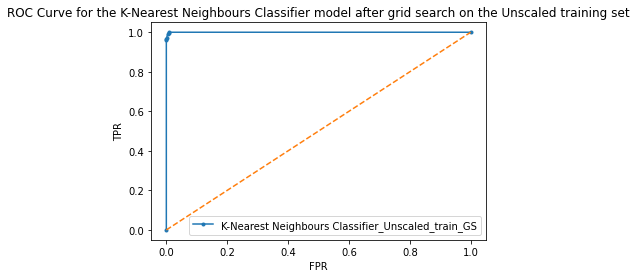



############################################Testing Set################################################ 

Classification report for the K-Nearest Neighbours Classifier model after grid search on the Unscaled testing set is 
               precision    recall  f1-score   support

           0       0.96      0.98      0.97      2808
           1       0.89      0.81      0.85       570

    accuracy                           0.95      3378
   macro avg       0.92      0.89      0.91      3378
weighted avg       0.95      0.95      0.95      3378



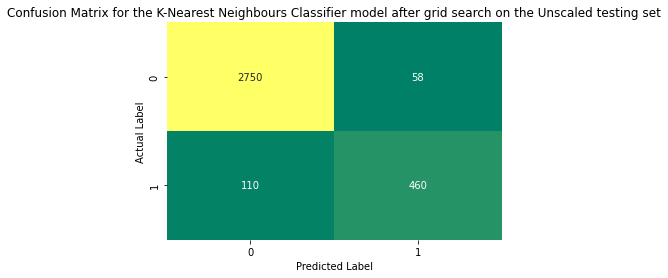

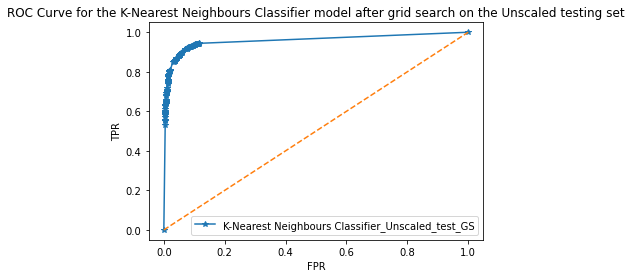

In [ ]:
perf_met_df_unscaled_knn_gs, best_model_unscaled_knn_gs = model_func(clfKNN, param_grid_KNN, X_train, X_test, y_train, y_test, 'Unscaled')

#### Scaled Data - GS

--------------------Best Parameters--------------------
{'metric': 'manhattan', 'n_neighbors': 2, 'weights': 'distance'}


--------------------Best Model Params--------------------
KNeighborsClassifier(metric='manhattan', n_neighbors=2, weights='distance')


Classification report for the K-Nearest Neighbours Classifier model after grid search on the Scaled training set is 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      6556
           1       1.00      1.00      1.00      1326

    accuracy                           1.00      7882
   macro avg       1.00      1.00      1.00      7882
weighted avg       1.00      1.00      1.00      7882



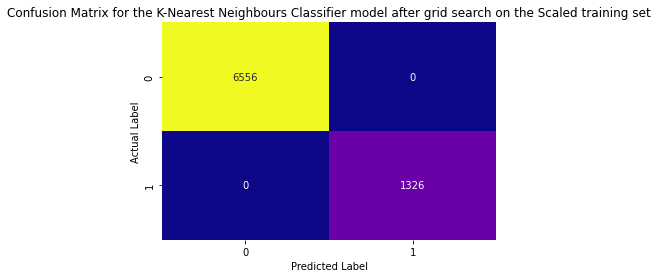

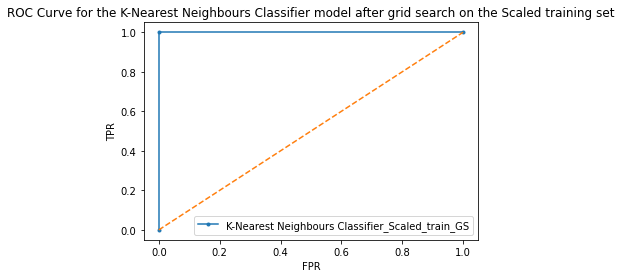



############################################Testing Set################################################ 

Classification report for the K-Nearest Neighbours Classifier model after grid search on the Scaled testing set is 
               precision    recall  f1-score   support

           0       0.98      0.98      0.98      2808
           1       0.90      0.89      0.89       570

    accuracy                           0.96      3378
   macro avg       0.94      0.93      0.93      3378
weighted avg       0.96      0.96      0.96      3378



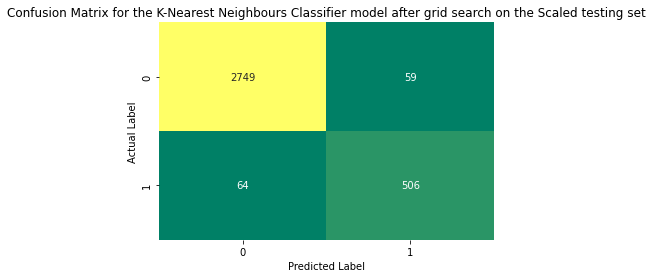

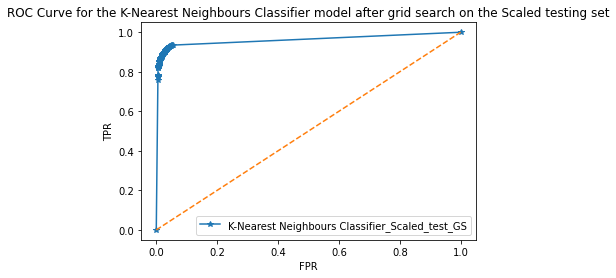

In [ ]:
perf_met_df_scaled_knn_gs, best_model_scaled_knn_gs = model_func(clfKNN, param_grid_KNN, X_scaled_train, X_scaled_test, y_scaled_train, y_scaled_test, 'Scaled')

#### Unscaled SMOTE Data - GS

--------------------Best Parameters--------------------
{'metric': 'manhattan', 'n_neighbors': 2, 'weights': 'distance'}


--------------------Best Model Params--------------------
KNeighborsClassifier(metric='manhattan', n_neighbors=2, weights='distance')


Classification report for the K-Nearest Neighbours Classifier model after grid search on the SMOTE training set is 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      6556
           1       1.00      1.00      1.00      6556

    accuracy                           1.00     13112
   macro avg       1.00      1.00      1.00     13112
weighted avg       1.00      1.00      1.00     13112



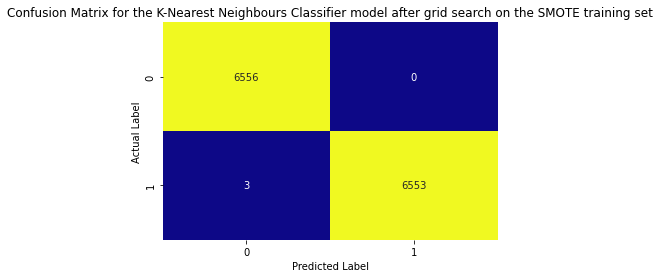

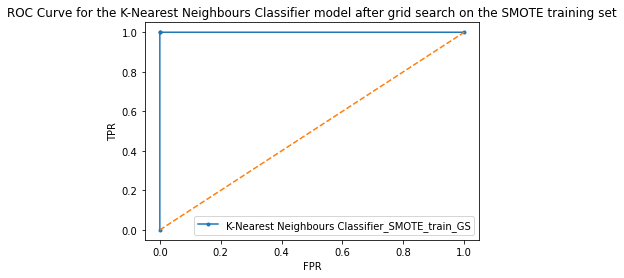



############################################Testing Set################################################ 

Classification report for the K-Nearest Neighbours Classifier model after grid search on the SMOTE testing set is 
               precision    recall  f1-score   support

           0       0.97      0.96      0.96      2808
           1       0.79      0.83      0.81       570

    accuracy                           0.94      3378
   macro avg       0.88      0.89      0.89      3378
weighted avg       0.94      0.94      0.94      3378



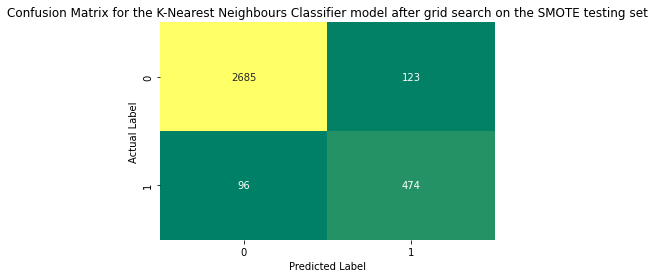

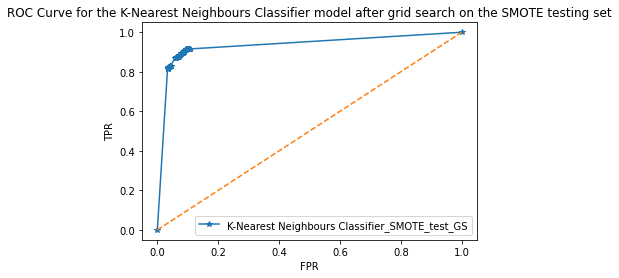

In [ ]:
perf_met_df_unscaled_knn_smote_gs, best_model_unscaled_knn_smote_gs = model_func(clfKNN, param_grid_KNN, X_train_smote, X_test_smote, y_train_smote, y_test_smote, 'SMOTE')

#### Scaled SMOTE Data - GS

--------------------Best Parameters--------------------
{'metric': 'manhattan', 'n_neighbors': 2, 'weights': 'uniform'}


--------------------Best Model Params--------------------
KNeighborsClassifier(metric='manhattan', n_neighbors=2)


Classification report for the K-Nearest Neighbours Classifier model after grid search on the SMOTE scaled training set is 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      6556
           1       1.00      1.00      1.00      6556

    accuracy                           1.00     13112
   macro avg       1.00      1.00      1.00     13112
weighted avg       1.00      1.00      1.00     13112



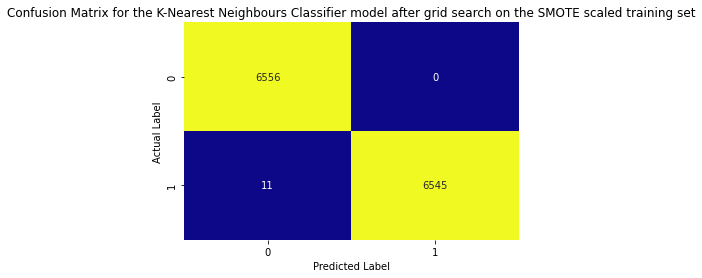

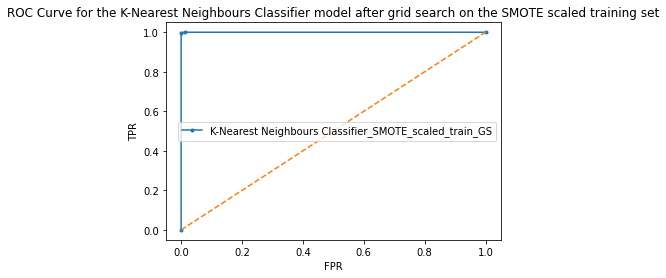



############################################Testing Set################################################ 

Classification report for the K-Nearest Neighbours Classifier model after grid search on the SMOTE scaled testing set is 
               precision    recall  f1-score   support

           0       0.99      0.99      0.99      2808
           1       0.95      0.94      0.94       570

    accuracy                           0.98      3378
   macro avg       0.97      0.96      0.97      3378
weighted avg       0.98      0.98      0.98      3378



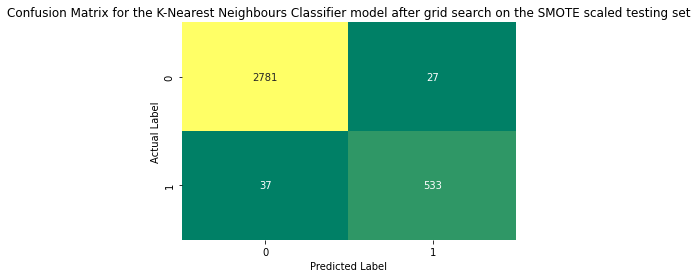

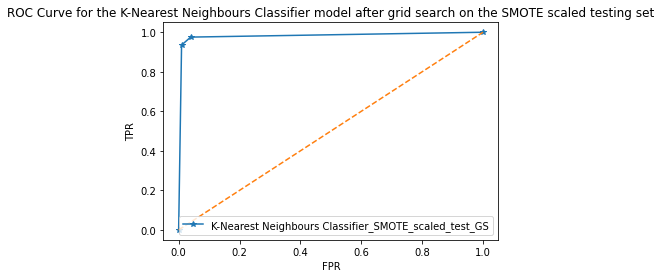

In [ ]:
perf_met_df_scaled_knn_smote_gs, best_model_scaled_knn_smote_gs = model_func(clfKNN, param_grid_KNN, X_scaled_train_smote, X_scaled_test_smote, y_scaled_train_smote, y_scaled_test_smote, 'SMOTE_Scaled')

### **Gaussian Naive Bias Classifier**

#### Unscaled Data

--------------------Best Model Params--------------------
{'priors': None, 'var_smoothing': 1e-09}


Classification report for the Gaussian Naive Bias Classifier model on the Unscaled training set is 
               precision    recall  f1-score   support

           0       0.86      0.98      0.92      6556
           1       0.69      0.22      0.34      1326

    accuracy                           0.85      7882
   macro avg       0.78      0.60      0.63      7882
weighted avg       0.83      0.85      0.82      7882



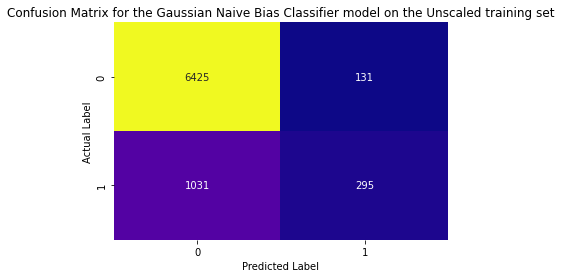

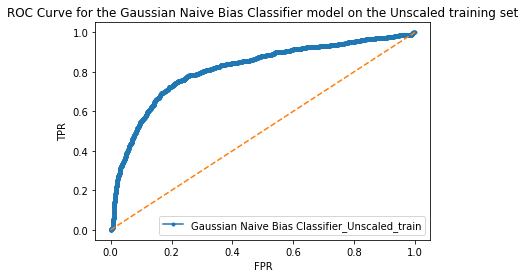



############################################Testing Set################################################ 

Classification report for the Gaussian Naive Bias Classifier model on the Unscaled testing set is 
               precision    recall  f1-score   support

           0       0.86      0.98      0.92      2808
           1       0.67      0.25      0.36       570

    accuracy                           0.85      3378
   macro avg       0.77      0.61      0.64      3378
weighted avg       0.83      0.85      0.82      3378



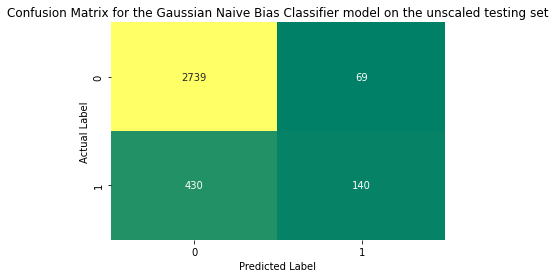

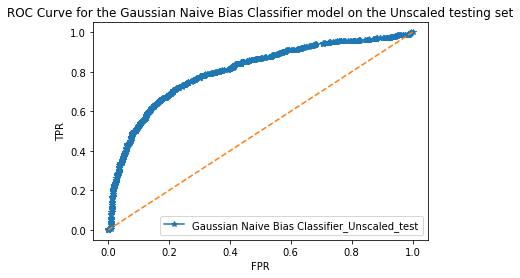

In [ ]:
perf_met_df_unscaled_nb, best_model_unscaled_nb = model_func(clfNB, None, X_train, X_test, y_train, y_test, 'Unscaled')

#### Scaled Data

--------------------Best Model Params--------------------
{'priors': None, 'var_smoothing': 1e-09}


Classification report for the Gaussian Naive Bias Classifier model on the Scaled training set is 
               precision    recall  f1-score   support

           0       0.88      0.97      0.92      6556
           1       0.70      0.31      0.43      1326

    accuracy                           0.86      7882
   macro avg       0.79      0.64      0.68      7882
weighted avg       0.85      0.86      0.84      7882



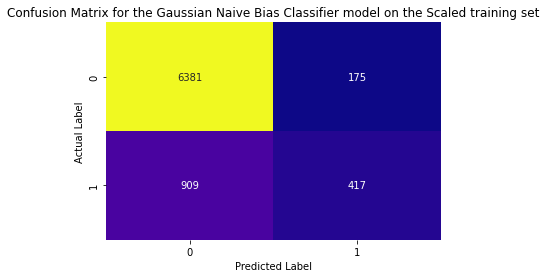

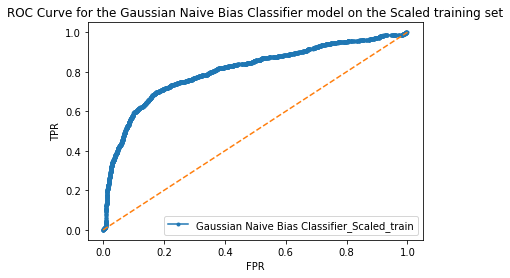



############################################Testing Set################################################ 

Classification report for the Gaussian Naive Bias Classifier model on the Scaled testing set is 
               precision    recall  f1-score   support

           0       0.88      0.97      0.92      2808
           1       0.70      0.32      0.44       570

    accuracy                           0.86      3378
   macro avg       0.79      0.65      0.68      3378
weighted avg       0.85      0.86      0.84      3378



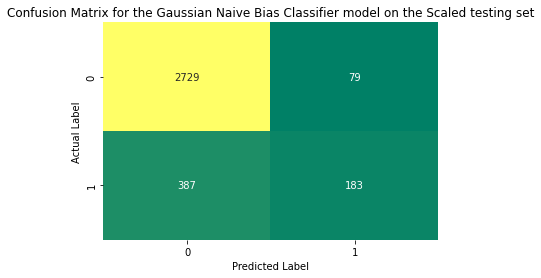

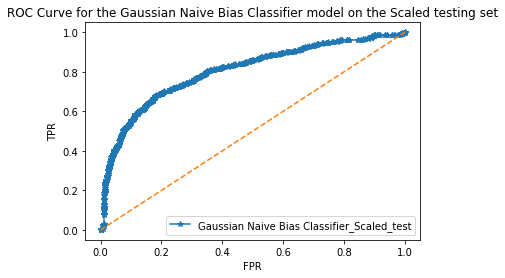

In [ ]:
perf_met_df_scaled_nb, best_model_scaled_nb = model_func(clfNB, None, X_scaled_train, X_scaled_test, y_scaled_train, y_scaled_test, 'Scaled')

#### Unscaled SMOTE Data

--------------------Best Model Params--------------------
{'priors': None, 'var_smoothing': 1e-09}


Classification report for the Gaussian Naive Bias Classifier model on the SMOTE training set is 
               precision    recall  f1-score   support

           0       0.77      0.76      0.77      6556
           1       0.77      0.77      0.77      6556

    accuracy                           0.77     13112
   macro avg       0.77      0.77      0.77     13112
weighted avg       0.77      0.77      0.77     13112



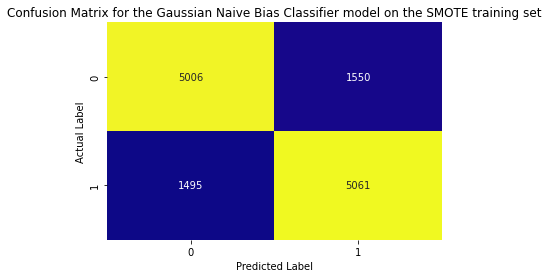

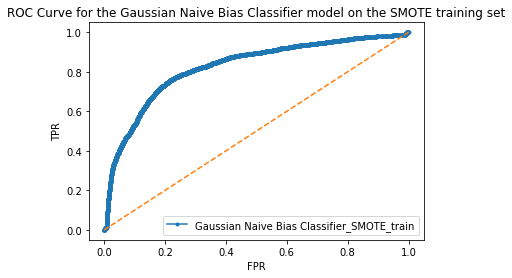



############################################Testing Set################################################ 

Classification report for the Gaussian Naive Bias Classifier model on the SMOTE testing set is 
               precision    recall  f1-score   support

           0       0.93      0.76      0.83      2808
           1       0.38      0.72      0.49       570

    accuracy                           0.75      3378
   macro avg       0.65      0.74      0.66      3378
weighted avg       0.84      0.75      0.78      3378



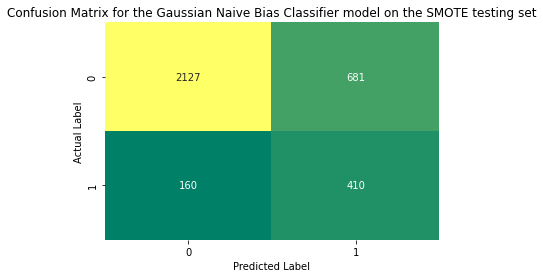

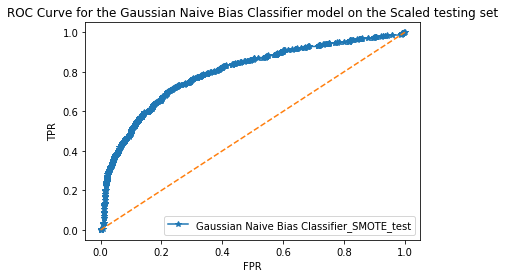

In [ ]:
perf_met_df_unscaled_nb_smote, best_model_unscaled_nb_smote = model_func(clfNB, None, X_train_smote, X_test_smote, y_train_smote, y_test_smote, 'SMOTE')

#### Scaled SMOTE Data 

--------------------Best Model Params--------------------
{'priors': None, 'var_smoothing': 1e-09}


Classification report for the Gaussian Naive Bias Classifier model on the SMOTE scaled training set is 
               precision    recall  f1-score   support

           0       0.76      0.71      0.74      6556
           1       0.73      0.78      0.75      6556

    accuracy                           0.75     13112
   macro avg       0.75      0.75      0.75     13112
weighted avg       0.75      0.75      0.75     13112



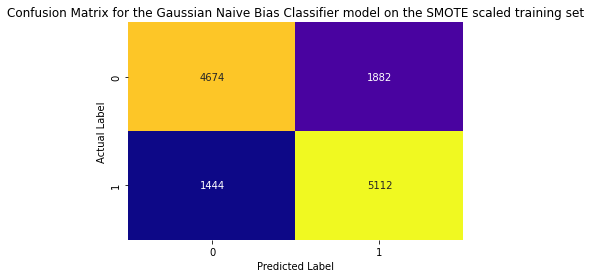

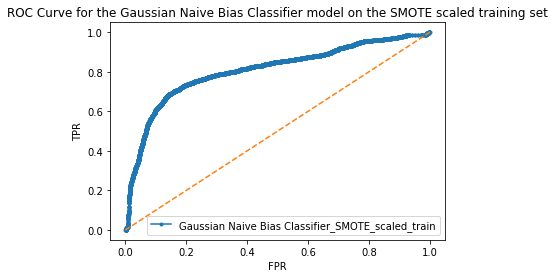



############################################Testing Set################################################ 

Classification report for the Gaussian Naive Bias Classifier model on the SMOTE scaled testing set is 
               precision    recall  f1-score   support

           0       0.93      0.72      0.81      2808
           1       0.35      0.74      0.47       570

    accuracy                           0.72      3378
   macro avg       0.64      0.73      0.64      3378
weighted avg       0.83      0.72      0.75      3378



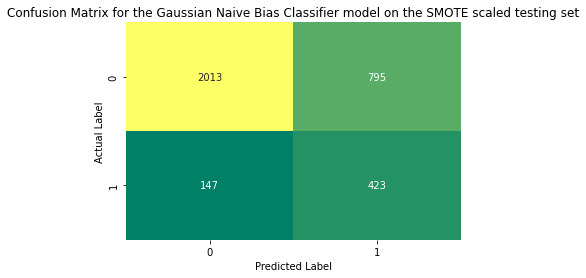

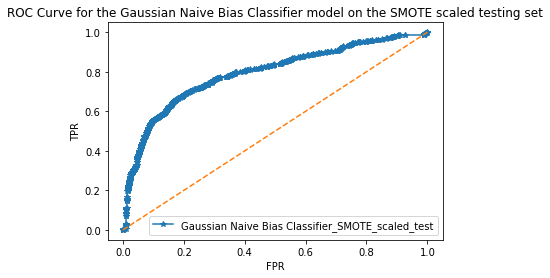

In [ ]:
perf_met_df_scaled_nb_smote, best_model_scaled_nb_smote = model_func(clfNB, None, X_scaled_train_smote, X_scaled_test_smote, y_scaled_train_smote, y_scaled_test_smote, 'SMOTE_Scaled')

#### Unscaled Data - GS

--------------------Best Parameters--------------------
{'var_smoothing': 1.873817422860383e-05}


--------------------Best Model Params--------------------
GaussianNB(var_smoothing=1.873817422860383e-05)


Classification report for the Gaussian Naive Bias Classifier model after grid search on the Unscaled training set is 
               precision    recall  f1-score   support

           0       0.86      0.98      0.92      6556
           1       0.70      0.22      0.34      1326

    accuracy                           0.85      7882
   macro avg       0.78      0.60      0.63      7882
weighted avg       0.83      0.85      0.82      7882



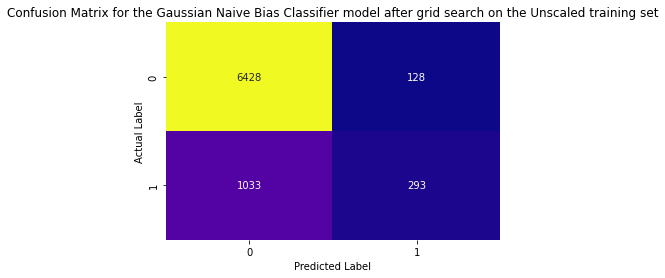

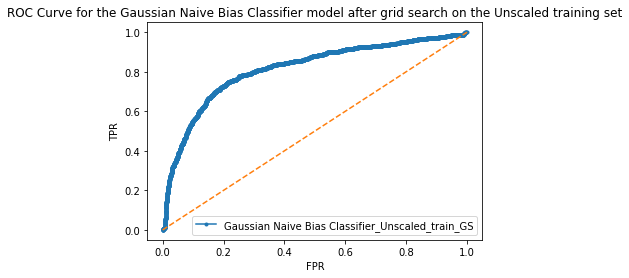



############################################Testing Set################################################ 

Classification report for the Gaussian Naive Bias Classifier model after grid search on the Unscaled testing set is 
               precision    recall  f1-score   support

           0       0.86      0.98      0.92      2808
           1       0.67      0.24      0.35       570

    accuracy                           0.85      3378
   macro avg       0.77      0.61      0.63      3378
weighted avg       0.83      0.85      0.82      3378



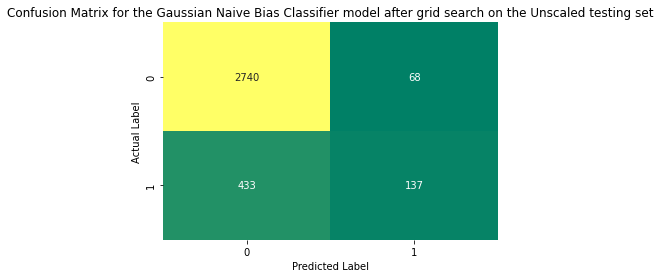

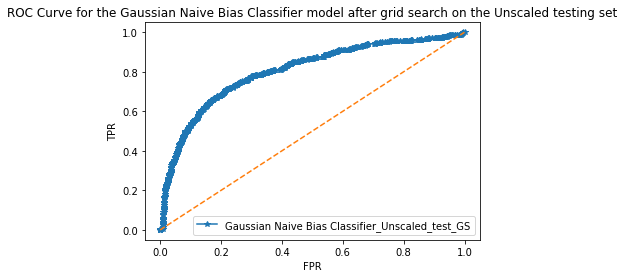

In [ ]:
perf_met_df_unscaled_nb_gs, best_model_unscaled_nb_gs = model_func(clfNB, param_grid_NB, X_train, X_test, y_train, y_test, 'Unscaled')

#### Scaled Data - GS

--------------------Best Parameters--------------------
{'var_smoothing': 0.0003511191734215131}


--------------------Best Model Params--------------------
GaussianNB(var_smoothing=0.0003511191734215131)


Classification report for the Gaussian Naive Bias Classifier model after grid search on the Scaled training set is 
               precision    recall  f1-score   support

           0       0.88      0.97      0.92      6556
           1       0.70      0.31      0.43      1326

    accuracy                           0.86      7882
   macro avg       0.79      0.64      0.68      7882
weighted avg       0.85      0.86      0.84      7882



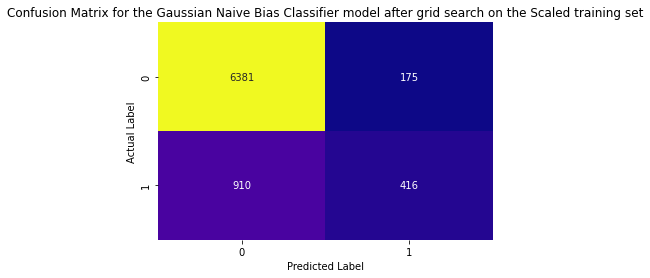

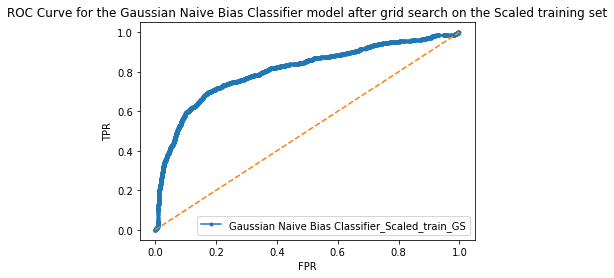



############################################Testing Set################################################ 

Classification report for the Gaussian Naive Bias Classifier model after grid search on the Scaled testing set is 
               precision    recall  f1-score   support

           0       0.88      0.97      0.92      2808
           1       0.70      0.32      0.44       570

    accuracy                           0.86      3378
   macro avg       0.79      0.65      0.68      3378
weighted avg       0.85      0.86      0.84      3378



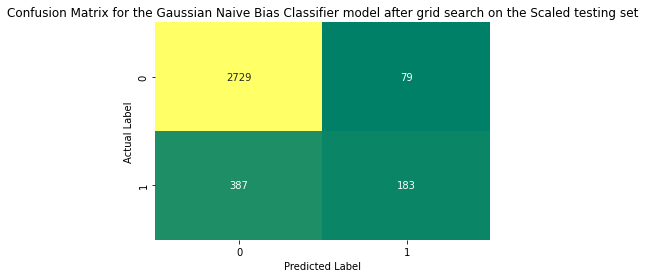

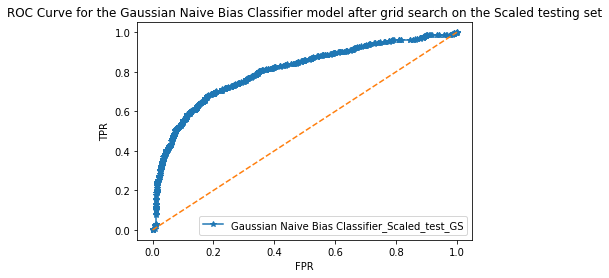

In [ ]:
perf_met_df_scaled_nb_gs, best_model_scaled_nb_gs = model_func(clfNB, param_grid_NB, X_scaled_train, X_scaled_test, y_scaled_train, y_scaled_test, 'Scaled')

#### Unscaled SMOTE Data - GS

--------------------Best Parameters--------------------
{'var_smoothing': 0.0001}


--------------------Best Model Params--------------------
GaussianNB(var_smoothing=0.0001)


Classification report for the Gaussian Naive Bias Classifier model after grid search on the SMOTE training set is 
               precision    recall  f1-score   support

           0       0.77      0.76      0.77      6556
           1       0.77      0.77      0.77      6556

    accuracy                           0.77     13112
   macro avg       0.77      0.77      0.77     13112
weighted avg       0.77      0.77      0.77     13112



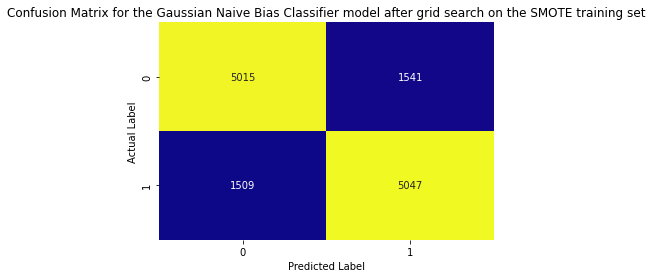

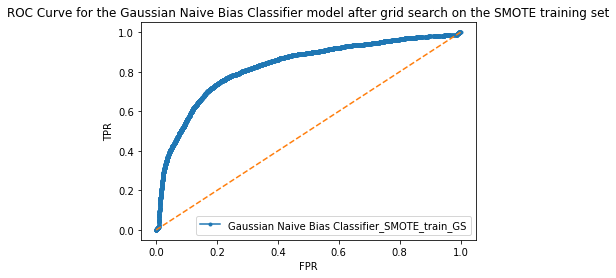



############################################Testing Set################################################ 

Classification report for the Gaussian Naive Bias Classifier model after grid search on the SMOTE testing set is 
               precision    recall  f1-score   support

           0       0.93      0.76      0.84      2808
           1       0.38      0.72      0.49       570

    accuracy                           0.75      3378
   macro avg       0.65      0.74      0.67      3378
weighted avg       0.84      0.75      0.78      3378



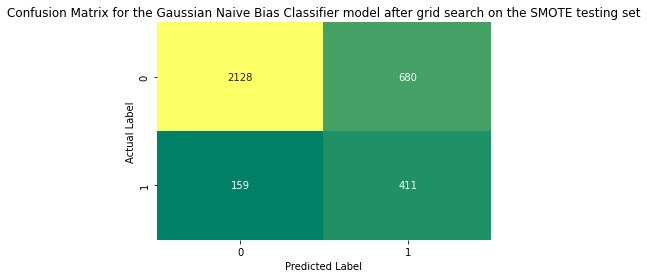

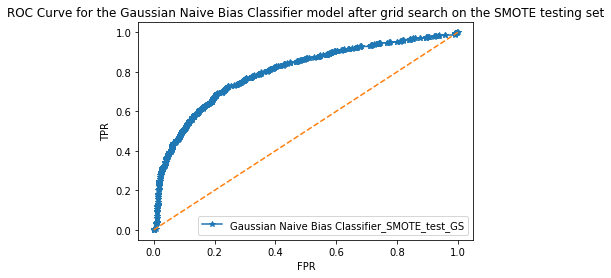

In [ ]:
perf_met_df_unscaled_nb_smote_gs, best_model_unscaled_nb_smote_gs = model_func(clfNB, param_grid_NB, X_train_smote, X_test_smote, y_train_smote, y_test_smote, 'SMOTE')

#### Scaled SMOTE Data - GS

--------------------Best Parameters--------------------
{'var_smoothing': 0.001873817422860383}


--------------------Best Model Params--------------------
GaussianNB(var_smoothing=0.001873817422860383)


Classification report for the Gaussian Naive Bias Classifier model after grid search on the SMOTE scaled training set is 
               precision    recall  f1-score   support

           0       0.76      0.71      0.74      6556
           1       0.73      0.78      0.75      6556

    accuracy                           0.75     13112
   macro avg       0.75      0.75      0.75     13112
weighted avg       0.75      0.75      0.75     13112



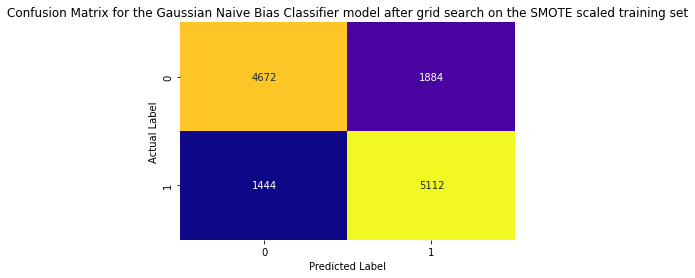

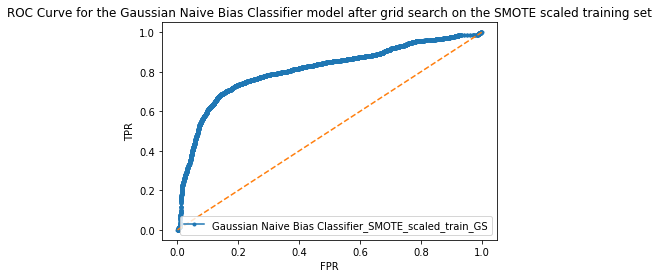



############################################Testing Set################################################ 

Classification report for the Gaussian Naive Bias Classifier model after grid search on the SMOTE scaled testing set is 
               precision    recall  f1-score   support

           0       0.93      0.72      0.81      2808
           1       0.35      0.74      0.47       570

    accuracy                           0.72      3378
   macro avg       0.64      0.73      0.64      3378
weighted avg       0.83      0.72      0.75      3378



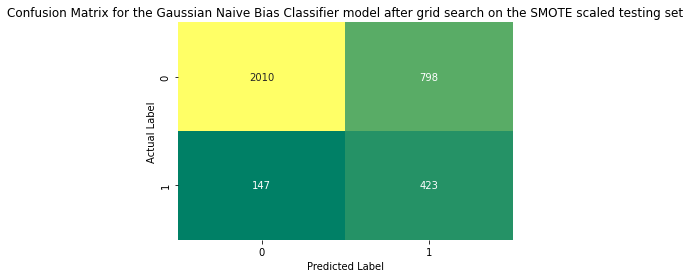

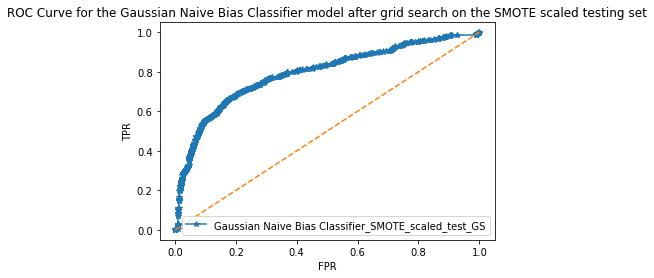

In [ ]:
perf_met_df_scaled_nb_smote_gs, best_model_scaled_nb_smote_gs = model_func(clfNB, param_grid_NB, X_scaled_train_smote, X_scaled_test_smote, y_scaled_train_smote, y_scaled_test_smote, 'SMOTE_Scaled')

### **Decesion Tree Classifier**

#### Unscaled Data

--------------------Best Model Params--------------------
{'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'random_state': 1, 'splitter': 'best'}


Classification report for the Decision Tree Classifier model on the Unscaled training set is 
               precision    recall  f1-score   support

           0       0.99      1.00      1.00      6556
           1       1.00      0.97      0.98      1326

    accuracy                           0.99      7882
   macro avg       0.99      0.99      0.99      7882
weighted avg       0.99      0.99      0.99      7882



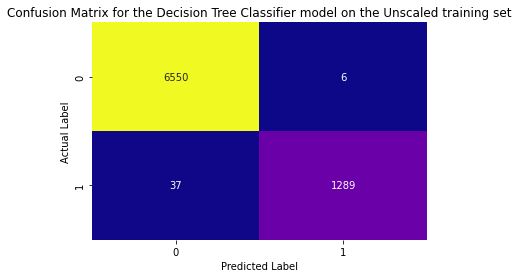

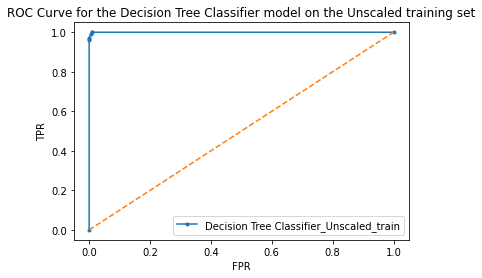



############################################Testing Set################################################ 

Classification report for the Decision Tree Classifier model on the Unscaled testing set is 
               precision    recall  f1-score   support

           0       0.97      0.97      0.97      2808
           1       0.85      0.86      0.86       570

    accuracy                           0.95      3378
   macro avg       0.91      0.92      0.92      3378
weighted avg       0.95      0.95      0.95      3378



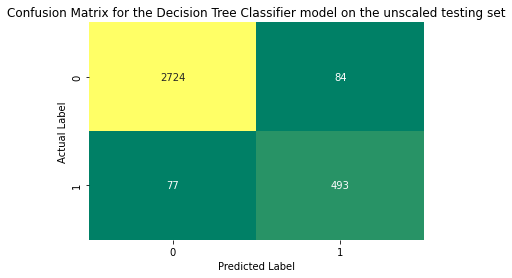

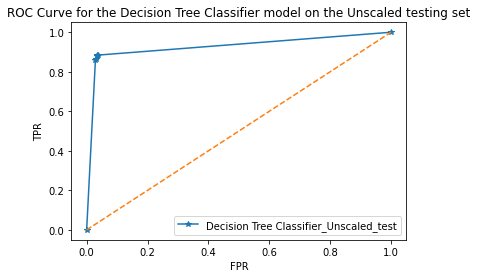

In [ ]:
perf_met_df_unscaled_dtc, best_model_unscaled_dtc = model_func(clfDTC, None, X_train, X_test, y_train, y_test, 'Unscaled')

#### Scaled Data

--------------------Best Model Params--------------------
{'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'random_state': 1, 'splitter': 'best'}


Classification report for the Decision Tree Classifier model on the Scaled training set is 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      6556
           1       1.00      1.00      1.00      1326

    accuracy                           1.00      7882
   macro avg       1.00      1.00      1.00      7882
weighted avg       1.00      1.00      1.00      7882



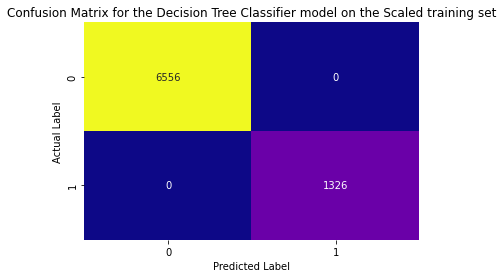

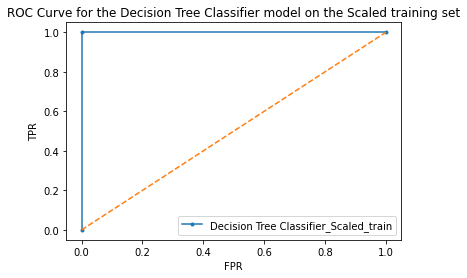



############################################Testing Set################################################ 

Classification report for the Decision Tree Classifier model on the Scaled testing set is 
               precision    recall  f1-score   support

           0       0.96      0.96      0.96      2808
           1       0.82      0.82      0.82       570

    accuracy                           0.94      3378
   macro avg       0.89      0.89      0.89      3378
weighted avg       0.94      0.94      0.94      3378



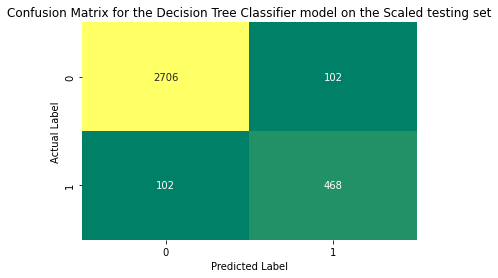

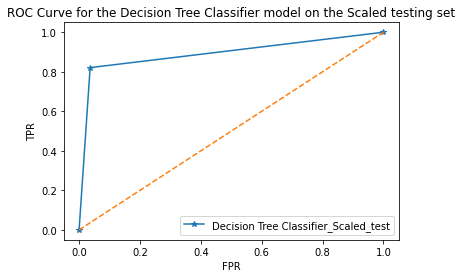

In [ ]:
perf_met_df_scaled_dtc, best_model_scaled_dtc = model_func(clfDTC, None, X_scaled_train, X_scaled_test, y_scaled_train, y_scaled_test, 'Scaled')

#### Unscaled SMOTE Data

--------------------Best Model Params--------------------
{'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'random_state': 1, 'splitter': 'best'}


Classification report for the Decision Tree Classifier model on the SMOTE training set is 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      6556
           1       1.00      1.00      1.00      6556

    accuracy                           1.00     13112
   macro avg       1.00      1.00      1.00     13112
weighted avg       1.00      1.00      1.00     13112



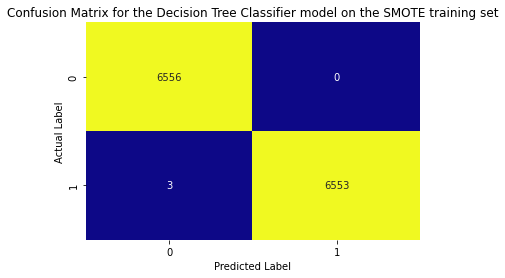

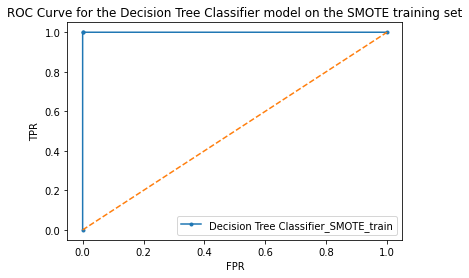



############################################Testing Set################################################ 

Classification report for the Decision Tree Classifier model on the SMOTE testing set is 
               precision    recall  f1-score   support

           0       0.96      0.96      0.96      2808
           1       0.80      0.81      0.80       570

    accuracy                           0.93      3378
   macro avg       0.88      0.88      0.88      3378
weighted avg       0.93      0.93      0.93      3378



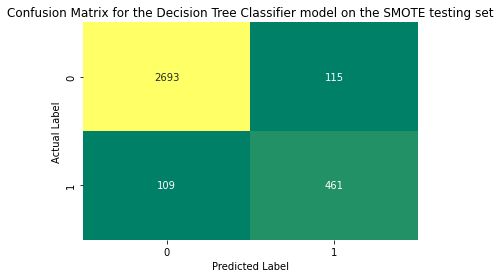

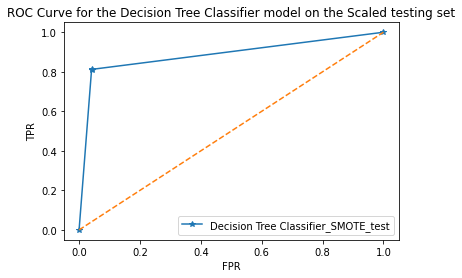

In [ ]:
perf_met_df_unscaled_dtc_smote, best_model_unscaled_dtc_smote = model_func(clfDTC, None, X_train_smote, X_test_smote, y_train_smote, y_test_smote, 'SMOTE')

#### Scaled SMOTE Data 

--------------------Best Model Params--------------------
{'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'random_state': 1, 'splitter': 'best'}


Classification report for the Decision Tree Classifier model on the SMOTE scaled training set is 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      6556
           1       1.00      1.00      1.00      6556

    accuracy                           1.00     13112
   macro avg       1.00      1.00      1.00     13112
weighted avg       1.00      1.00      1.00     13112



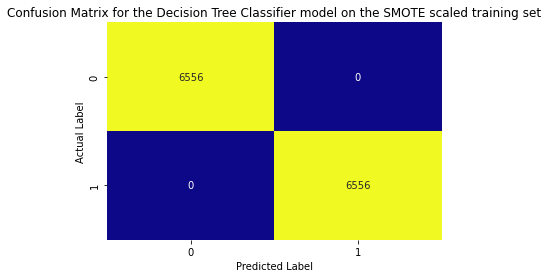

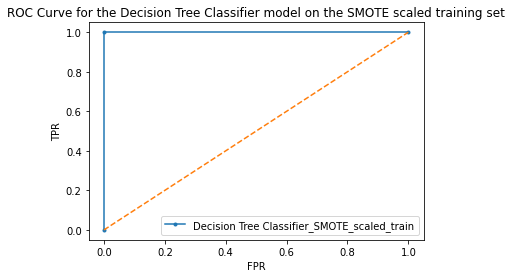



############################################Testing Set################################################ 

Classification report for the Decision Tree Classifier model on the SMOTE scaled testing set is 
               precision    recall  f1-score   support

           0       0.96      0.95      0.96      2808
           1       0.78      0.82      0.80       570

    accuracy                           0.93      3378
   macro avg       0.87      0.89      0.88      3378
weighted avg       0.93      0.93      0.93      3378



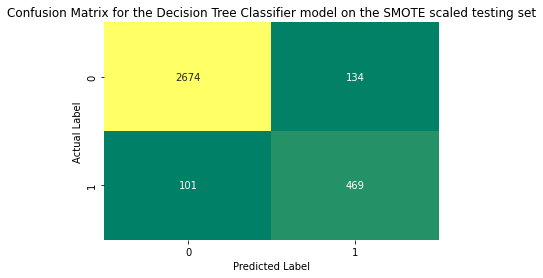

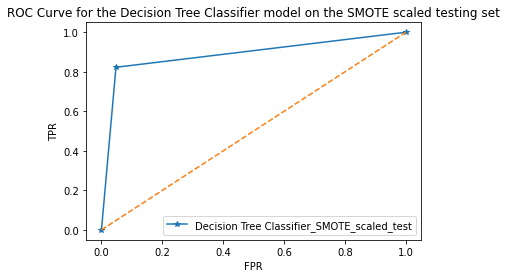

In [ ]:
perf_met_df_scaled_dtc_smote, best_model_scaled_dtc_smote = model_func(clfDTC, None, X_scaled_train_smote, X_scaled_test_smote, y_scaled_train_smote, y_scaled_test_smote, 'SMOTE_Scaled')

#### Unscaled Data - GS

--------------------Best Parameters--------------------
{'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 50, 'min_samples_split': 150}


--------------------Best Model Params--------------------
DecisionTreeClassifier(max_depth=10, min_samples_leaf=50, min_samples_split=150,
                       random_state=1)


Classification report for the Decision Tree Classifier model after grid search on the Unscaled training set is 
               precision    recall  f1-score   support

           0       0.91      0.96      0.94      6556
           1       0.75      0.51      0.61      1326

    accuracy                           0.89      7882
   macro avg       0.83      0.74      0.77      7882
weighted avg       0.88      0.89      0.88      7882



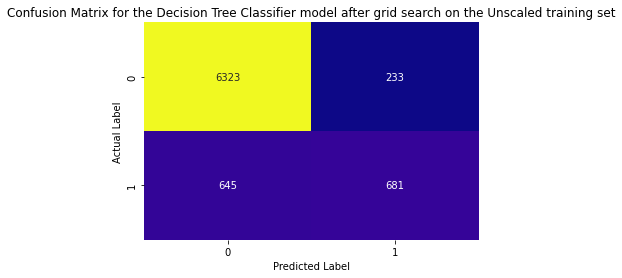

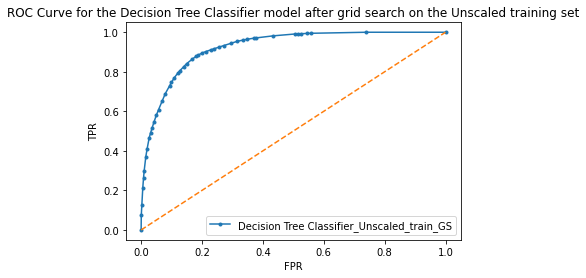



############################################Testing Set################################################ 

Classification report for the Decision Tree Classifier model after grid search on the Unscaled testing set is 
               precision    recall  f1-score   support

           0       0.91      0.97      0.94      2808
           1       0.77      0.51      0.61       570

    accuracy                           0.89      3378
   macro avg       0.84      0.74      0.78      3378
weighted avg       0.88      0.89      0.88      3378



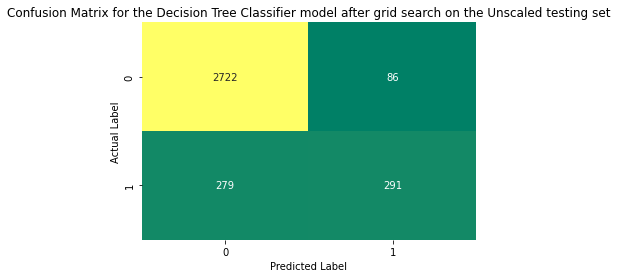

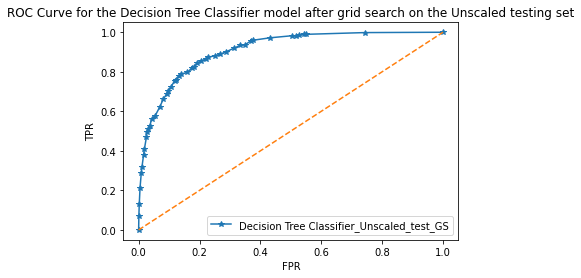

In [ ]:
perf_met_df_unscaled_dtc_gs, best_model_unscaled_dtc_gs = model_func(clfDTC, param_grid_DTC, X_train, X_test, y_train, y_test, 'Unscaled')

#### Scaled Data - GS

--------------------Best Parameters--------------------
{'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 50, 'min_samples_split': 150}


--------------------Best Model Params--------------------
DecisionTreeClassifier(criterion='entropy', max_depth=10, min_samples_leaf=50,
                       min_samples_split=150, random_state=1)


Classification report for the Decision Tree Classifier model after grid search on the Scaled training set is 
               precision    recall  f1-score   support

           0       0.91      0.96      0.93      6556
           1       0.74      0.53      0.62      1326

    accuracy                           0.89      7882
   macro avg       0.82      0.75      0.78      7882
weighted avg       0.88      0.89      0.88      7882



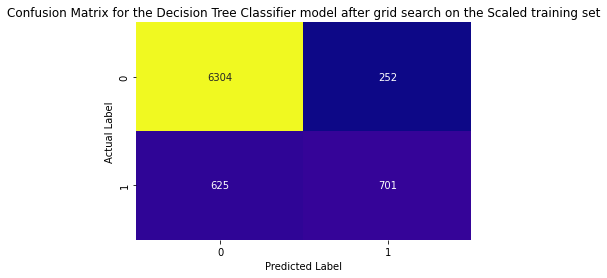

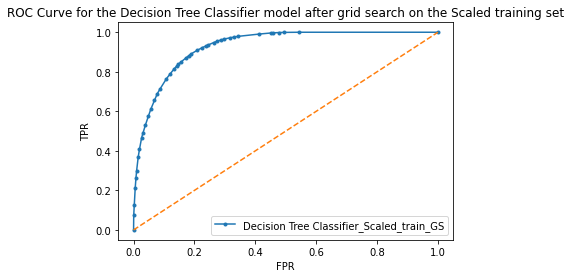



############################################Testing Set################################################ 

Classification report for the Decision Tree Classifier model after grid search on the Scaled testing set is 
               precision    recall  f1-score   support

           0       0.91      0.96      0.94      2808
           1       0.75      0.52      0.62       570

    accuracy                           0.89      3378
   macro avg       0.83      0.74      0.78      3378
weighted avg       0.88      0.89      0.88      3378



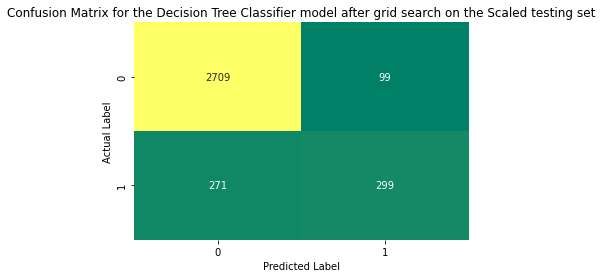

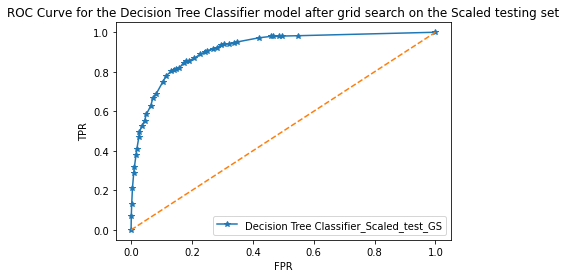

In [ ]:
perf_met_df_scaled_dtc_gs, best_model_scaled_dtc_gs = model_func(clfDTC, param_grid_DTC, X_scaled_train, X_scaled_test, y_scaled_train, y_scaled_test, 'Scaled')

#### Unscaled SMOTE Data - GS

--------------------Best Parameters--------------------
{'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 50, 'min_samples_split': 150}


--------------------Best Model Params--------------------
DecisionTreeClassifier(max_depth=10, min_samples_leaf=50, min_samples_split=150,
                       random_state=1)


Classification report for the Decision Tree Classifier model after grid search on the SMOTE training set is 
               precision    recall  f1-score   support

           0       0.88      0.89      0.89      6556
           1       0.89      0.88      0.89      6556

    accuracy                           0.89     13112
   macro avg       0.89      0.89      0.89     13112
weighted avg       0.89      0.89      0.89     13112



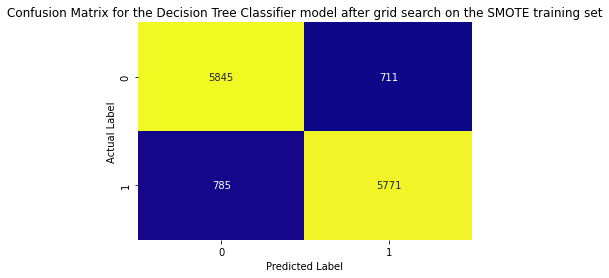

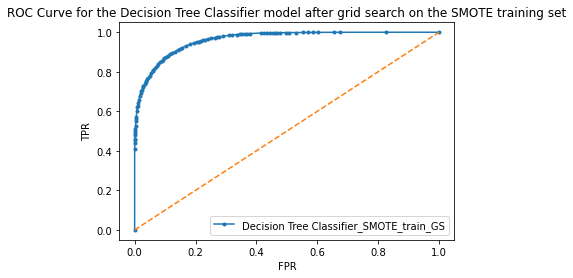



############################################Testing Set################################################ 

Classification report for the Decision Tree Classifier model after grid search on the SMOTE testing set is 
               precision    recall  f1-score   support

           0       0.95      0.89      0.92      2808
           1       0.58      0.76      0.66       570

    accuracy                           0.87      3378
   macro avg       0.76      0.83      0.79      3378
weighted avg       0.89      0.87      0.87      3378



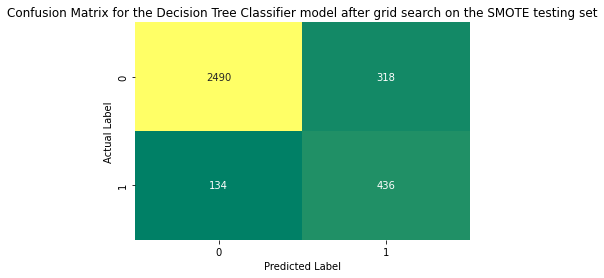

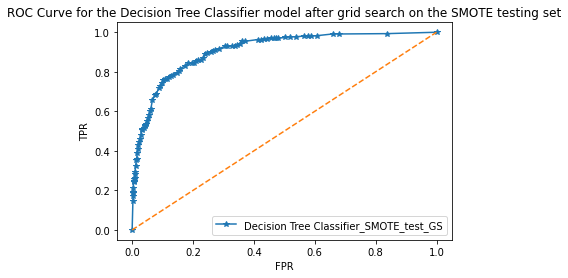

In [ ]:
perf_met_df_unscaled_dtc_smote_gs, best_model_unscaled_dtc_smote_gs = model_func(clfDTC, param_grid_DTC, X_train_smote, X_test_smote, y_train_smote, y_test_smote, 'SMOTE')

#### Scaled SMOTE Data - GS

--------------------Best Parameters--------------------
{'criterion': 'entropy', 'max_depth': 20, 'min_samples_leaf': 50, 'min_samples_split': 150}


--------------------Best Model Params--------------------
DecisionTreeClassifier(criterion='entropy', max_depth=20, min_samples_leaf=50,
                       min_samples_split=150, random_state=1)


Classification report for the Decision Tree Classifier model after grid search on the SMOTE scaled training set is 
               precision    recall  f1-score   support

           0       0.92      0.86      0.89      6556
           1       0.87      0.92      0.90      6556

    accuracy                           0.89     13112
   macro avg       0.90      0.89      0.89     13112
weighted avg       0.90      0.89      0.89     13112



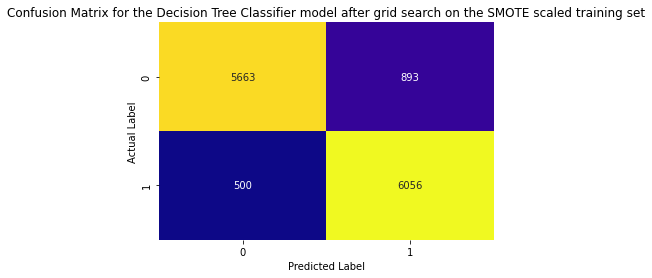

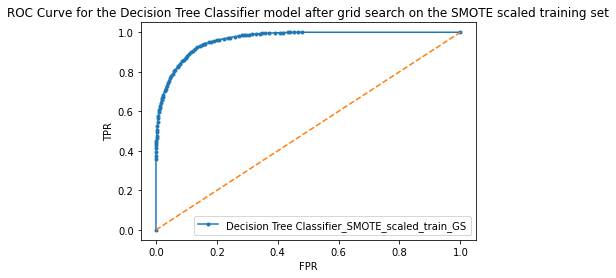



############################################Testing Set################################################ 

Classification report for the Decision Tree Classifier model after grid search on the SMOTE scaled testing set is 
               precision    recall  f1-score   support

           0       0.96      0.86      0.90      2808
           1       0.54      0.82      0.65       570

    accuracy                           0.85      3378
   macro avg       0.75      0.84      0.78      3378
weighted avg       0.89      0.85      0.86      3378



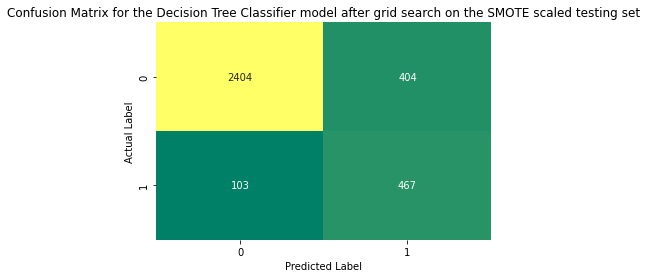

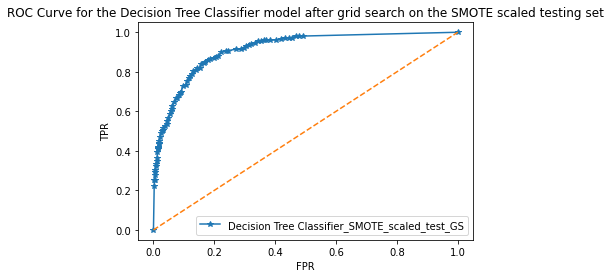

In [ ]:
perf_met_df_scaled_dtc_smote_gs, best_model_scaled_dtc_smote_gs = model_func(clfDTC, param_grid_DTC, X_scaled_train_smote, X_scaled_test_smote, y_scaled_train_smote, y_scaled_test_smote, 'SMOTE_Scaled')

### **Random Forest Classifier**

#### Unscaled Data

--------------------Best Model Params--------------------
{'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'auto', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': 1, 'verbose': 0, 'warm_start': False}


Classification report for the Ensemble Random Forest model on the Unscaled training set is 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      6556
           1       0.98      0.98      0.98      1326

    accuracy                           0.99      7882
   macro avg       0.99      0.99      0.99      7882
weighted avg       0.99      0.99      0.99      7882



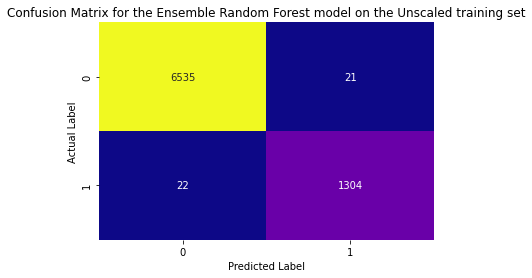

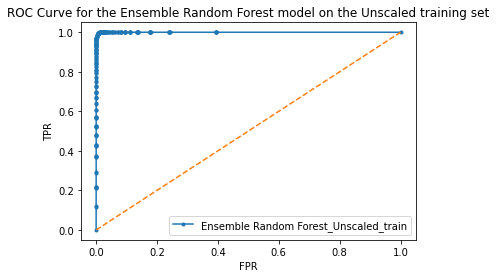



############################################Testing Set################################################ 

Classification report for the Ensemble Random Forest model on the Unscaled testing set is 
               precision    recall  f1-score   support

           0       0.97      0.98      0.98      2808
           1       0.91      0.86      0.89       570

    accuracy                           0.96      3378
   macro avg       0.94      0.92      0.93      3378
weighted avg       0.96      0.96      0.96      3378



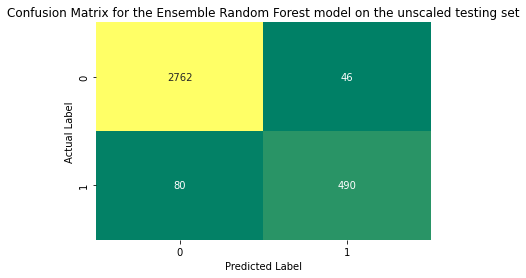

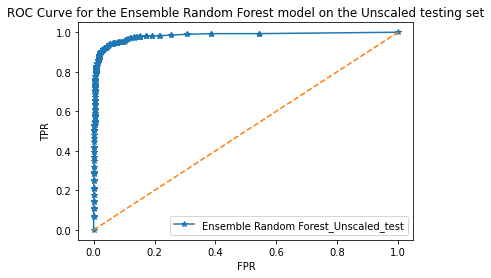

In [ ]:
perf_met_df_unscaled_rf, best_model_unscaled_rf = model_func(clfRF, None, X_train, X_test, y_train, y_test, 'Unscaled')

#### Scaled Data

--------------------Best Model Params--------------------
{'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'auto', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': 1, 'verbose': 0, 'warm_start': False}


Classification report for the Ensemble Random Forest model on the Scaled training set is 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      6556
           1       1.00      1.00      1.00      1326

    accuracy                           1.00      7882
   macro avg       1.00      1.00      1.00      7882
weighted avg       1.00      1.00      1.00      7882



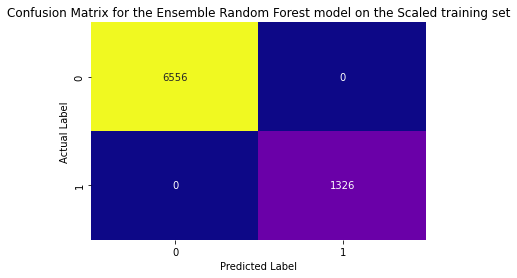

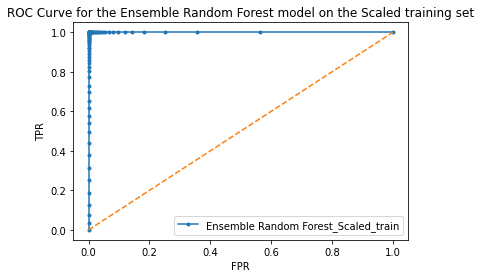



############################################Testing Set################################################ 

Classification report for the Ensemble Random Forest model on the Scaled testing set is 
               precision    recall  f1-score   support

           0       0.97      0.99      0.98      2808
           1       0.95      0.83      0.89       570

    accuracy                           0.97      3378
   macro avg       0.96      0.91      0.93      3378
weighted avg       0.96      0.97      0.96      3378



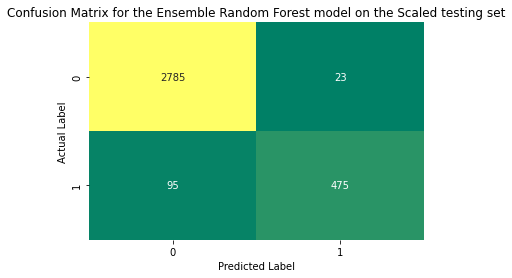

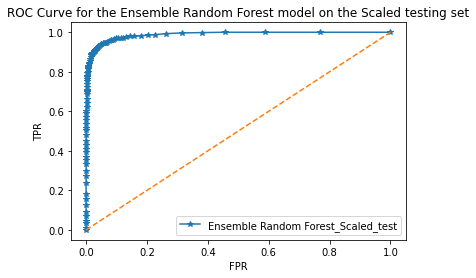

In [ ]:
perf_met_df_scaled_rf, best_model_scaled_rf = model_func(clfRF, None, X_scaled_train, X_scaled_test, y_scaled_train, y_scaled_test, 'Scaled')

#### Unscaled SMOTE Data

In [ ]:
X_train_smote.shape

(13112, 12)

--------------------Best Model Params--------------------
{'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'auto', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': 1, 'verbose': 0, 'warm_start': False}


Classification report for the Ensemble Random Forest model on the SMOTE training set is 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      6556
           1       1.00      1.00      1.00      6556

    accuracy                           1.00     13112
   macro avg       1.00      1.00      1.00     13112
weighted avg       1.00      1.00      1.00     13112



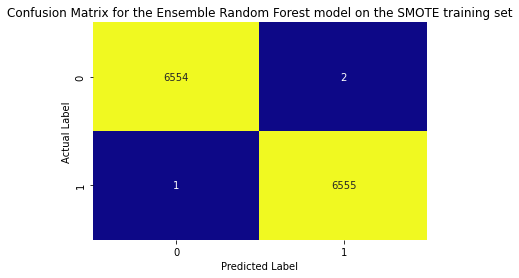

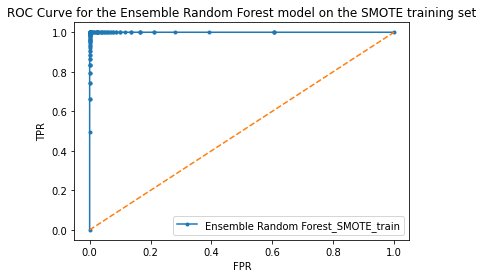



############################################Testing Set################################################ 

Classification report for the Ensemble Random Forest model on the SMOTE testing set is 
               precision    recall  f1-score   support

           0       0.97      0.98      0.98      2808
           1       0.91      0.86      0.89       570

    accuracy                           0.96      3378
   macro avg       0.94      0.92      0.93      3378
weighted avg       0.96      0.96      0.96      3378



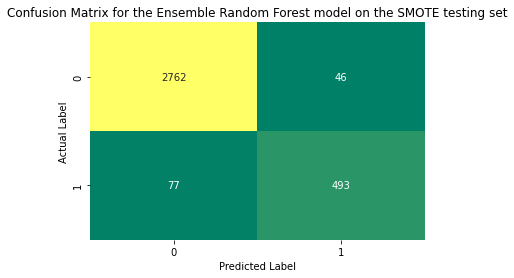

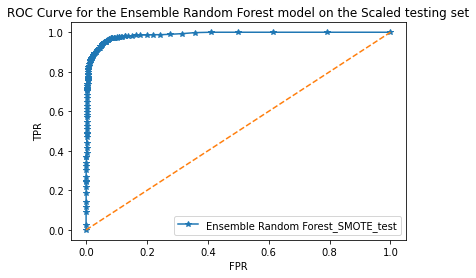

In [ ]:
perf_met_df_unscaled_rf_smote, best_model_unscaled_rf_smote = model_func(clfRF, None, X_train_smote, X_test_smote, y_train_smote, y_test_smote, 'SMOTE')

In [ ]:
best_model_unscaled_rf_smote.feature_importances_

array([0.3117155 , 0.03682948, 0.06956061, 0.04164723, 0.01938744,
       0.07512451, 0.07560911, 0.03064693, 0.06576006, 0.13403591,
       0.04898956, 0.09069366])

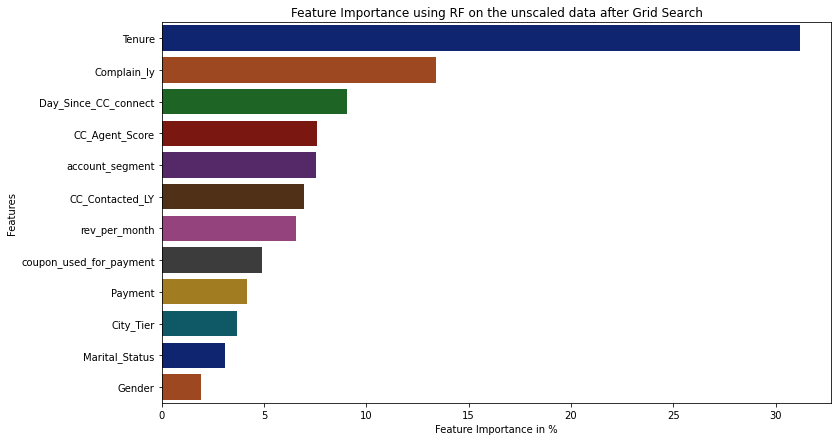

In [ ]:
feat_imp_df=pd.DataFrame(best_model_unscaled_rf_smote.feature_importances_*100, index=X_train_smote.columns).sort_values(by=0,ascending=False)
plt.figure(figsize=(12,7))
sns.barplot(feat_imp_df[0],feat_imp_df.index,palette='dark')
plt.xlabel('Feature Importance in %')
plt.ylabel('Features')
plt.title('Feature Importance using RF on the unscaled data after Grid Search')
plt.show()

#### Scaled SMOTE Data 

--------------------Best Model Params--------------------
{'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'auto', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': 1, 'verbose': 0, 'warm_start': False}


Classification report for the Ensemble Random Forest model on the SMOTE scaled training set is 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      6556
           1       1.00      1.00      1.00      6556

    accuracy                           1.00     13112
   macro avg       1.00      1.00      1.00     13112
weighted avg       1.00      1.00      1.00     13112



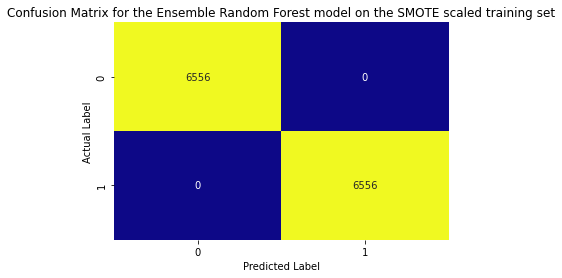

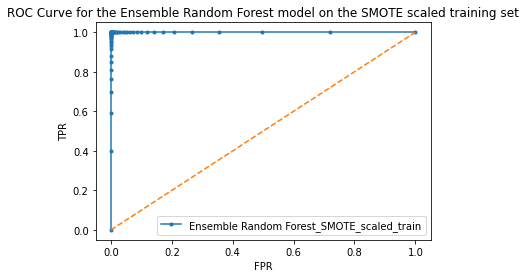



############################################Testing Set################################################ 

Classification report for the Ensemble Random Forest model on the SMOTE scaled testing set is 
               precision    recall  f1-score   support

           0       0.98      0.99      0.98      2808
           1       0.93      0.89      0.91       570

    accuracy                           0.97      3378
   macro avg       0.95      0.94      0.94      3378
weighted avg       0.97      0.97      0.97      3378



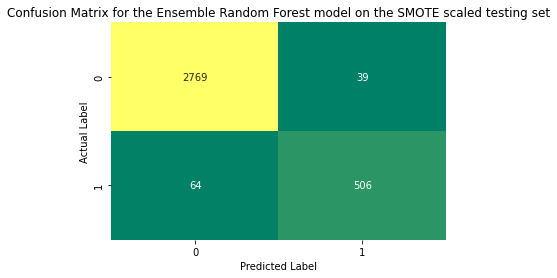

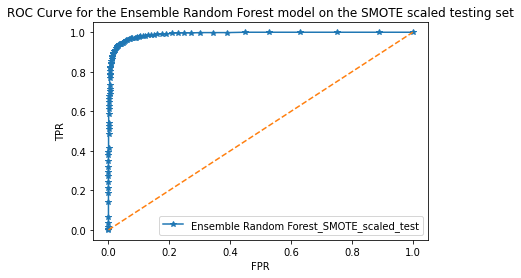

In [ ]:
perf_met_df_scaled_rf_smote, best_model_scaled_rf_smote = model_func(clfRF, None, X_scaled_train_smote, X_scaled_test_smote, y_scaled_train_smote, y_scaled_test_smote, 'SMOTE_Scaled')

#### Unscaled Data - GS

--------------------Best Parameters--------------------
{'bootstrap': True, 'criterion': 'gini', 'max_features': 'auto', 'max_samples': 500, 'n_estimators': 500}


--------------------Best Model Params--------------------
RandomForestClassifier(max_samples=500, n_estimators=500, random_state=1)


Classification report for the Ensemble Random Forest model after grid search on the Unscaled training set is 
               precision    recall  f1-score   support

           0       0.93      0.98      0.95      6556
           1       0.85      0.61      0.71      1326

    accuracy                           0.92      7882
   macro avg       0.89      0.79      0.83      7882
weighted avg       0.91      0.92      0.91      7882



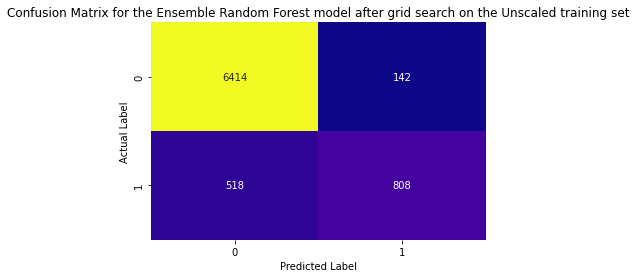

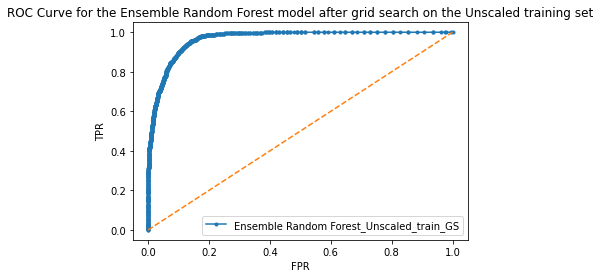



############################################Testing Set################################################ 

Classification report for the Ensemble Random Forest model after grid search on the Unscaled testing set is 
               precision    recall  f1-score   support

           0       0.92      0.97      0.95      2808
           1       0.82      0.59      0.69       570

    accuracy                           0.91      3378
   macro avg       0.87      0.78      0.82      3378
weighted avg       0.90      0.91      0.90      3378



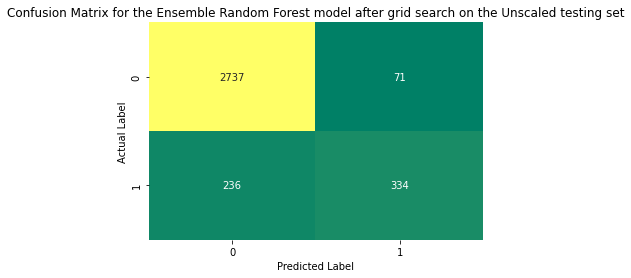

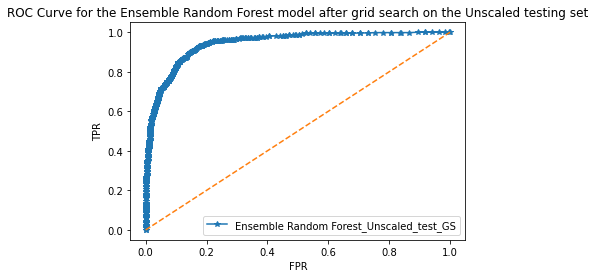

In [ ]:
perf_met_df_unscaled_rf_gs, best_model_unscaled_rf_gs = model_func(clfRF, param_grid_RF, X_train, X_test, y_train, y_test, 'Unscaled')

#### Scaled Data - GS

--------------------Best Parameters--------------------
{'bootstrap': True, 'criterion': 'gini', 'max_features': 'auto', 'max_samples': 500, 'n_estimators': 500}


--------------------Best Model Params--------------------
RandomForestClassifier(max_samples=500, n_estimators=500, random_state=1)


Classification report for the Ensemble Random Forest model after grid search on the Scaled training set is 
               precision    recall  f1-score   support

           0       0.92      0.98      0.95      6556
           1       0.88      0.56      0.69      1326

    accuracy                           0.91      7882
   macro avg       0.90      0.77      0.82      7882
weighted avg       0.91      0.91      0.91      7882



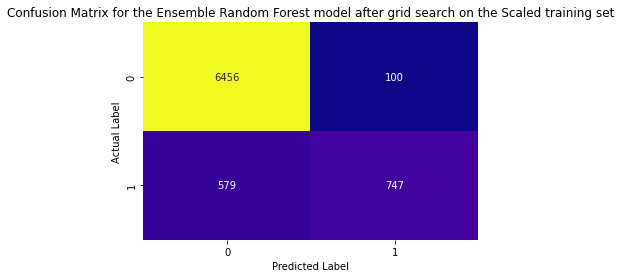

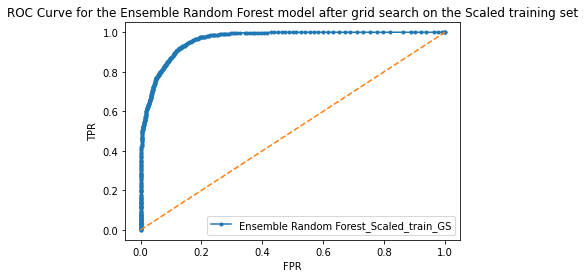



############################################Testing Set################################################ 

Classification report for the Ensemble Random Forest model after grid search on the Scaled testing set is 
               precision    recall  f1-score   support

           0       0.91      0.98      0.95      2808
           1       0.84      0.54      0.66       570

    accuracy                           0.91      3378
   macro avg       0.88      0.76      0.80      3378
weighted avg       0.90      0.91      0.90      3378



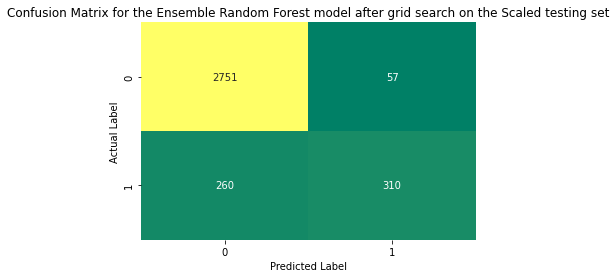

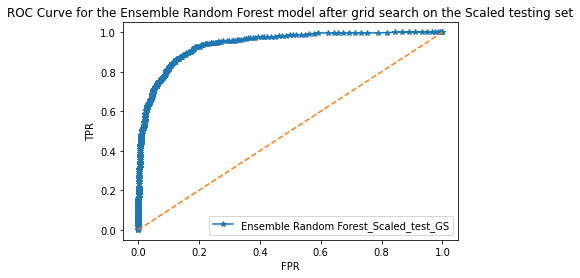

In [ ]:
perf_met_df_scaled_rf_gs, best_model_scaled_rf_gs = model_func(clfRF, param_grid_RF, X_scaled_train, X_scaled_test, y_scaled_train, y_scaled_test, 'Scaled')

#### Unscaled SMOTE Data - GS

--------------------Best Parameters--------------------
{'bootstrap': True, 'criterion': 'gini', 'max_features': 'auto', 'max_samples': 500, 'n_estimators': 500}


--------------------Best Model Params--------------------
RandomForestClassifier(max_samples=500, n_estimators=500, random_state=1)


Classification report for the Ensemble Random Forest model after grid search on the SMOTE training set is 
               precision    recall  f1-score   support

           0       0.92      0.92      0.92      6556
           1       0.92      0.91      0.92      6556

    accuracy                           0.92     13112
   macro avg       0.92      0.92      0.92     13112
weighted avg       0.92      0.92      0.92     13112



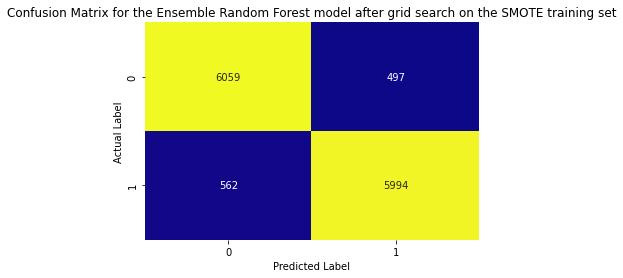

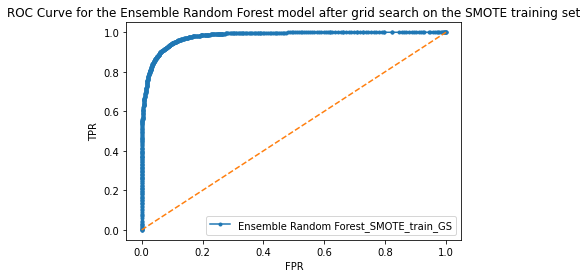



############################################Testing Set################################################ 

Classification report for the Ensemble Random Forest model after grid search on the SMOTE testing set is 
               precision    recall  f1-score   support

           0       0.95      0.92      0.94      2808
           1       0.66      0.77      0.71       570

    accuracy                           0.89      3378
   macro avg       0.81      0.84      0.82      3378
weighted avg       0.90      0.89      0.90      3378



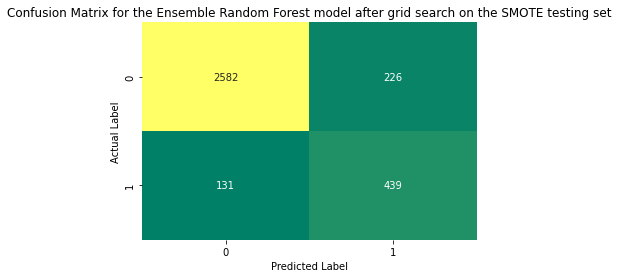

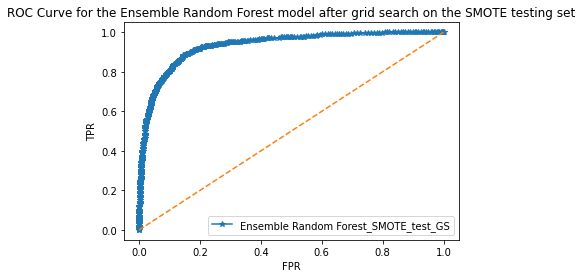

In [ ]:
perf_met_df_unscaled_rf_smote_gs, best_model_unscaled_rf_smote_gs = model_func(clfRF, param_grid_RF, X_train_smote, X_test_smote, y_train_smote, y_test_smote, 'SMOTE')

#### Scaled SMOTE Data - GS

--------------------Best Parameters--------------------
{'bootstrap': True, 'criterion': 'gini', 'max_features': 'auto', 'max_samples': 500, 'n_estimators': 500}


--------------------Best Model Params--------------------
RandomForestClassifier(max_samples=500, n_estimators=500, random_state=1)


Classification report for the Ensemble Random Forest model after grid search on the SMOTE scaled training set is 
               precision    recall  f1-score   support

           0       0.91      0.91      0.91      6556
           1       0.91      0.91      0.91      6556

    accuracy                           0.91     13112
   macro avg       0.91      0.91      0.91     13112
weighted avg       0.91      0.91      0.91     13112



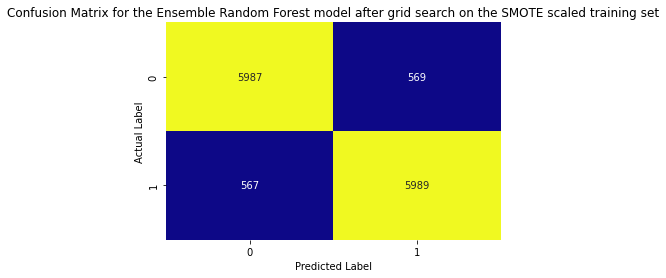

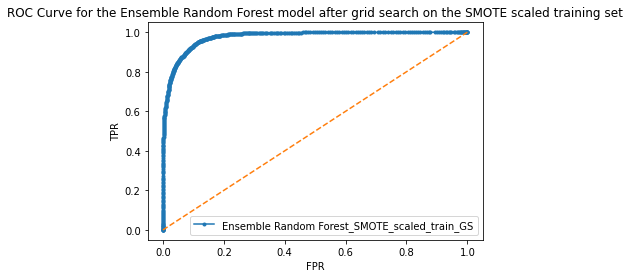



############################################Testing Set################################################ 

Classification report for the Ensemble Random Forest model after grid search on the SMOTE scaled testing set is 
               precision    recall  f1-score   support

           0       0.96      0.91      0.93      2808
           1       0.64      0.80      0.71       570

    accuracy                           0.89      3378
   macro avg       0.80      0.85      0.82      3378
weighted avg       0.90      0.89      0.89      3378



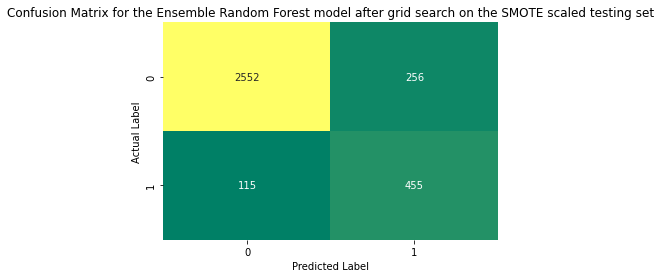

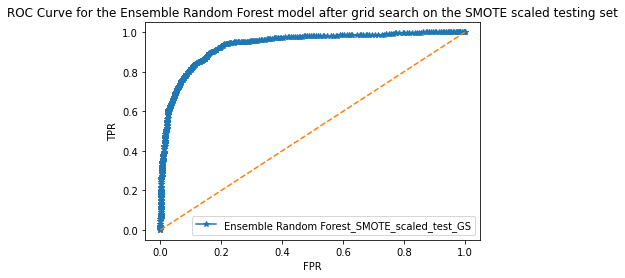

In [ ]:
perf_met_df_scaled_rf_smote_gs, best_model_scaled_rf_smote_gs = model_func(clfRF, param_grid_RF, X_scaled_train_smote, X_scaled_test_smote, y_scaled_train_smote, y_scaled_test_smote, 'SMOTE_Scaled')

### **Bagging Classifier**

#### Unscaled Data

--------------------Best Model Params--------------------
{'base_estimator__bootstrap': True, 'base_estimator__ccp_alpha': 0.0, 'base_estimator__class_weight': None, 'base_estimator__criterion': 'gini', 'base_estimator__max_depth': None, 'base_estimator__max_features': 'auto', 'base_estimator__max_leaf_nodes': None, 'base_estimator__max_samples': None, 'base_estimator__min_impurity_decrease': 0.0, 'base_estimator__min_samples_leaf': 1, 'base_estimator__min_samples_split': 2, 'base_estimator__min_weight_fraction_leaf': 0.0, 'base_estimator__n_estimators': 100, 'base_estimator__n_jobs': None, 'base_estimator__oob_score': False, 'base_estimator__random_state': None, 'base_estimator__verbose': 0, 'base_estimator__warm_start': False, 'base_estimator': RandomForestClassifier(), 'bootstrap': True, 'bootstrap_features': False, 'max_features': 1.0, 'max_samples': 1.0, 'n_estimators': 10, 'n_jobs': None, 'oob_score': False, 'random_state': 1, 'verbose': 0, 'warm_start': False}


Classification r

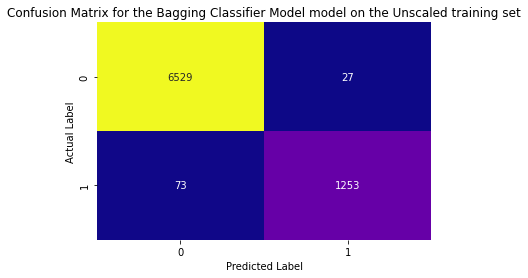

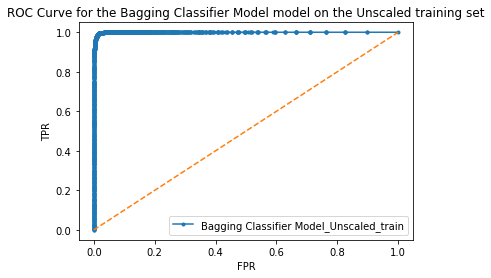



############################################Testing Set################################################ 

Classification report for the Bagging Classifier Model model on the Unscaled testing set is 
               precision    recall  f1-score   support

           0       0.97      0.99      0.98      2808
           1       0.92      0.82      0.87       570

    accuracy                           0.96      3378
   macro avg       0.94      0.91      0.92      3378
weighted avg       0.96      0.96      0.96      3378



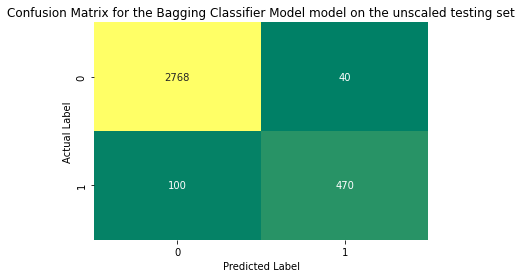

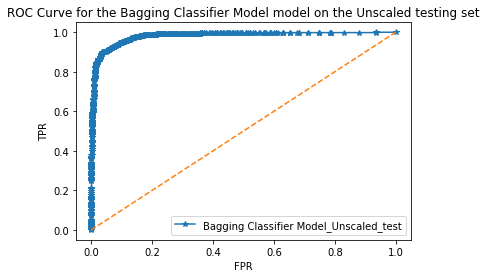

In [ ]:
perf_met_df_unscaled_bgcl, best_model_unscaled_bgcl = model_func(clfBGCL, None, X_train, X_test, y_train, y_test, 'Unscaled')

#### Scaled Data

--------------------Best Model Params--------------------
{'base_estimator__bootstrap': True, 'base_estimator__ccp_alpha': 0.0, 'base_estimator__class_weight': None, 'base_estimator__criterion': 'gini', 'base_estimator__max_depth': None, 'base_estimator__max_features': 'auto', 'base_estimator__max_leaf_nodes': None, 'base_estimator__max_samples': None, 'base_estimator__min_impurity_decrease': 0.0, 'base_estimator__min_samples_leaf': 1, 'base_estimator__min_samples_split': 2, 'base_estimator__min_weight_fraction_leaf': 0.0, 'base_estimator__n_estimators': 100, 'base_estimator__n_jobs': None, 'base_estimator__oob_score': False, 'base_estimator__random_state': None, 'base_estimator__verbose': 0, 'base_estimator__warm_start': False, 'base_estimator': RandomForestClassifier(), 'bootstrap': True, 'bootstrap_features': False, 'max_features': 1.0, 'max_samples': 1.0, 'n_estimators': 10, 'n_jobs': None, 'oob_score': False, 'random_state': 1, 'verbose': 0, 'warm_start': False}


Classification r

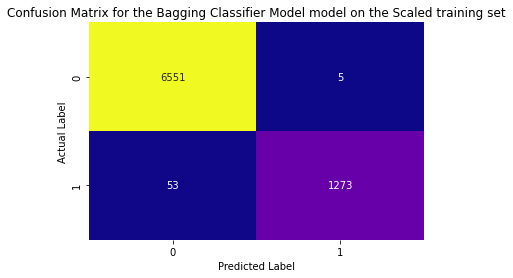

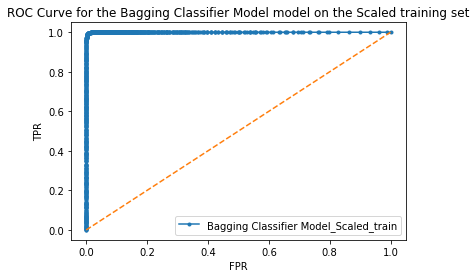



############################################Testing Set################################################ 

Classification report for the Bagging Classifier Model model on the Scaled testing set is 
               precision    recall  f1-score   support

           0       0.95      0.99      0.97      2808
           1       0.94      0.76      0.84       570

    accuracy                           0.95      3378
   macro avg       0.95      0.88      0.91      3378
weighted avg       0.95      0.95      0.95      3378



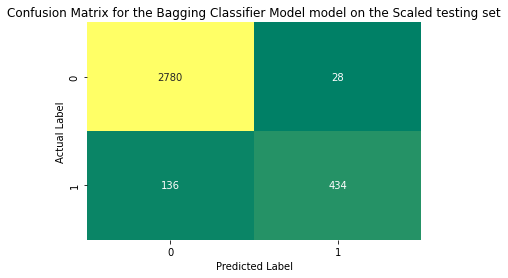

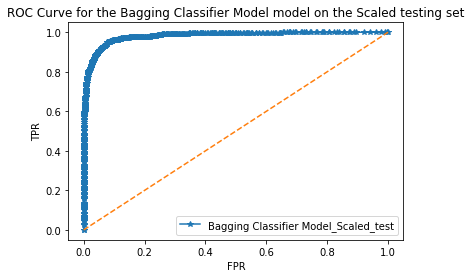

In [ ]:
perf_met_df_scaled_bgcl, best_model_scaled_bgcl = model_func(clfBGCL, None, X_scaled_train, X_scaled_test, y_scaled_train, y_scaled_test, 'Scaled')

#### Unscaled SMOTE Data

--------------------Best Model Params--------------------
{'base_estimator__bootstrap': True, 'base_estimator__ccp_alpha': 0.0, 'base_estimator__class_weight': None, 'base_estimator__criterion': 'gini', 'base_estimator__max_depth': None, 'base_estimator__max_features': 'auto', 'base_estimator__max_leaf_nodes': None, 'base_estimator__max_samples': None, 'base_estimator__min_impurity_decrease': 0.0, 'base_estimator__min_samples_leaf': 1, 'base_estimator__min_samples_split': 2, 'base_estimator__min_weight_fraction_leaf': 0.0, 'base_estimator__n_estimators': 100, 'base_estimator__n_jobs': None, 'base_estimator__oob_score': False, 'base_estimator__random_state': None, 'base_estimator__verbose': 0, 'base_estimator__warm_start': False, 'base_estimator': RandomForestClassifier(), 'bootstrap': True, 'bootstrap_features': False, 'max_features': 1.0, 'max_samples': 1.0, 'n_estimators': 10, 'n_jobs': None, 'oob_score': False, 'random_state': 1, 'verbose': 0, 'warm_start': False}


Classification r

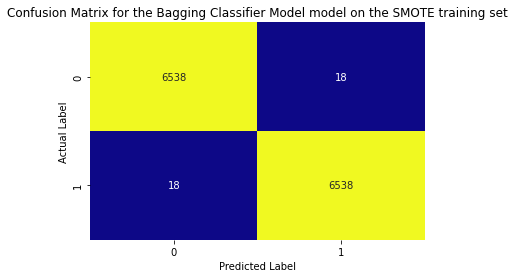

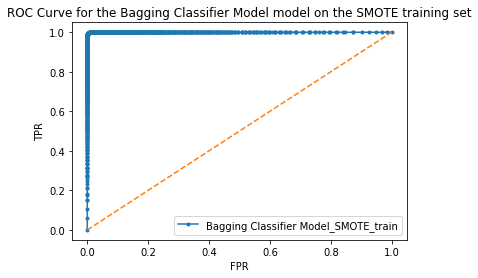



############################################Testing Set################################################ 

Classification report for the Bagging Classifier Model model on the SMOTE testing set is 
               precision    recall  f1-score   support

           0       0.97      0.98      0.97      2808
           1       0.88      0.86      0.87       570

    accuracy                           0.96      3378
   macro avg       0.93      0.92      0.92      3378
weighted avg       0.96      0.96      0.96      3378



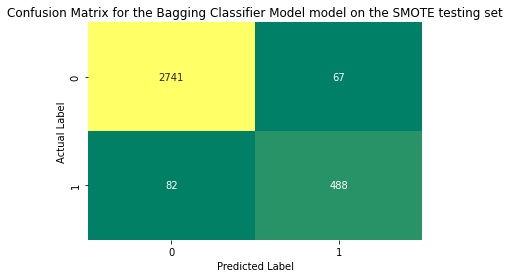

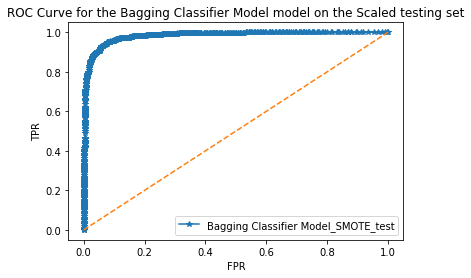

In [ ]:
perf_met_df_unscaled_bgcl_smote, best_model_unscaled_bgcl_smote = model_func(clfBGCL, None, X_train_smote, X_test_smote, y_train_smote, y_test_smote, 'SMOTE')

#### Scaled SMOTE Data 

--------------------Best Model Params--------------------
{'base_estimator__bootstrap': True, 'base_estimator__ccp_alpha': 0.0, 'base_estimator__class_weight': None, 'base_estimator__criterion': 'gini', 'base_estimator__max_depth': None, 'base_estimator__max_features': 'auto', 'base_estimator__max_leaf_nodes': None, 'base_estimator__max_samples': None, 'base_estimator__min_impurity_decrease': 0.0, 'base_estimator__min_samples_leaf': 1, 'base_estimator__min_samples_split': 2, 'base_estimator__min_weight_fraction_leaf': 0.0, 'base_estimator__n_estimators': 100, 'base_estimator__n_jobs': None, 'base_estimator__oob_score': False, 'base_estimator__random_state': None, 'base_estimator__verbose': 0, 'base_estimator__warm_start': False, 'base_estimator': RandomForestClassifier(), 'bootstrap': True, 'bootstrap_features': False, 'max_features': 1.0, 'max_samples': 1.0, 'n_estimators': 10, 'n_jobs': None, 'oob_score': False, 'random_state': 1, 'verbose': 0, 'warm_start': False}


Classification r

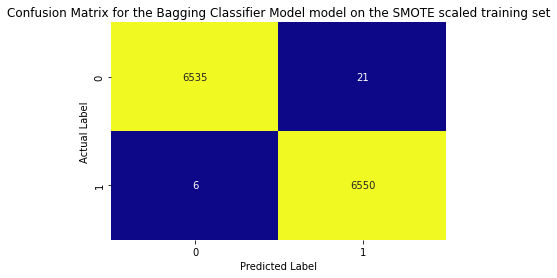

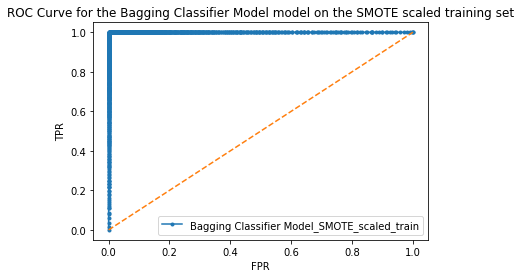



############################################Testing Set################################################ 

Classification report for the Bagging Classifier Model model on the SMOTE scaled testing set is 
               precision    recall  f1-score   support

           0       0.98      0.98      0.98      2808
           1       0.88      0.88      0.88       570

    accuracy                           0.96      3378
   macro avg       0.93      0.93      0.93      3378
weighted avg       0.96      0.96      0.96      3378



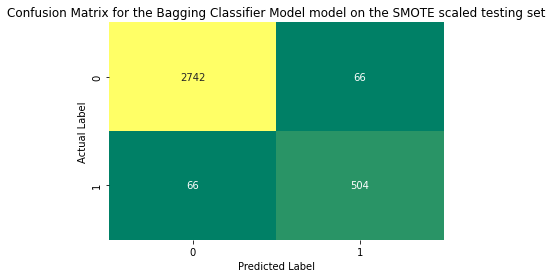

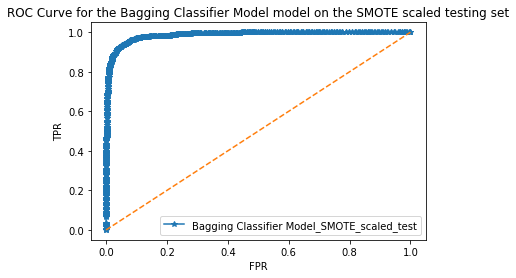

In [ ]:
perf_met_df_scaled_bgcl_smote, best_model_scaled_bgcl_smote = model_func(clfBGCL, None, X_scaled_train_smote, X_scaled_test_smote, y_scaled_train_smote, y_scaled_test_smote, 'SMOTE_Scaled')

#### Unscaled Data - GS

--------------------Best Parameters--------------------
{'base_estimator__max_features': None, 'bootstrap_features': False, 'max_samples': 500}


--------------------Best Model Params--------------------
BaggingClassifier(base_estimator=RandomForestClassifier(max_features=None),
                  max_samples=500, random_state=1)


Classification report for the Bagging Classifier Model model after grid search on the Unscaled training set is 
               precision    recall  f1-score   support

           0       0.92      0.97      0.94      6556
           1       0.78      0.61      0.68      1326

    accuracy                           0.91      7882
   macro avg       0.85      0.79      0.81      7882
weighted avg       0.90      0.91      0.90      7882



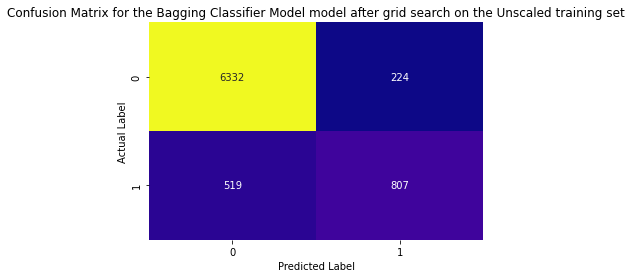

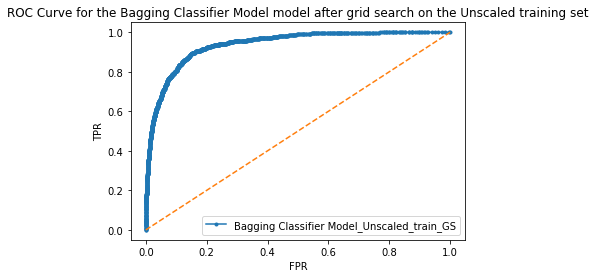



############################################Testing Set################################################ 

Classification report for the Bagging Classifier Model model after grid search on the Unscaled testing set is 
               precision    recall  f1-score   support

           0       0.92      0.96      0.94      2808
           1       0.76      0.59      0.66       570

    accuracy                           0.90      3378
   macro avg       0.84      0.77      0.80      3378
weighted avg       0.89      0.90      0.89      3378



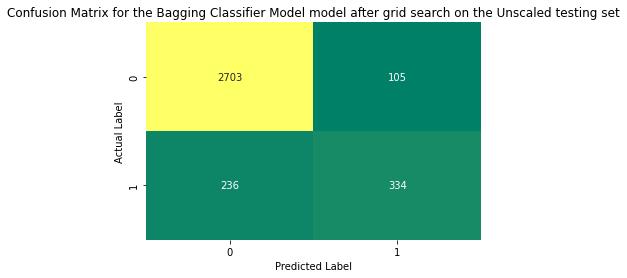

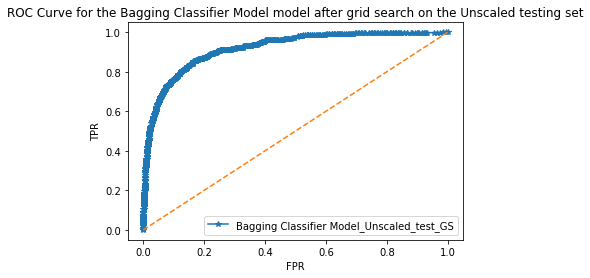

In [ ]:
perf_met_df_unscaled_bgcl_gs, best_model_unscaled_bgcl_gs = model_func(clfBGCL, param_grid_BGCL, X_train, X_test, y_train, y_test, 'Unscaled')

#### Scaled Data - GS

--------------------Best Parameters--------------------
{'base_estimator__max_features': None, 'bootstrap_features': False, 'max_samples': 500}


--------------------Best Model Params--------------------
BaggingClassifier(base_estimator=RandomForestClassifier(max_features=None),
                  max_samples=500, random_state=1)


Classification report for the Bagging Classifier Model model after grid search on the Scaled training set is 
               precision    recall  f1-score   support

           0       0.92      0.96      0.94      6556
           1       0.78      0.60      0.68      1326

    accuracy                           0.90      7882
   macro avg       0.85      0.78      0.81      7882
weighted avg       0.90      0.90      0.90      7882



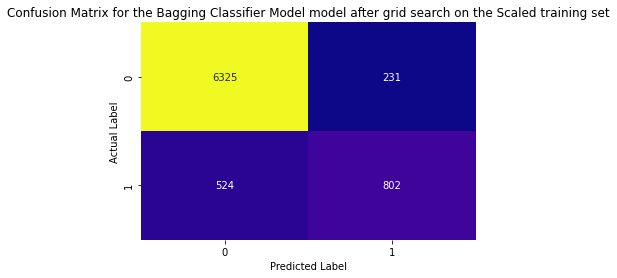

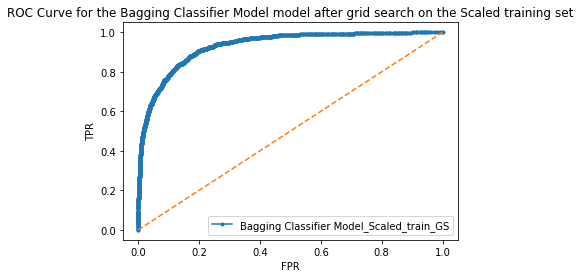



############################################Testing Set################################################ 

Classification report for the Bagging Classifier Model model after grid search on the Scaled testing set is 
               precision    recall  f1-score   support

           0       0.92      0.96      0.94      2808
           1       0.77      0.59      0.67       570

    accuracy                           0.90      3378
   macro avg       0.84      0.78      0.80      3378
weighted avg       0.89      0.90      0.90      3378



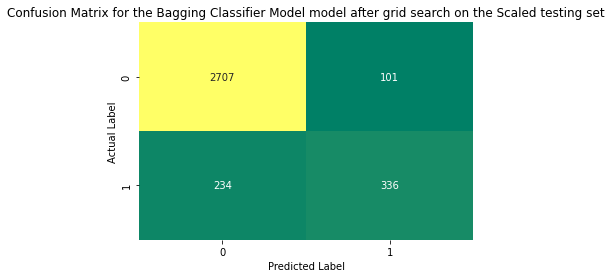

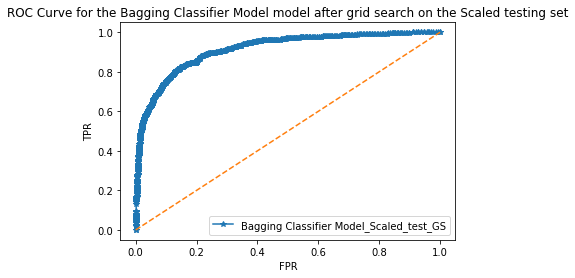

In [ ]:
perf_met_df_scaled_bgcl_gs, best_model_scaled_bgcl_gs = model_func(clfBGCL, param_grid_BGCL, X_scaled_train, X_scaled_test, y_scaled_train, y_scaled_test, 'Scaled')

#### Unscaled SMOTE Data - GS

--------------------Best Parameters--------------------
{'base_estimator__max_features': 'auto', 'bootstrap_features': True, 'max_samples': 500}


--------------------Best Model Params--------------------
BaggingClassifier(base_estimator=RandomForestClassifier(),
                  bootstrap_features=True, max_samples=500, random_state=1)


Classification report for the Bagging Classifier Model model after grid search on the SMOTE training set is 
               precision    recall  f1-score   support

           0       0.90      0.93      0.91      6556
           1       0.93      0.89      0.91      6556

    accuracy                           0.91     13112
   macro avg       0.91      0.91      0.91     13112
weighted avg       0.91      0.91      0.91     13112



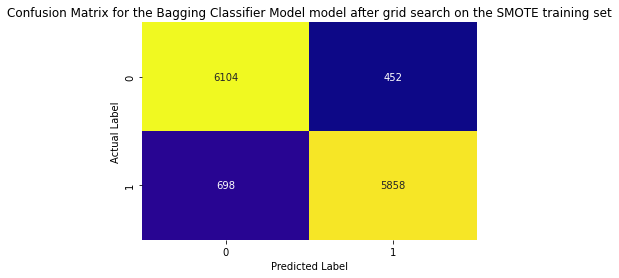

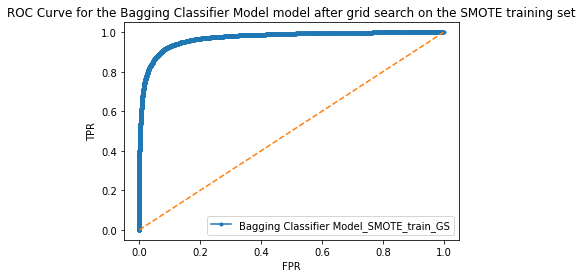



############################################Testing Set################################################ 

Classification report for the Bagging Classifier Model model after grid search on the SMOTE testing set is 
               precision    recall  f1-score   support

           0       0.93      0.93      0.93      2808
           1       0.66      0.65      0.65       570

    accuracy                           0.88      3378
   macro avg       0.79      0.79      0.79      3378
weighted avg       0.88      0.88      0.88      3378



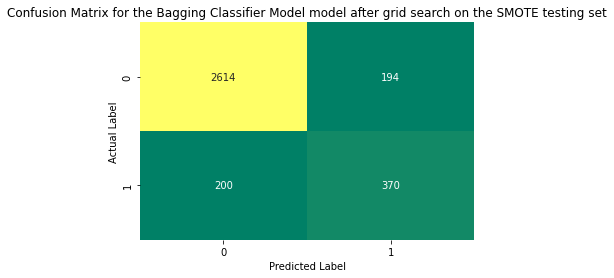

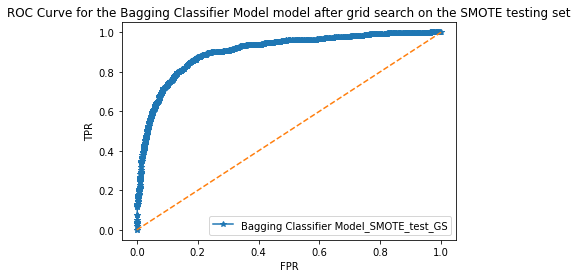

In [ ]:
perf_met_df_unscaled_bgcl_smote_gs, best_model_unscaled_bgcl_smote_gs = model_func(clfBGCL, param_grid_BGCL, X_train_smote, X_test_smote, y_train_smote, y_test_smote, 'SMOTE')

#### Scaled SMOTE Data - GS

--------------------Best Parameters--------------------
{'base_estimator__max_features': 'auto', 'bootstrap_features': True, 'max_samples': 500}


--------------------Best Model Params--------------------
BaggingClassifier(base_estimator=RandomForestClassifier(),
                  bootstrap_features=True, max_samples=500, random_state=1)


Classification report for the Bagging Classifier Model model after grid search on the SMOTE scaled training set is 
               precision    recall  f1-score   support

           0       0.90      0.93      0.91      6556
           1       0.92      0.90      0.91      6556

    accuracy                           0.91     13112
   macro avg       0.91      0.91      0.91     13112
weighted avg       0.91      0.91      0.91     13112



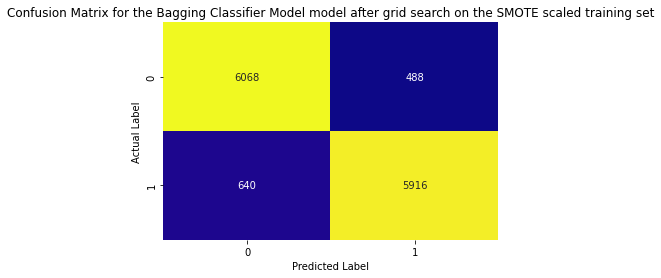

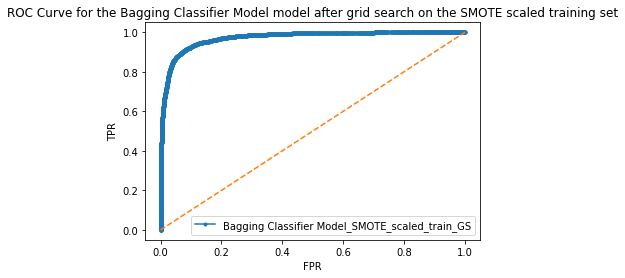



############################################Testing Set################################################ 

Classification report for the Bagging Classifier Model model after grid search on the SMOTE scaled testing set is 
               precision    recall  f1-score   support

           0       0.94      0.92      0.93      2808
           1       0.65      0.73      0.69       570

    accuracy                           0.89      3378
   macro avg       0.80      0.83      0.81      3378
weighted avg       0.89      0.89      0.89      3378



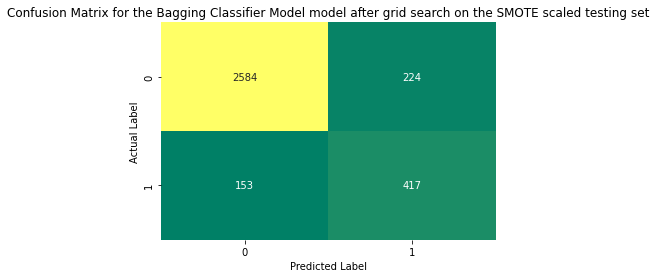

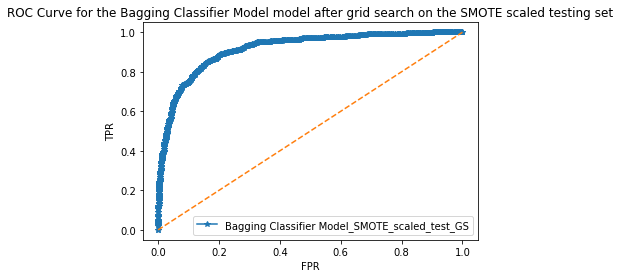

In [ ]:
perf_met_df_scaled_bgcl_smote_gs, best_model_scaled_bgcl_smote_gs = model_func(clfBGCL, param_grid_BGCL, X_scaled_train_smote, X_scaled_test_smote, y_scaled_train_smote, y_scaled_test_smote, 'SMOTE_Scaled')

### **Adaboost Classifier**

#### Unscaled Data

--------------------Best Model Params--------------------
{'algorithm': 'SAMME.R', 'base_estimator': None, 'learning_rate': 1.0, 'n_estimators': 50, 'random_state': 1}


Classification report for the Ada Boost model on the Unscaled training set is 
               precision    recall  f1-score   support

           0       0.92      0.95      0.94      6556
           1       0.72      0.59      0.65      1326

    accuracy                           0.89      7882
   macro avg       0.82      0.77      0.79      7882
weighted avg       0.89      0.89      0.89      7882



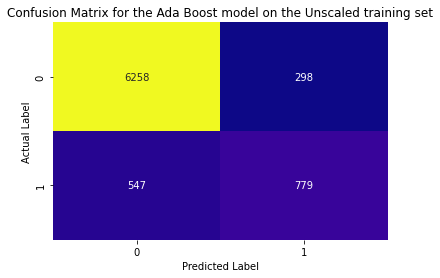

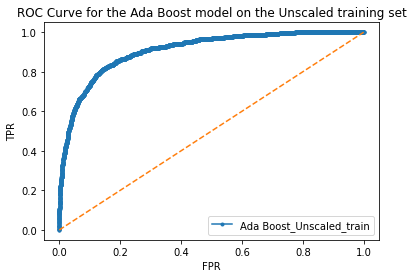



############################################Testing Set################################################ 

Classification report for the Ada Boost model on the Unscaled testing set is 
               precision    recall  f1-score   support

           0       0.92      0.96      0.94      2808
           1       0.74      0.60      0.66       570

    accuracy                           0.90      3378
   macro avg       0.83      0.78      0.80      3378
weighted avg       0.89      0.90      0.89      3378



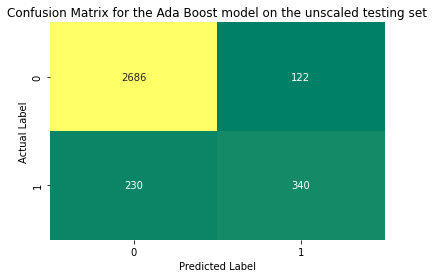

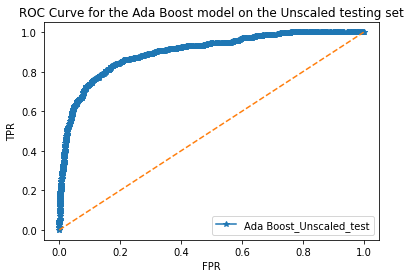

In [ ]:
perf_met_df_unscaled_adb, best_model_unscaled_adb = model_func(clfADB, None, X_train, X_test, y_train, y_test, 'Unscaled')

#### Scaled Data

--------------------Best Model Params--------------------
{'algorithm': 'SAMME.R', 'base_estimator': None, 'learning_rate': 1.0, 'n_estimators': 50, 'random_state': 1}


Classification report for the Ada Boost model on the Scaled training set is 
               precision    recall  f1-score   support

           0       0.92      0.96      0.94      6556
           1       0.73      0.58      0.65      1326

    accuracy                           0.89      7882
   macro avg       0.82      0.77      0.79      7882
weighted avg       0.89      0.89      0.89      7882



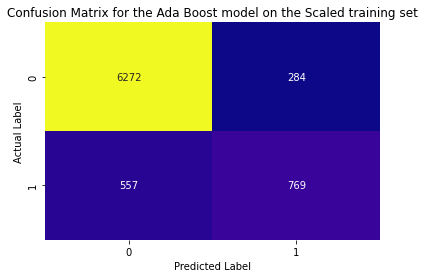

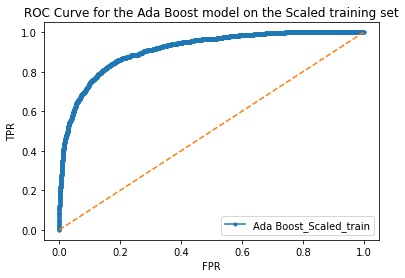



############################################Testing Set################################################ 

Classification report for the Ada Boost model on the Scaled testing set is 
               precision    recall  f1-score   support

           0       0.92      0.96      0.94      2808
           1       0.74      0.59      0.66       570

    accuracy                           0.90      3378
   macro avg       0.83      0.77      0.80      3378
weighted avg       0.89      0.90      0.89      3378



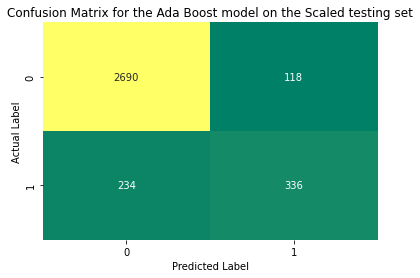

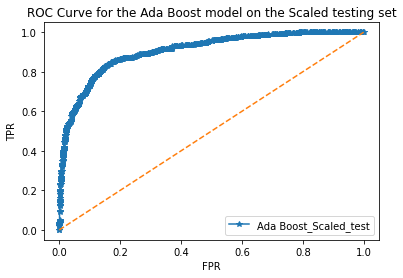

In [ ]:
perf_met_df_scaled_adb, best_model_scaled_adb = model_func(clfADB, None, X_scaled_train, X_scaled_test, y_scaled_train, y_scaled_test, 'Scaled')

#### Unscaled SMOTE Data

--------------------Best Model Params--------------------
{'algorithm': 'SAMME.R', 'base_estimator': None, 'learning_rate': 1.0, 'n_estimators': 50, 'random_state': 1}


Classification report for the Ada Boost model on the SMOTE training set is 
               precision    recall  f1-score   support

           0       0.89      0.89      0.89      6556
           1       0.89      0.89      0.89      6556

    accuracy                           0.89     13112
   macro avg       0.89      0.89      0.89     13112
weighted avg       0.89      0.89      0.89     13112



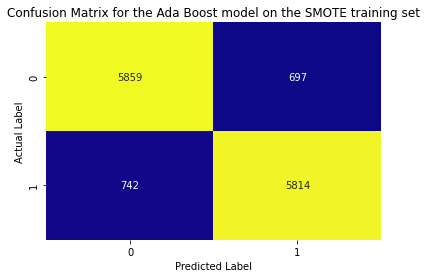

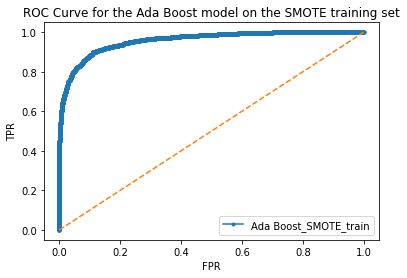



############################################Testing Set################################################ 

Classification report for the Ada Boost model on the SMOTE testing set is 
               precision    recall  f1-score   support

           0       0.94      0.90      0.92      2808
           1       0.60      0.72      0.65       570

    accuracy                           0.87      3378
   macro avg       0.77      0.81      0.79      3378
weighted avg       0.88      0.87      0.88      3378



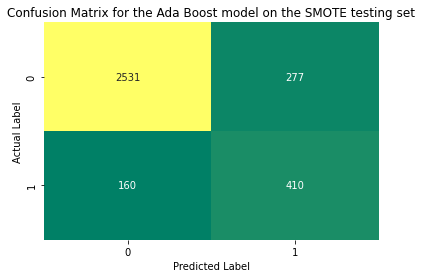

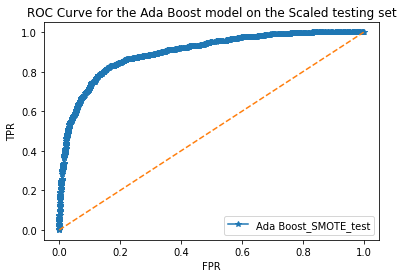

In [ ]:
perf_met_df_unscaled_adb_smote, best_model_unscaled_adb_smote = model_func(clfADB, None, X_train_smote, X_test_smote, y_train_smote, y_test_smote, 'SMOTE')

#### Scaled SMOTE Data 

--------------------Best Model Params--------------------
{'algorithm': 'SAMME.R', 'base_estimator': None, 'learning_rate': 1.0, 'n_estimators': 50, 'random_state': 1}


Classification report for the Ada Boost model on the SMOTE scaled training set is 
               precision    recall  f1-score   support

           0       0.88      0.89      0.88      6556
           1       0.89      0.88      0.88      6556

    accuracy                           0.88     13112
   macro avg       0.88      0.88      0.88     13112
weighted avg       0.88      0.88      0.88     13112



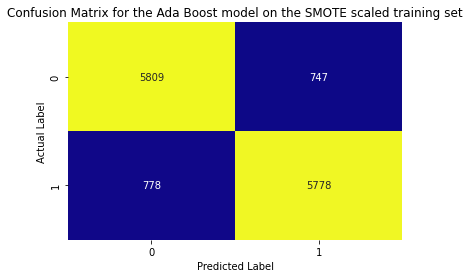

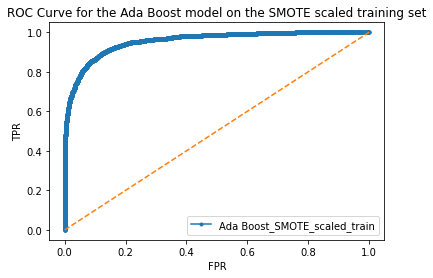



############################################Testing Set################################################ 

Classification report for the Ada Boost model on the SMOTE scaled testing set is 
               precision    recall  f1-score   support

           0       0.95      0.89      0.92      2808
           1       0.59      0.75      0.66       570

    accuracy                           0.87      3378
   macro avg       0.77      0.82      0.79      3378
weighted avg       0.89      0.87      0.87      3378



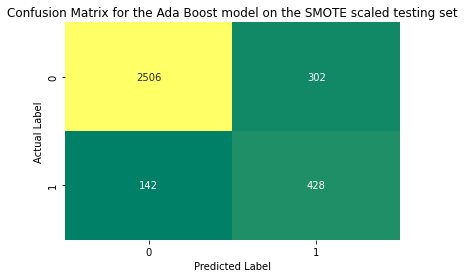

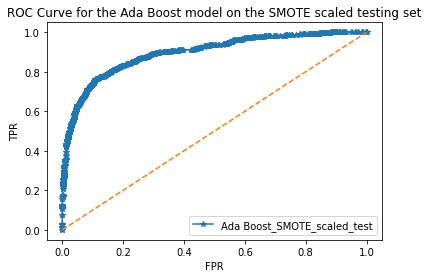

In [ ]:
perf_met_df_scaled_adb_smote, best_model_scaled_adb_smote = model_func(clfADB, None, X_scaled_train_smote, X_scaled_test_smote, y_scaled_train_smote, y_scaled_test_smote, 'SMOTE_Scaled')

#### Unscaled Data - GS

--------------------Best Parameters--------------------
{'algorithm': 'SAMME.R', 'learning_rate': 1.5, 'n_estimators': 50}


--------------------Best Model Params--------------------
AdaBoostClassifier(learning_rate=1.5, random_state=1)


Classification report for the Ada Boost model after grid search on the Unscaled training set is 
               precision    recall  f1-score   support

           0       0.92      0.96      0.94      6556
           1       0.72      0.57      0.64      1326

    accuracy                           0.89      7882
   macro avg       0.82      0.76      0.79      7882
weighted avg       0.88      0.89      0.89      7882



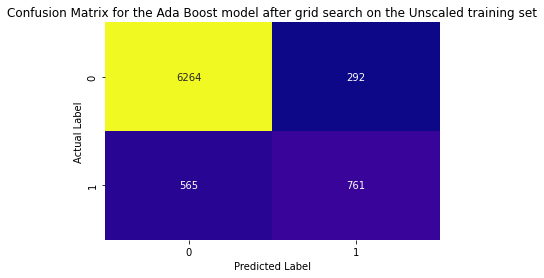

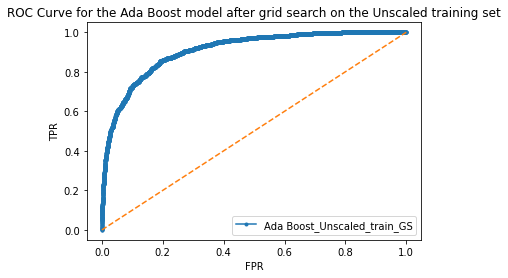



############################################Testing Set################################################ 

Classification report for the Ada Boost model after grid search on the Unscaled testing set is 
               precision    recall  f1-score   support

           0       0.92      0.96      0.94      2808
           1       0.75      0.58      0.65       570

    accuracy                           0.90      3378
   macro avg       0.83      0.77      0.80      3378
weighted avg       0.89      0.90      0.89      3378



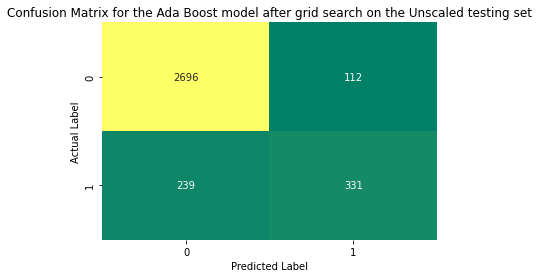

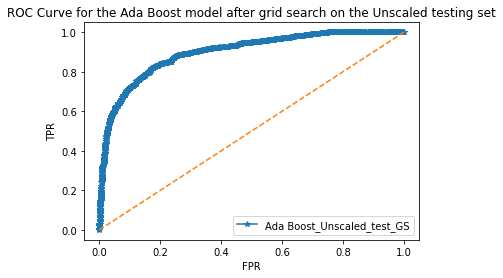

In [ ]:
perf_met_df_unscaled_adb_gs, best_model_unscaled_adb_gs = model_func(clfADB, param_grid_ADB, X_train, X_test, y_train, y_test, 'Unscaled')

#### Scaled Data - GS

--------------------Best Parameters--------------------
{'algorithm': 'SAMME', 'learning_rate': 1.0, 'n_estimators': 150}


--------------------Best Model Params--------------------
AdaBoostClassifier(algorithm='SAMME', n_estimators=150, random_state=1)


Classification report for the Ada Boost model after grid search on the Scaled training set is 
               precision    recall  f1-score   support

           0       0.92      0.96      0.94      6556
           1       0.75      0.57      0.65      1326

    accuracy                           0.90      7882
   macro avg       0.83      0.77      0.79      7882
weighted avg       0.89      0.90      0.89      7882



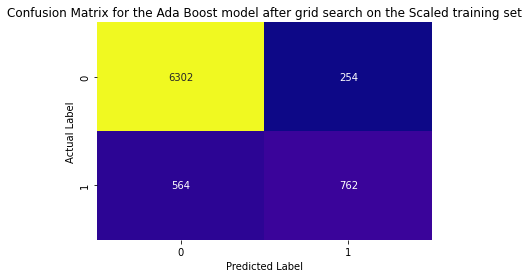

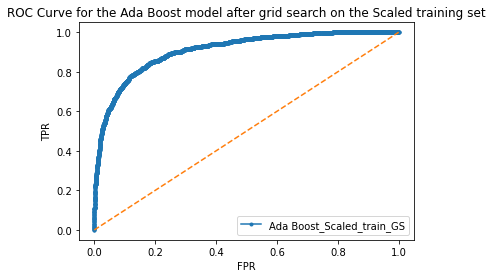



############################################Testing Set################################################ 

Classification report for the Ada Boost model after grid search on the Scaled testing set is 
               precision    recall  f1-score   support

           0       0.92      0.96      0.94      2808
           1       0.76      0.56      0.65       570

    accuracy                           0.90      3378
   macro avg       0.84      0.76      0.79      3378
weighted avg       0.89      0.90      0.89      3378



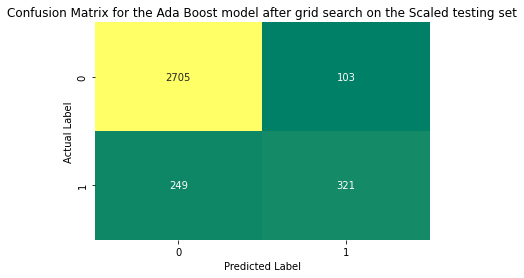

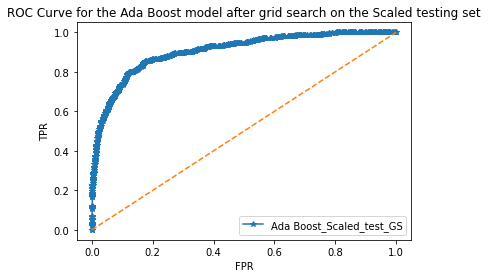

In [ ]:
perf_met_df_scaled_adb_gs, best_model_scaled_adb_gs = model_func(clfADB, param_grid_ADB, X_scaled_train, X_scaled_test, y_scaled_train, y_scaled_test, 'Scaled')

#### Unscaled SMOTE Data - GS

--------------------Best Parameters--------------------
{'algorithm': 'SAMME', 'learning_rate': 1.5, 'n_estimators': 150}


--------------------Best Model Params--------------------
AdaBoostClassifier(algorithm='SAMME', learning_rate=1.5, n_estimators=150,
                   random_state=1)


Classification report for the Ada Boost model after grid search on the SMOTE training set is 
               precision    recall  f1-score   support

           0       0.91      0.91      0.91      6556
           1       0.91      0.91      0.91      6556

    accuracy                           0.91     13112
   macro avg       0.91      0.91      0.91     13112
weighted avg       0.91      0.91      0.91     13112



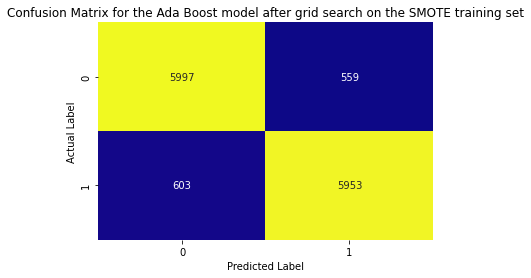

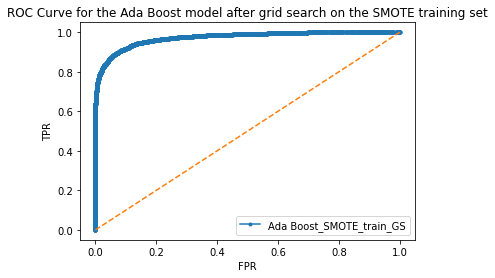



############################################Testing Set################################################ 

Classification report for the Ada Boost model after grid search on the SMOTE testing set is 
               precision    recall  f1-score   support

           0       0.94      0.92      0.93      2808
           1       0.64      0.69      0.67       570

    accuracy                           0.88      3378
   macro avg       0.79      0.81      0.80      3378
weighted avg       0.89      0.88      0.88      3378



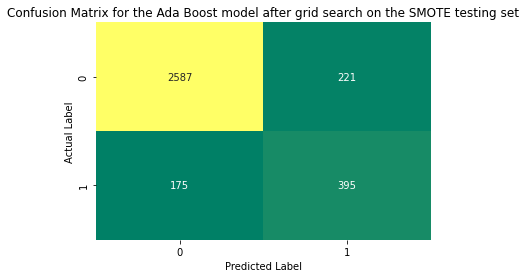

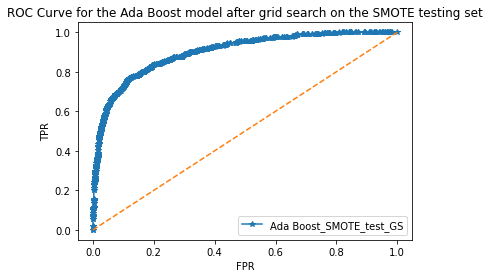

In [ ]:
perf_met_df_unscaled_adb_smote_gs, best_model_unscaled_adb_smote_gs = model_func(clfADB, param_grid_ADB, X_train_smote, X_test_smote, y_train_smote, y_test_smote, 'SMOTE')

#### Scaled SMOTE Data - GS

--------------------Best Parameters--------------------
{'algorithm': 'SAMME.R', 'learning_rate': 1.5, 'n_estimators': 150}


--------------------Best Model Params--------------------
AdaBoostClassifier(learning_rate=1.5, n_estimators=150, random_state=1)


Classification report for the Ada Boost model after grid search on the SMOTE scaled training set is 
               precision    recall  f1-score   support

           0       0.91      0.93      0.92      6556
           1       0.92      0.91      0.92      6556

    accuracy                           0.92     13112
   macro avg       0.92      0.92      0.92     13112
weighted avg       0.92      0.92      0.92     13112



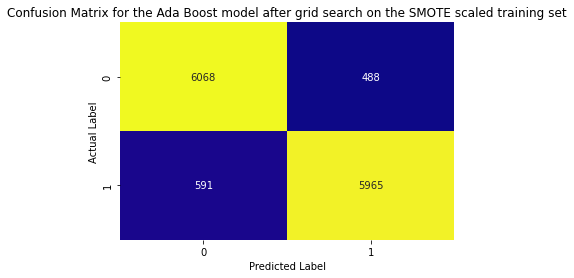

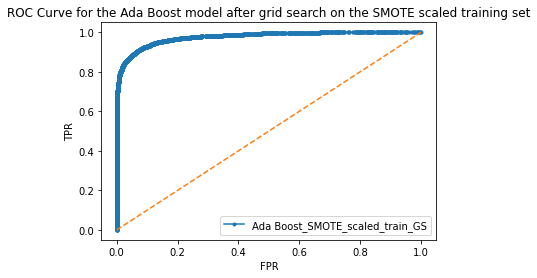



############################################Testing Set################################################ 

Classification report for the Ada Boost model after grid search on the SMOTE scaled testing set is 
               precision    recall  f1-score   support

           0       0.93      0.93      0.93      2808
           1       0.65      0.66      0.65       570

    accuracy                           0.88      3378
   macro avg       0.79      0.79      0.79      3378
weighted avg       0.88      0.88      0.88      3378



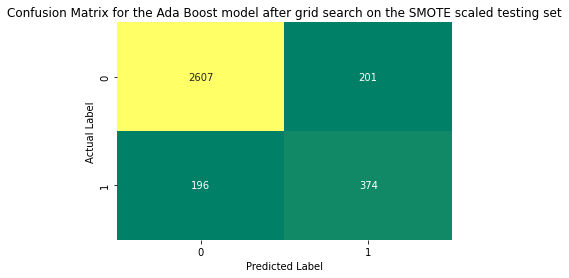

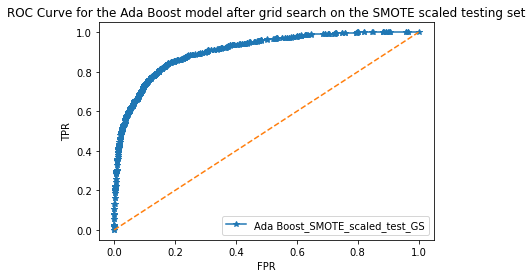

In [ ]:
perf_met_df_scaled_adb_smote_gs, best_model_scaled_adb_smote_gs = model_func(clfADB, param_grid_ADB, X_scaled_train_smote, X_scaled_test_smote, y_scaled_train_smote, y_scaled_test_smote, 'SMOTE_Scaled')

### **Gradient Boosting Classifier**

#### Unscaled Data

--------------------Best Model Params--------------------
{'ccp_alpha': 0.0, 'criterion': 'friedman_mse', 'init': None, 'learning_rate': 0.1, 'loss': 'deviance', 'max_depth': 3, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_iter_no_change': None, 'random_state': 1, 'subsample': 1.0, 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False}


Classification report for the Gradient Boosting model on the Unscaled training set is 
               precision    recall  f1-score   support

           0       0.92      0.97      0.95      6556
           1       0.80      0.61      0.69      1326

    accuracy                           0.91      7882
   macro avg       0.86      0.79      0.82      7882
weighted avg       0.90      0.91      0.90      7882



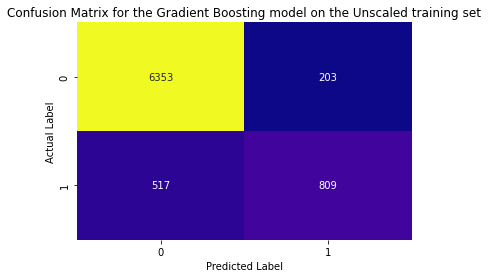

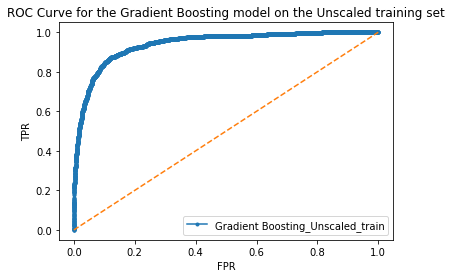



############################################Testing Set################################################ 

Classification report for the Gradient Boosting model on the Unscaled testing set is 
               precision    recall  f1-score   support

           0       0.92      0.96      0.94      2808
           1       0.77      0.60      0.67       570

    accuracy                           0.90      3378
   macro avg       0.85      0.78      0.81      3378
weighted avg       0.90      0.90      0.90      3378



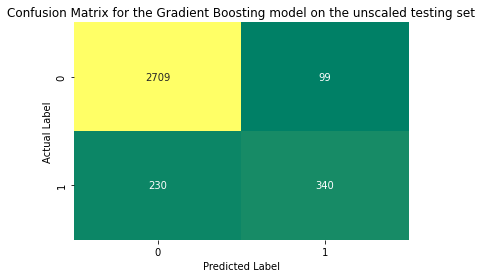

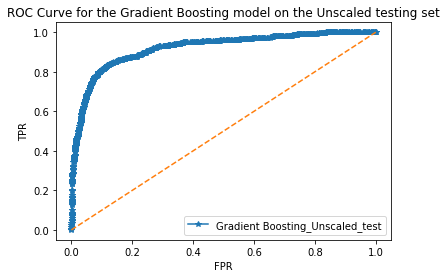

In [ ]:
perf_met_df_unscaled_gbc, best_model_unscaled_gbc = model_func(clfGBC, None, X_train, X_test, y_train, y_test, 'Unscaled')

#### Scaled Data

--------------------Best Model Params--------------------
{'ccp_alpha': 0.0, 'criterion': 'friedman_mse', 'init': None, 'learning_rate': 0.1, 'loss': 'deviance', 'max_depth': 3, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_iter_no_change': None, 'random_state': 1, 'subsample': 1.0, 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False}


Classification report for the Gradient Boosting model on the Scaled training set is 
               precision    recall  f1-score   support

           0       0.93      0.97      0.95      6556
           1       0.81      0.62      0.70      1326

    accuracy                           0.91      7882
   macro avg       0.87      0.79      0.82      7882
weighted avg       0.91      0.91      0.91      7882



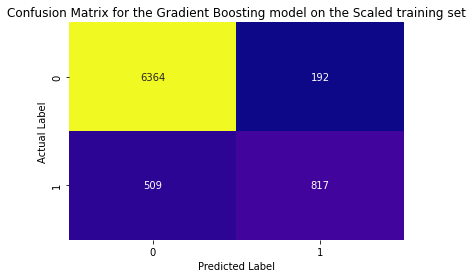

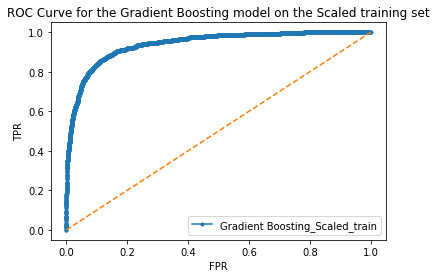



############################################Testing Set################################################ 

Classification report for the Gradient Boosting model on the Scaled testing set is 
               precision    recall  f1-score   support

           0       0.93      0.97      0.95      2808
           1       0.80      0.61      0.69       570

    accuracy                           0.91      3378
   macro avg       0.86      0.79      0.82      3378
weighted avg       0.90      0.91      0.90      3378



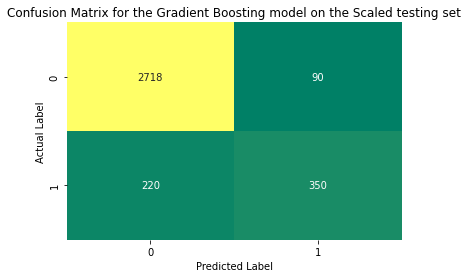

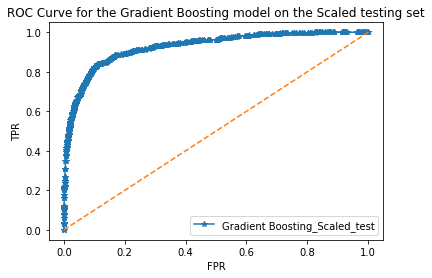

In [ ]:
perf_met_df_scaled_gbc, best_model_scaled_gbc = model_func(clfGBC, None, X_scaled_train, X_scaled_test, y_scaled_train, y_scaled_test, 'Scaled')

#### Unscaled SMOTE Data

--------------------Best Model Params--------------------
{'ccp_alpha': 0.0, 'criterion': 'friedman_mse', 'init': None, 'learning_rate': 0.1, 'loss': 'deviance', 'max_depth': 3, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_iter_no_change': None, 'random_state': 1, 'subsample': 1.0, 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False}


Classification report for the Gradient Boosting model on the SMOTE training set is 
               precision    recall  f1-score   support

           0       0.92      0.94      0.93      6556
           1       0.93      0.92      0.93      6556

    accuracy                           0.93     13112
   macro avg       0.93      0.93      0.93     13112
weighted avg       0.93      0.93      0.93     13112



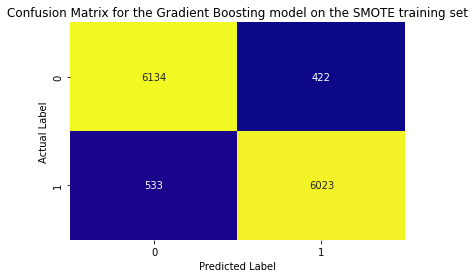

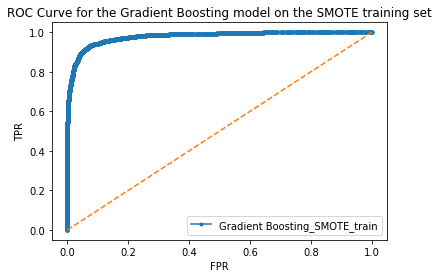



############################################Testing Set################################################ 

Classification report for the Gradient Boosting model on the SMOTE testing set is 
               precision    recall  f1-score   support

           0       0.94      0.94      0.94      2808
           1       0.69      0.71      0.70       570

    accuracy                           0.90      3378
   macro avg       0.82      0.82      0.82      3378
weighted avg       0.90      0.90      0.90      3378



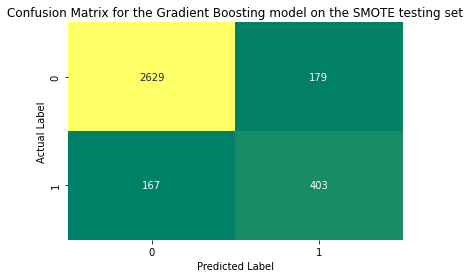

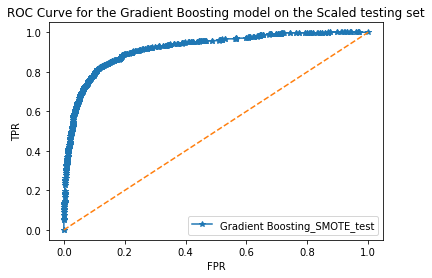

In [ ]:
perf_met_df_unscaled_gbc_smote, best_model_unscaled_gbc_smote = model_func(clfGBC, None, X_train_smote, X_test_smote, y_train_smote, y_test_smote, 'SMOTE')

#### Scaled SMOTE Data 

--------------------Best Model Params--------------------
{'ccp_alpha': 0.0, 'criterion': 'friedman_mse', 'init': None, 'learning_rate': 0.1, 'loss': 'deviance', 'max_depth': 3, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_iter_no_change': None, 'random_state': 1, 'subsample': 1.0, 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False}


Classification report for the Gradient Boosting model on the SMOTE scaled training set is 
               precision    recall  f1-score   support

           0       0.92      0.93      0.93      6556
           1       0.93      0.92      0.93      6556

    accuracy                           0.93     13112
   macro avg       0.93      0.93      0.93     13112
weighted avg       0.93      0.93      0.93     13112



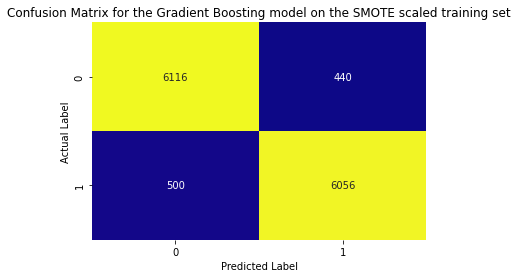

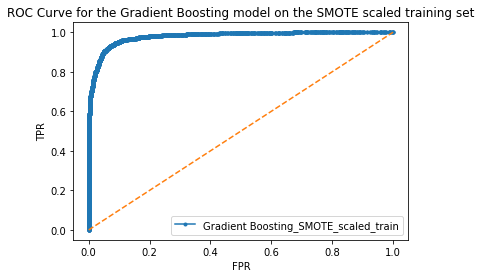



############################################Testing Set################################################ 

Classification report for the Gradient Boosting model on the SMOTE scaled testing set is 
               precision    recall  f1-score   support

           0       0.95      0.93      0.94      2808
           1       0.68      0.74      0.71       570

    accuracy                           0.90      3378
   macro avg       0.82      0.84      0.82      3378
weighted avg       0.90      0.90      0.90      3378



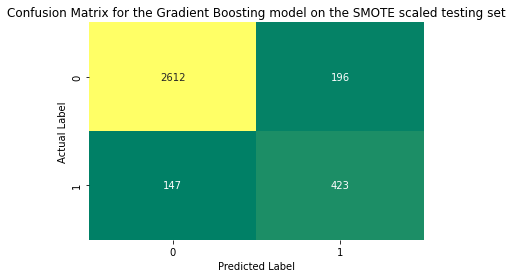

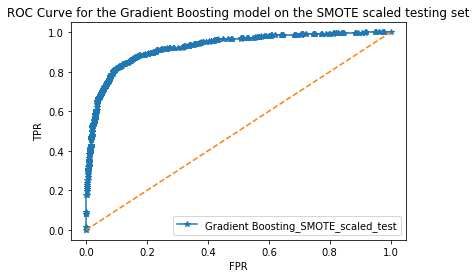

In [ ]:
perf_met_df_scaled_gbc_smote, best_model_scaled_gbc_smote = model_func(clfGBC, None, X_scaled_train_smote, X_scaled_test_smote, y_scaled_train_smote, y_scaled_test_smote, 'SMOTE_Scaled')

#### Unscaled Data - GS

--------------------Best Parameters--------------------
{'loss': 'deviance', 'n_estimators': 200}


--------------------Best Model Params--------------------
GradientBoostingClassifier(n_estimators=200, random_state=1)


Classification report for the Gradient Boosting model after grid search on the Unscaled training set is 
               precision    recall  f1-score   support

           0       0.93      0.97      0.95      6556
           1       0.83      0.67      0.74      1326

    accuracy                           0.92      7882
   macro avg       0.88      0.82      0.85      7882
weighted avg       0.92      0.92      0.92      7882



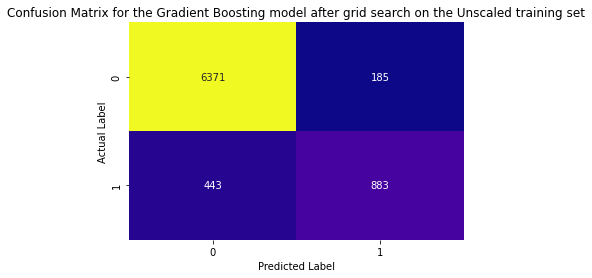

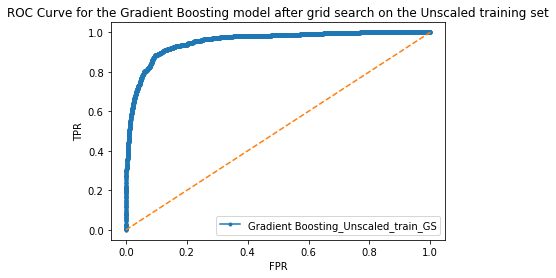



############################################Testing Set################################################ 

Classification report for the Gradient Boosting model after grid search on the Unscaled testing set is 
               precision    recall  f1-score   support

           0       0.93      0.97      0.95      2808
           1       0.79      0.62      0.70       570

    accuracy                           0.91      3378
   macro avg       0.86      0.79      0.82      3378
weighted avg       0.90      0.91      0.90      3378



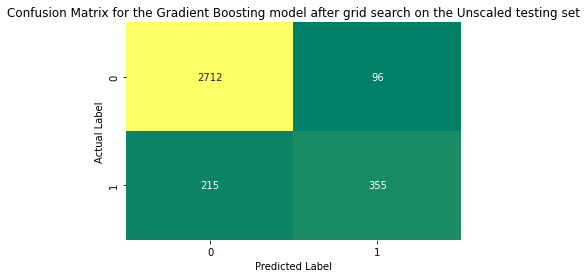

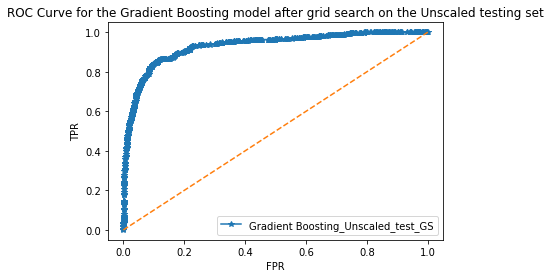

In [ ]:
perf_met_df_unscaled_gbc_gs, best_model_unscaled_gbc_gs = model_func(clfGBC, param_grid_GBC, X_train, X_test, y_train, y_test, 'Unscaled')

#### Scaled Data - GS

--------------------Best Parameters--------------------
{'loss': 'deviance', 'n_estimators': 200}


--------------------Best Model Params--------------------
GradientBoostingClassifier(n_estimators=200, random_state=1)


Classification report for the Gradient Boosting model after grid search on the Scaled training set is 
               precision    recall  f1-score   support

           0       0.94      0.97      0.96      6556
           1       0.84      0.68      0.75      1326

    accuracy                           0.92      7882
   macro avg       0.89      0.83      0.85      7882
weighted avg       0.92      0.92      0.92      7882



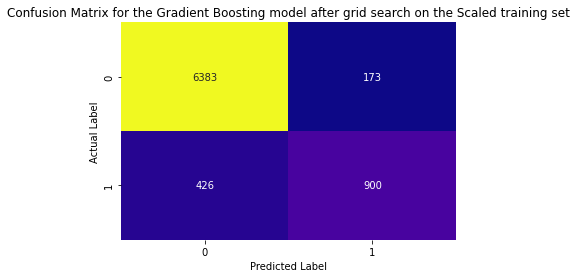

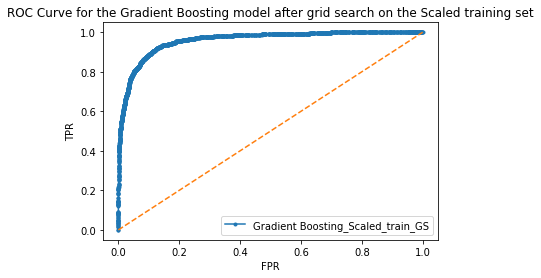



############################################Testing Set################################################ 

Classification report for the Gradient Boosting model after grid search on the Scaled testing set is 
               precision    recall  f1-score   support

           0       0.93      0.97      0.95      2808
           1       0.80      0.64      0.71       570

    accuracy                           0.91      3378
   macro avg       0.86      0.80      0.83      3378
weighted avg       0.91      0.91      0.91      3378



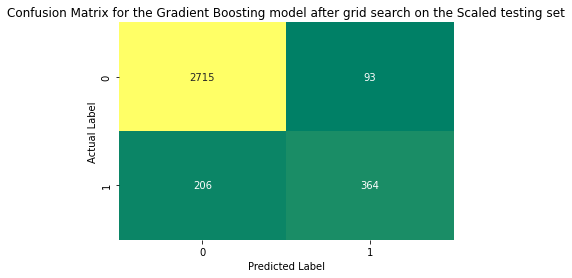

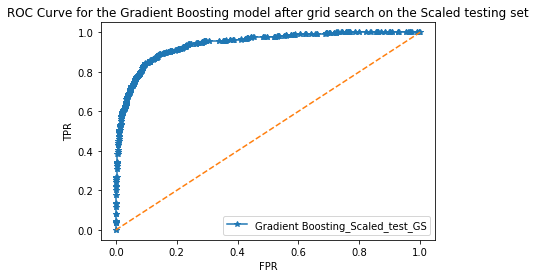

In [ ]:
perf_met_df_scaled_gbc_gs, best_model_scaled_gbc_gs = model_func(clfGBC, param_grid_GBC, X_scaled_train, X_scaled_test, y_scaled_train, y_scaled_test, 'Scaled')

#### Unscaled SMOTE Data - GS

--------------------Best Parameters--------------------
{'loss': 'exponential', 'n_estimators': 200}


--------------------Best Model Params--------------------
GradientBoostingClassifier(loss='exponential', n_estimators=200, random_state=1)


Classification report for the Gradient Boosting model after grid search on the SMOTE training set is 
               precision    recall  f1-score   support

           0       0.94      0.95      0.94      6556
           1       0.95      0.93      0.94      6556

    accuracy                           0.94     13112
   macro avg       0.94      0.94      0.94     13112
weighted avg       0.94      0.94      0.94     13112



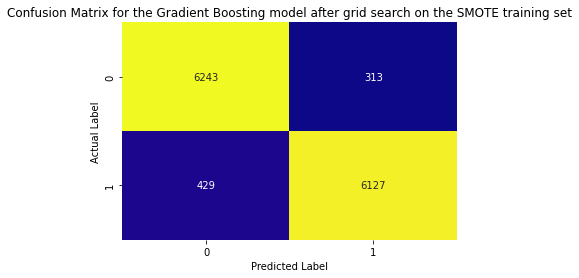

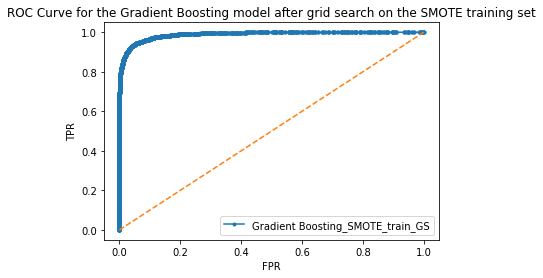



############################################Testing Set################################################ 

Classification report for the Gradient Boosting model after grid search on the SMOTE testing set is 
               precision    recall  f1-score   support

           0       0.94      0.95      0.94      2808
           1       0.74      0.69      0.72       570

    accuracy                           0.91      3378
   macro avg       0.84      0.82      0.83      3378
weighted avg       0.91      0.91      0.91      3378



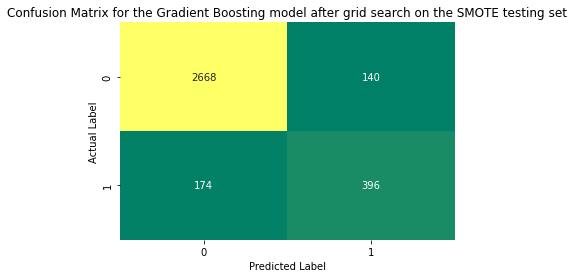

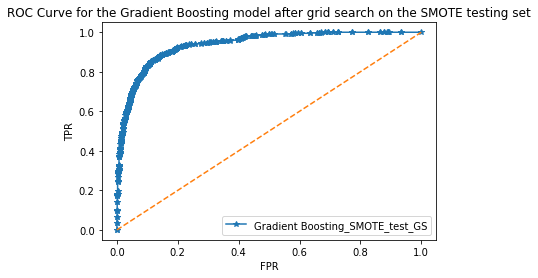

In [ ]:
perf_met_df_unscaled_gbc_smote_gs, best_model_unscaled_gbc_smote_gs = model_func(clfGBC, param_grid_GBC, X_train_smote, X_test_smote, y_train_smote, y_test_smote, 'SMOTE')

#### Scaled SMOTE Data - GS

--------------------Best Parameters--------------------
{'loss': 'exponential', 'n_estimators': 200}


--------------------Best Model Params--------------------
GradientBoostingClassifier(loss='exponential', n_estimators=200, random_state=1)


Classification report for the Gradient Boosting model after grid search on the SMOTE scaled training set is 
               precision    recall  f1-score   support

           0       0.94      0.95      0.95      6556
           1       0.95      0.94      0.95      6556

    accuracy                           0.95     13112
   macro avg       0.95      0.95      0.95     13112
weighted avg       0.95      0.95      0.95     13112



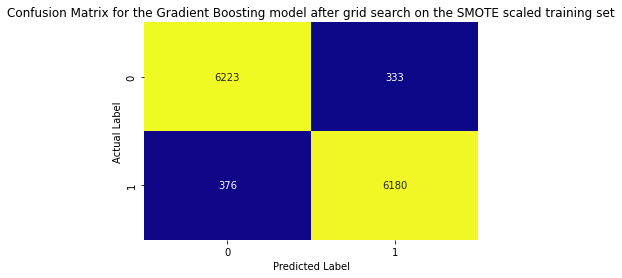

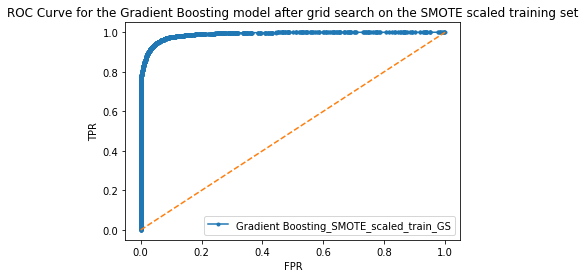



############################################Testing Set################################################ 

Classification report for the Gradient Boosting model after grid search on the SMOTE scaled testing set is 
               precision    recall  f1-score   support

           0       0.94      0.95      0.95      2808
           1       0.74      0.72      0.73       570

    accuracy                           0.91      3378
   macro avg       0.84      0.84      0.84      3378
weighted avg       0.91      0.91      0.91      3378



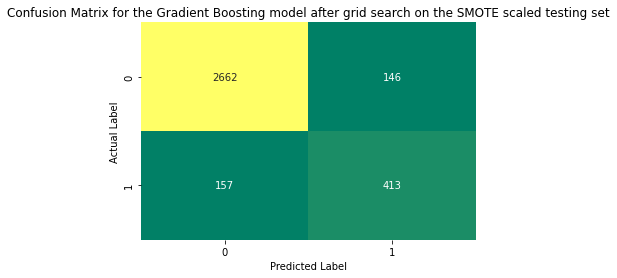

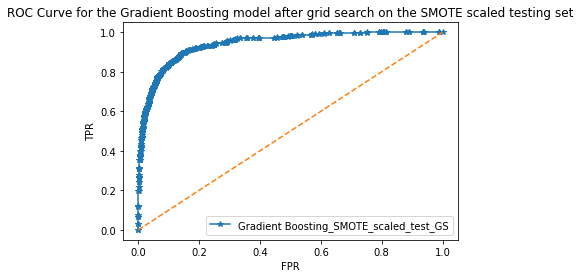

In [ ]:
perf_met_df_scaled_gbc_smote_gs, best_model_scaled_gbc_smote_gs = model_func(clfGBC, param_grid_GBC, X_scaled_train_smote, X_scaled_test_smote, y_scaled_train_smote, y_scaled_test_smote, 'SMOTE_Scaled')

### **Support Vector Classifier**

#### Unscaled Data

--------------------Best Model Params--------------------
{'C': 1.0, 'break_ties': False, 'cache_size': 200, 'class_weight': None, 'coef0': 0.0, 'decision_function_shape': 'ovr', 'degree': 3, 'gamma': 'scale', 'kernel': 'rbf', 'max_iter': -1, 'probability': True, 'random_state': None, 'shrinking': True, 'tol': 0.001, 'verbose': False}


Classification report for the Support Vector Machine model on the Unscaled training set is 
               precision    recall  f1-score   support

           0       0.89      0.97      0.93      6556
           1       0.76      0.41      0.53      1326

    accuracy                           0.88      7882
   macro avg       0.83      0.69      0.73      7882
weighted avg       0.87      0.88      0.86      7882



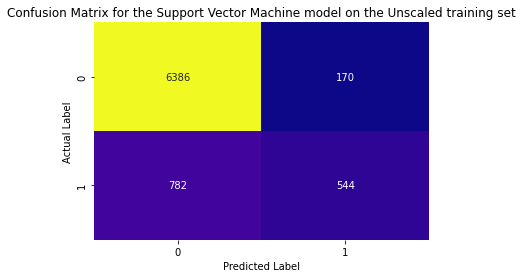

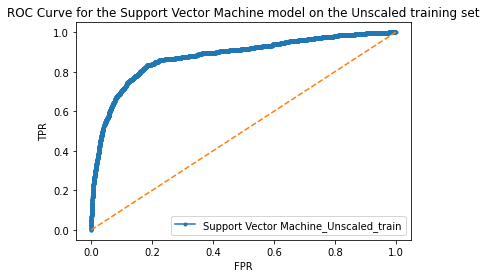



############################################Testing Set################################################ 

Classification report for the Support Vector Machine model on the Unscaled testing set is 
               precision    recall  f1-score   support

           0       0.89      0.98      0.93      2808
           1       0.80      0.43      0.56       570

    accuracy                           0.89      3378
   macro avg       0.85      0.71      0.75      3378
weighted avg       0.88      0.89      0.87      3378



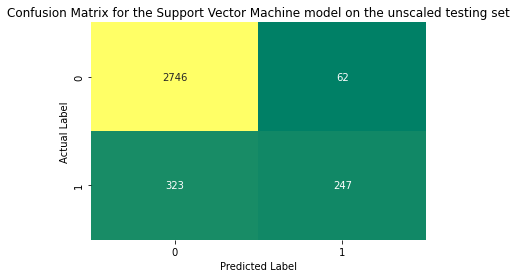

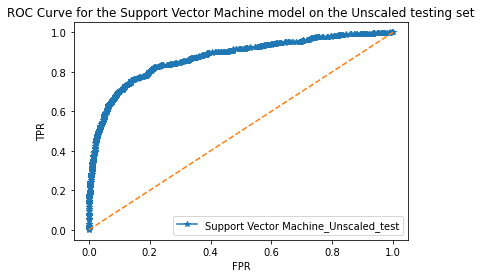

In [ ]:
perf_met_df_unscaled_svc, best_model_unscaled_svc = model_func(clfSVC, None, X_train, X_test, y_train, y_test, 'Unscaled')

#### Scaled Data

--------------------Best Model Params--------------------
{'C': 1.0, 'break_ties': False, 'cache_size': 200, 'class_weight': None, 'coef0': 0.0, 'decision_function_shape': 'ovr', 'degree': 3, 'gamma': 'scale', 'kernel': 'rbf', 'max_iter': -1, 'probability': True, 'random_state': None, 'shrinking': True, 'tol': 0.001, 'verbose': False}


Classification report for the Support Vector Machine model on the Scaled training set is 
               precision    recall  f1-score   support

           0       0.92      0.98      0.95      6556
           1       0.88      0.57      0.69      1326

    accuracy                           0.92      7882
   macro avg       0.90      0.78      0.82      7882
weighted avg       0.91      0.92      0.91      7882



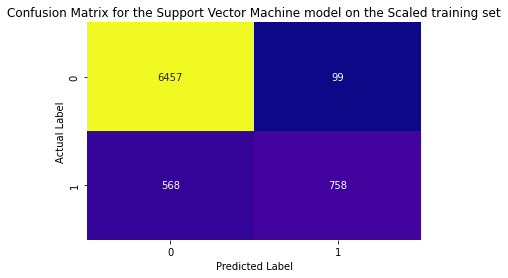

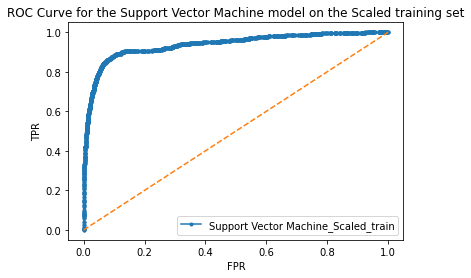



############################################Testing Set################################################ 

Classification report for the Support Vector Machine model on the Scaled testing set is 
               precision    recall  f1-score   support

           0       0.91      0.98      0.95      2808
           1       0.86      0.54      0.66       570

    accuracy                           0.91      3378
   macro avg       0.88      0.76      0.80      3378
weighted avg       0.90      0.91      0.90      3378



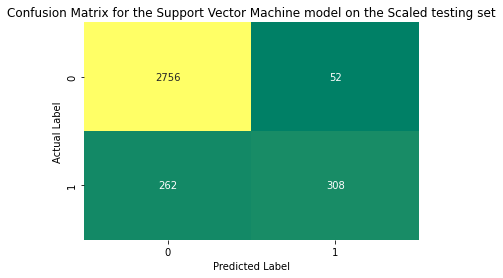

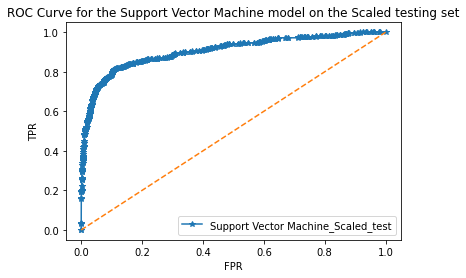

In [ ]:
perf_met_df_scaled_svc, best_model_scaled_svc = model_func(clfSVC, None, X_scaled_train, X_scaled_test, y_scaled_train, y_scaled_test, 'Scaled')

#### Unscaled SMOTE Data

--------------------Best Model Params--------------------
{'C': 1.0, 'break_ties': False, 'cache_size': 200, 'class_weight': None, 'coef0': 0.0, 'decision_function_shape': 'ovr', 'degree': 3, 'gamma': 'scale', 'kernel': 'rbf', 'max_iter': -1, 'probability': True, 'random_state': None, 'shrinking': True, 'tol': 0.001, 'verbose': False}


Classification report for the Support Vector Machine model on the SMOTE training set is 
               precision    recall  f1-score   support

           0       0.82      0.81      0.82      6556
           1       0.81      0.82      0.82      6556

    accuracy                           0.82     13112
   macro avg       0.82      0.82      0.82     13112
weighted avg       0.82      0.82      0.82     13112



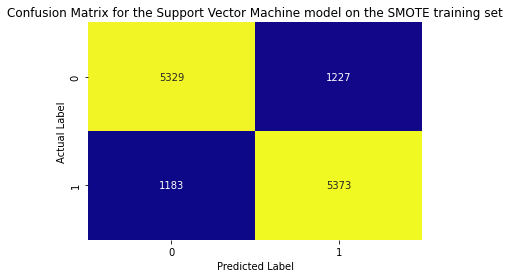

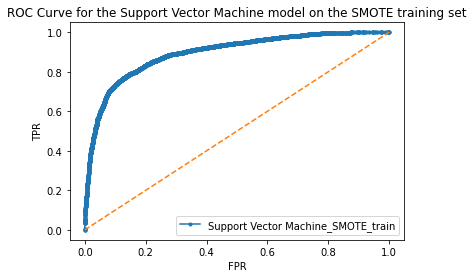



############################################Testing Set################################################ 

Classification report for the Support Vector Machine model on the SMOTE testing set is 
               precision    recall  f1-score   support

           0       0.95      0.82      0.88      2808
           1       0.47      0.79      0.59       570

    accuracy                           0.81      3378
   macro avg       0.71      0.81      0.73      3378
weighted avg       0.87      0.81      0.83      3378



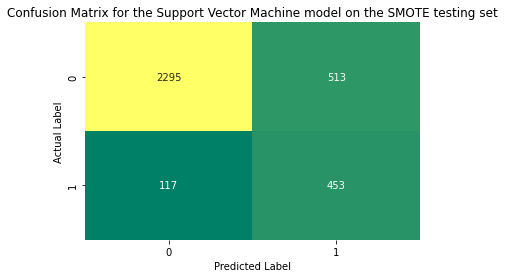

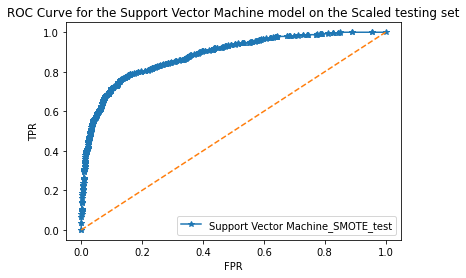

In [ ]:
perf_met_df_unscaled_svc_smote, best_model_unscaled_svc_smote = model_func(clfSVC, None, X_train_smote, X_test_smote, y_train_smote, y_test_smote, 'SMOTE')

#### Scaled SMOTE Data 

--------------------Best Model Params--------------------
{'C': 1.0, 'break_ties': False, 'cache_size': 200, 'class_weight': None, 'coef0': 0.0, 'decision_function_shape': 'ovr', 'degree': 3, 'gamma': 'scale', 'kernel': 'rbf', 'max_iter': -1, 'probability': True, 'random_state': None, 'shrinking': True, 'tol': 0.001, 'verbose': False}


Classification report for the Support Vector Machine model on the SMOTE scaled training set is 
               precision    recall  f1-score   support

           0       0.97      0.92      0.94      6556
           1       0.92      0.97      0.95      6556

    accuracy                           0.95     13112
   macro avg       0.95      0.95      0.95     13112
weighted avg       0.95      0.95      0.95     13112



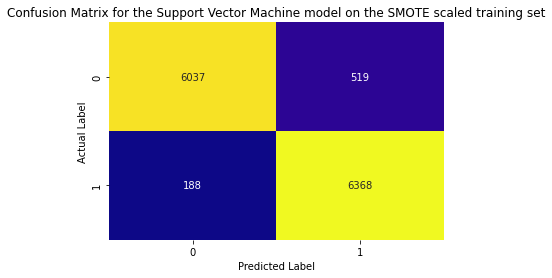

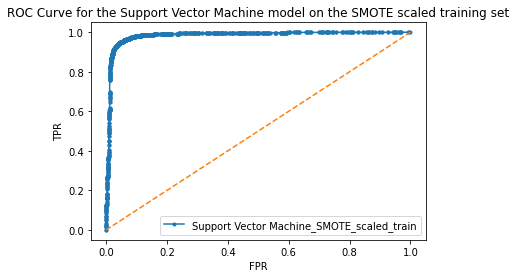



############################################Testing Set################################################ 

Classification report for the Support Vector Machine model on the SMOTE scaled testing set is 
               precision    recall  f1-score   support

           0       0.98      0.91      0.94      2808
           1       0.67      0.90      0.77       570

    accuracy                           0.91      3378
   macro avg       0.82      0.90      0.85      3378
weighted avg       0.93      0.91      0.91      3378



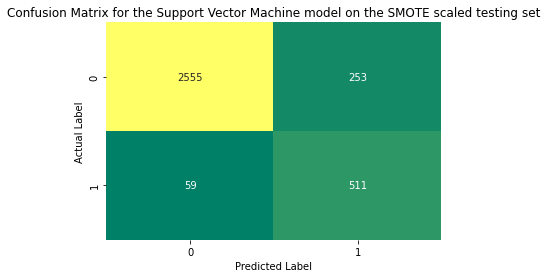

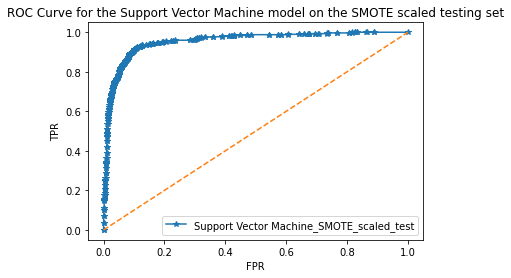

In [ ]:
perf_met_df_scaled_svc_smote, best_model_scaled_svc_smote = model_func(clfSVC, None, X_scaled_train_smote, X_scaled_test_smote, y_scaled_train_smote, y_scaled_test_smote, 'SMOTE_Scaled')

#### Unscaled Data - GS

--------------------Best Parameters--------------------
{'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}


--------------------Best Model Params--------------------
SVC(C=10, gamma=0.1, probability=True)


Classification report for the Support Vector Machine model after grid search on the Unscaled training set is 
               precision    recall  f1-score   support

           0       0.99      0.99      0.99      6556
           1       0.93      0.93      0.93      1326

    accuracy                           0.98      7882
   macro avg       0.96      0.96      0.96      7882
weighted avg       0.98      0.98      0.98      7882



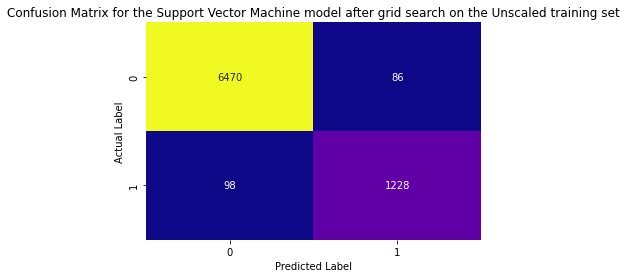

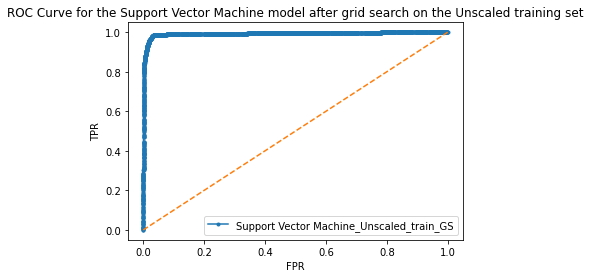



############################################Testing Set################################################ 

Classification report for the Support Vector Machine model after grid search on the Unscaled testing set is 
               precision    recall  f1-score   support

           0       0.96      0.98      0.97      2808
           1       0.87      0.81      0.84       570

    accuracy                           0.95      3378
   macro avg       0.92      0.89      0.90      3378
weighted avg       0.95      0.95      0.95      3378



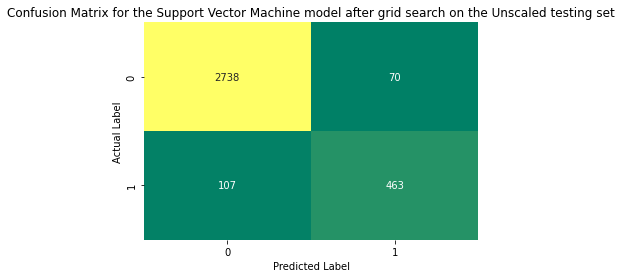

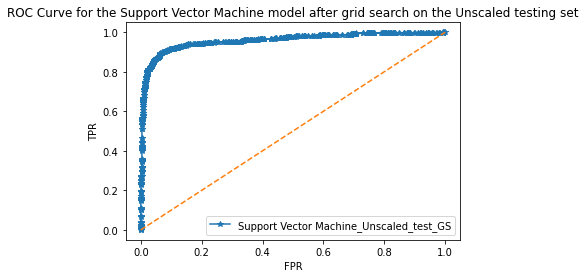

In [ ]:
perf_met_df_unscaled_svc_gs, best_model_unscaled_svc_gs = model_func(clfSVC, param_grid_SVC, X_train, X_test, y_train, y_test, 'Unscaled')

#### Scaled Data - GS

--------------------Best Parameters--------------------
{'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}


--------------------Best Model Params--------------------
SVC(C=10, gamma=0.1, probability=True)


Classification report for the Support Vector Machine model after grid search on the Scaled training set is 
               precision    recall  f1-score   support

           0       0.97      0.99      0.98      6556
           1       0.94      0.83      0.88      1326

    accuracy                           0.96      7882
   macro avg       0.95      0.91      0.93      7882
weighted avg       0.96      0.96      0.96      7882



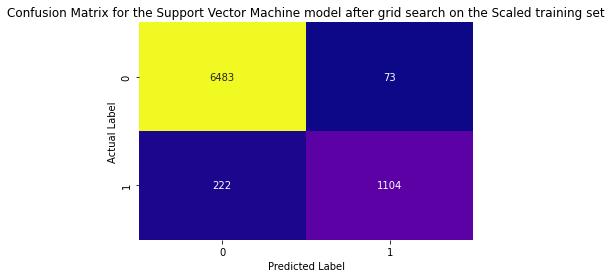

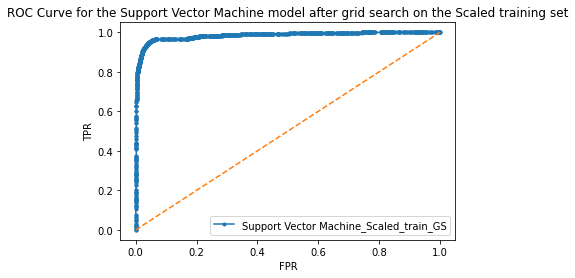



############################################Testing Set################################################ 

Classification report for the Support Vector Machine model after grid search on the Scaled testing set is 
               precision    recall  f1-score   support

           0       0.95      0.98      0.96      2808
           1       0.87      0.74      0.80       570

    accuracy                           0.94      3378
   macro avg       0.91      0.86      0.88      3378
weighted avg       0.94      0.94      0.94      3378



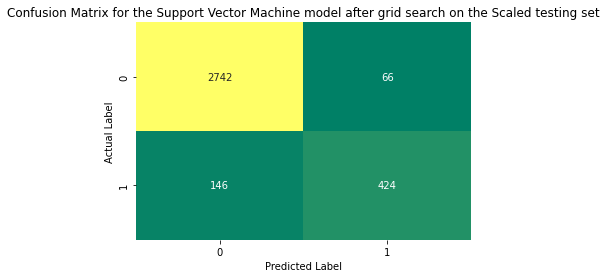

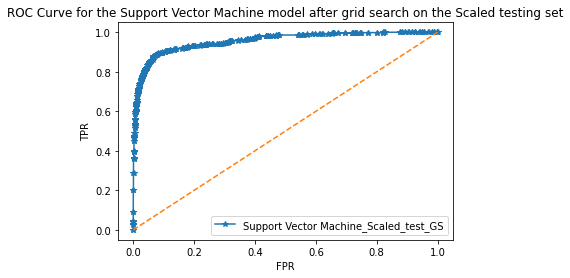

In [ ]:
perf_met_df_scaled_svc_gs, best_model_scaled_svc_gs = model_func(clfSVC, param_grid_SVC, X_scaled_train, X_scaled_test, y_scaled_train, y_scaled_test, 'Scaled')

#### Unscaled SMOTE Data - GS

--------------------Best Parameters--------------------
{'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}


--------------------Best Model Params--------------------
SVC(C=10, gamma=0.1, probability=True)


Classification report for the Support Vector Machine model after grid search on the SMOTE training set is 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      6556
           1       1.00      1.00      1.00      6556

    accuracy                           1.00     13112
   macro avg       1.00      1.00      1.00     13112
weighted avg       1.00      1.00      1.00     13112



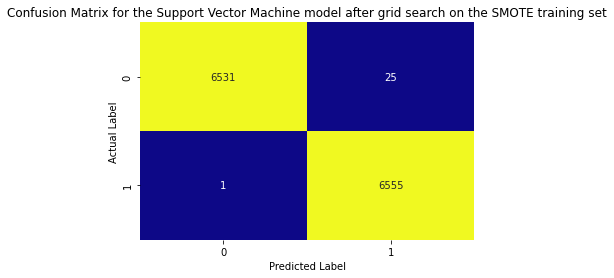

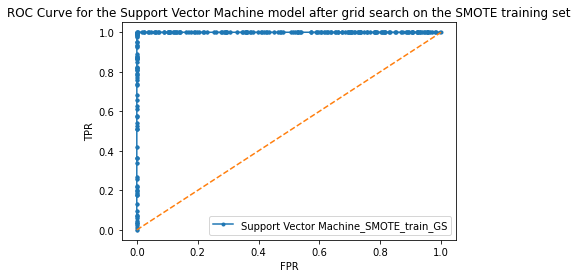



############################################Testing Set################################################ 

Classification report for the Support Vector Machine model after grid search on the SMOTE testing set is 
               precision    recall  f1-score   support

           0       0.95      0.97      0.96      2808
           1       0.82      0.77      0.79       570

    accuracy                           0.93      3378
   macro avg       0.89      0.87      0.88      3378
weighted avg       0.93      0.93      0.93      3378



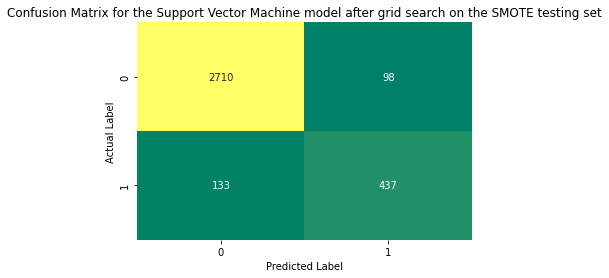

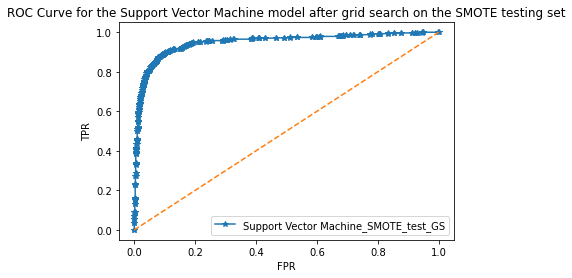

In [ ]:
perf_met_df_unscaled_svc_smote_gs, best_model_unscaled_svc_smote_gs = model_func(clfSVC, param_grid_SVC, X_train_smote, X_test_smote, y_train_smote, y_test_smote, 'SMOTE')

#### Scaled SMOTE Data - GS

--------------------Best Parameters--------------------
{'C': 10, 'gamma': 1, 'kernel': 'rbf'}


--------------------Best Model Params--------------------
SVC(C=10, gamma=1, probability=True)


Classification report for the Support Vector Machine model after grid search on the SMOTE scaled training set is 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      6556
           1       1.00      1.00      1.00      6556

    accuracy                           1.00     13112
   macro avg       1.00      1.00      1.00     13112
weighted avg       1.00      1.00      1.00     13112



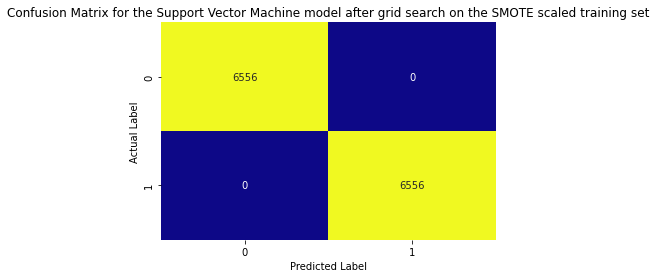

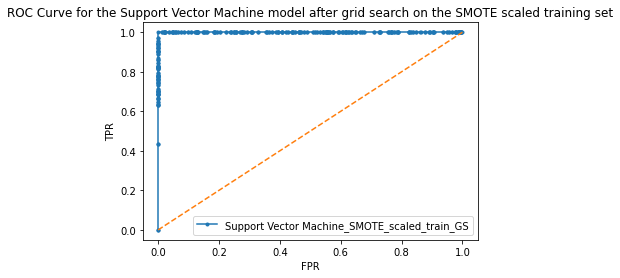



############################################Testing Set################################################ 

Classification report for the Support Vector Machine model after grid search on the SMOTE scaled testing set is 
               precision    recall  f1-score   support

           0       0.95      1.00      0.97      2808
           1       0.98      0.72      0.83       570

    accuracy                           0.95      3378
   macro avg       0.96      0.86      0.90      3378
weighted avg       0.95      0.95      0.95      3378



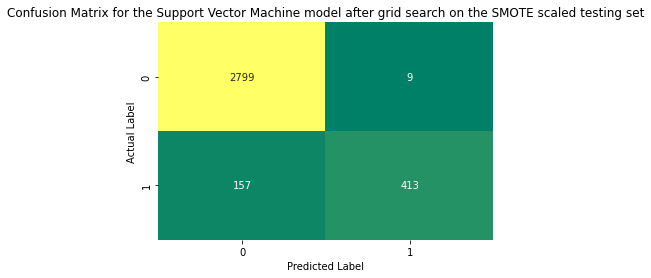

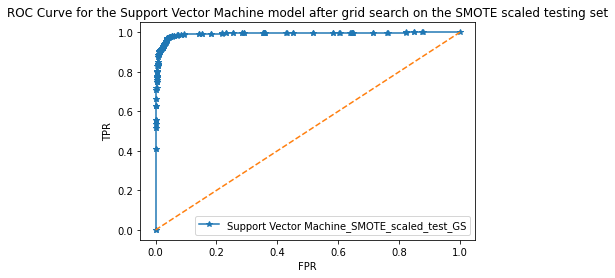

In [ ]:
perf_met_df_scaled_svc_smote_gs, best_model_scaled_svc_smote_gs = model_func(clfSVC, param_grid_SVC, X_scaled_train_smote, X_scaled_test_smote, y_scaled_train_smote, y_scaled_test_smote, 'SMOTE_Scaled')

### **Xtreme Gradient Boosting Classifier**

#### Unscaled Data

--------------------Best Model Params--------------------
{'base_score': 0.5, 'booster': 'gbtree', 'colsample_bylevel': 1, 'colsample_bynode': 1, 'colsample_bytree': 1, 'gamma': 0, 'learning_rate': 0.1, 'max_delta_step': 0, 'max_depth': 3, 'min_child_weight': 1, 'missing': None, 'n_estimators': 100, 'n_jobs': 1, 'nthread': None, 'objective': 'binary:logistic', 'random_state': 1, 'reg_alpha': 0, 'reg_lambda': 1, 'scale_pos_weight': 1, 'seed': None, 'silent': None, 'subsample': 1, 'verbosity': 1}


Classification report for the XGBoost model on the Unscaled training set is 
               precision    recall  f1-score   support

           0       0.92      0.97      0.94      6556
           1       0.80      0.58      0.67      1326

    accuracy                           0.91      7882
   macro avg       0.86      0.78      0.81      7882
weighted avg       0.90      0.91      0.90      7882



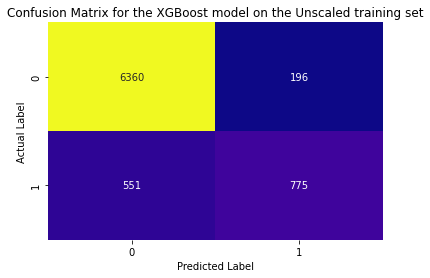

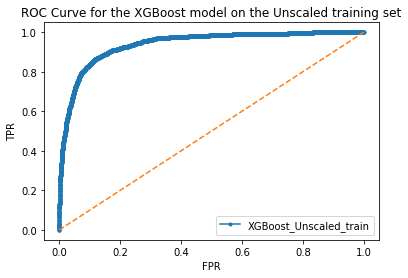



############################################Testing Set################################################ 

Classification report for the XGBoost model on the Unscaled testing set is 
               precision    recall  f1-score   support

           0       0.92      0.97      0.94      2808
           1       0.78      0.58      0.66       570

    accuracy                           0.90      3378
   macro avg       0.85      0.77      0.80      3378
weighted avg       0.89      0.90      0.89      3378



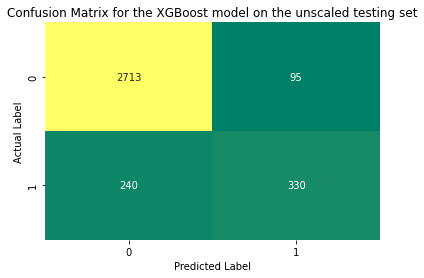

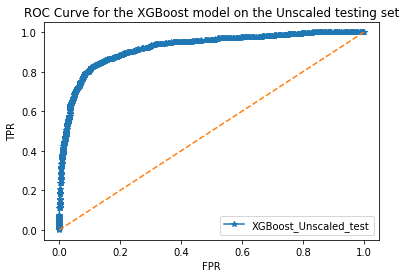

In [ ]:
perf_met_df_unscaled_xgb, best_model_unscaled_xgb = model_func(clfXGB, None, X_train, X_test, y_train, y_test, 'Unscaled')

#### Scaled Data

--------------------Best Model Params--------------------
{'base_score': 0.5, 'booster': 'gbtree', 'colsample_bylevel': 1, 'colsample_bynode': 1, 'colsample_bytree': 1, 'gamma': 0, 'learning_rate': 0.1, 'max_delta_step': 0, 'max_depth': 3, 'min_child_weight': 1, 'missing': None, 'n_estimators': 100, 'n_jobs': 1, 'nthread': None, 'objective': 'binary:logistic', 'random_state': 1, 'reg_alpha': 0, 'reg_lambda': 1, 'scale_pos_weight': 1, 'seed': None, 'silent': None, 'subsample': 1, 'verbosity': 1}


Classification report for the XGBoost model on the Scaled training set is 
               precision    recall  f1-score   support

           0       0.92      0.97      0.95      6556
           1       0.81      0.60      0.69      1326

    accuracy                           0.91      7882
   macro avg       0.86      0.79      0.82      7882
weighted avg       0.90      0.91      0.90      7882



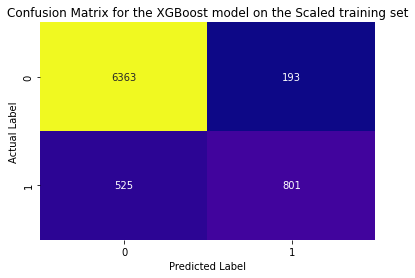

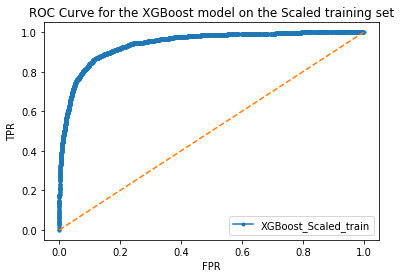



############################################Testing Set################################################ 

Classification report for the XGBoost model on the Scaled testing set is 
               precision    recall  f1-score   support

           0       0.92      0.97      0.95      2808
           1       0.80      0.60      0.69       570

    accuracy                           0.91      3378
   macro avg       0.86      0.79      0.82      3378
weighted avg       0.90      0.91      0.90      3378



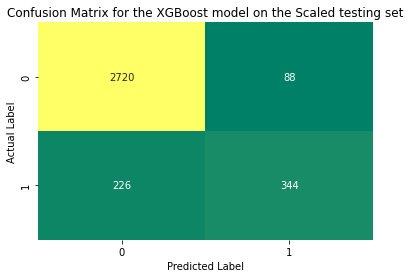

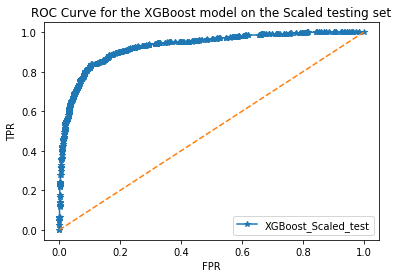

In [ ]:
perf_met_df_scaled_xgb, best_model_scaled_xgb = model_func(clfXGB, None, X_scaled_train, X_scaled_test, y_scaled_train, y_scaled_test, 'Scaled')

#### Unscaled SMOTE Data

--------------------Best Model Params--------------------
{'base_score': 0.5, 'booster': 'gbtree', 'colsample_bylevel': 1, 'colsample_bynode': 1, 'colsample_bytree': 1, 'gamma': 0, 'learning_rate': 0.1, 'max_delta_step': 0, 'max_depth': 3, 'min_child_weight': 1, 'missing': None, 'n_estimators': 100, 'n_jobs': 1, 'nthread': None, 'objective': 'binary:logistic', 'random_state': 1, 'reg_alpha': 0, 'reg_lambda': 1, 'scale_pos_weight': 1, 'seed': None, 'silent': None, 'subsample': 1, 'verbosity': 1}


Classification report for the XGBoost model on the SMOTE training set is 
               precision    recall  f1-score   support

           0       0.92      0.93      0.93      6556
           1       0.93      0.92      0.93      6556

    accuracy                           0.93     13112
   macro avg       0.93      0.93      0.93     13112
weighted avg       0.93      0.93      0.93     13112



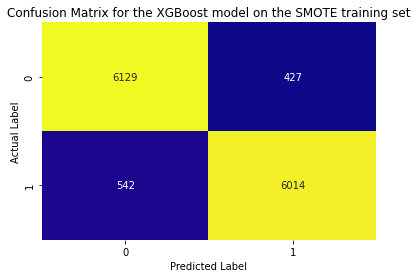

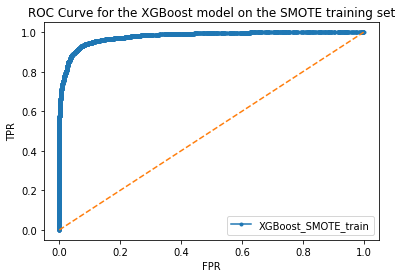



############################################Testing Set################################################ 

Classification report for the XGBoost model on the SMOTE testing set is 
               precision    recall  f1-score   support

           0       0.94      0.93      0.94      2808
           1       0.69      0.71      0.70       570

    accuracy                           0.90      3378
   macro avg       0.81      0.82      0.82      3378
weighted avg       0.90      0.90      0.90      3378



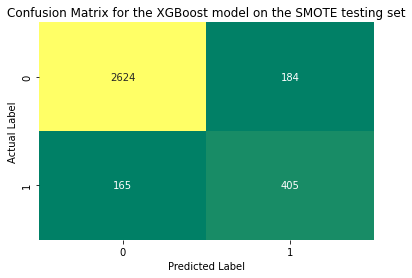

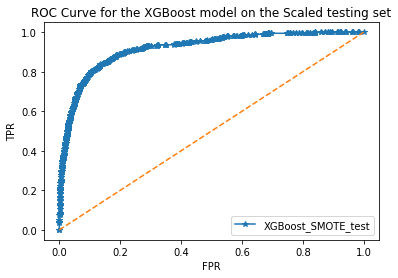

In [ ]:
perf_met_df_unscaled_xgb_smote, best_model_unscaled_xgb_smote = model_func(clfXGB, None, X_train_smote, X_test_smote, y_train_smote, y_test_smote, 'SMOTE')

#### Scaled SMOTE Data 

--------------------Best Model Params--------------------
{'base_score': 0.5, 'booster': 'gbtree', 'colsample_bylevel': 1, 'colsample_bynode': 1, 'colsample_bytree': 1, 'gamma': 0, 'learning_rate': 0.1, 'max_delta_step': 0, 'max_depth': 3, 'min_child_weight': 1, 'missing': None, 'n_estimators': 100, 'n_jobs': 1, 'nthread': None, 'objective': 'binary:logistic', 'random_state': 1, 'reg_alpha': 0, 'reg_lambda': 1, 'scale_pos_weight': 1, 'seed': None, 'silent': None, 'subsample': 1, 'verbosity': 1}


Classification report for the XGBoost model on the SMOTE scaled training set is 
               precision    recall  f1-score   support

           0       0.92      0.93      0.93      6556
           1       0.93      0.92      0.93      6556

    accuracy                           0.93     13112
   macro avg       0.93      0.93      0.93     13112
weighted avg       0.93      0.93      0.93     13112



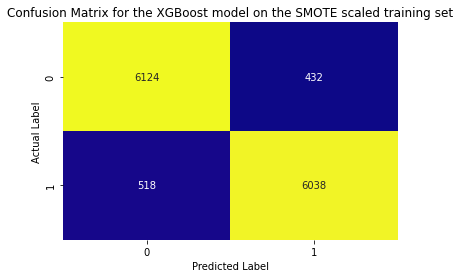

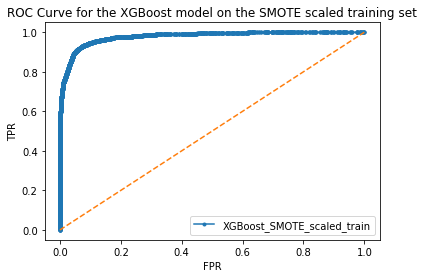



############################################Testing Set################################################ 

Classification report for the XGBoost model on the SMOTE scaled testing set is 
               precision    recall  f1-score   support

           0       0.95      0.93      0.94      2808
           1       0.69      0.74      0.71       570

    accuracy                           0.90      3378
   macro avg       0.82      0.83      0.82      3378
weighted avg       0.90      0.90      0.90      3378



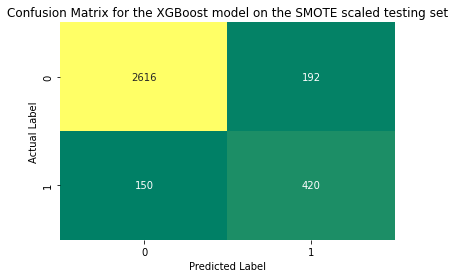

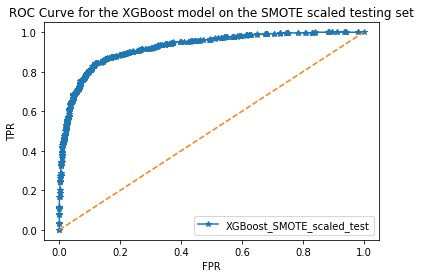

In [ ]:
perf_met_df_scaled_xgb_smote, best_model_scaled_xgb_smote = model_func(clfXGB, None, X_scaled_train_smote, X_scaled_test_smote, y_scaled_train_smote, y_scaled_test_smote, 'SMOTE_Scaled')

#### Unscaled Data - GS

--------------------Best Parameters--------------------
{'gamma': 0.5, 'max_depth': 5, 'min_child_weight': 1}


--------------------Best Model Params--------------------
XGBClassifier(gamma=0.5, max_depth=5, random_state=1)


Classification report for the XGBoost model after grid search on the Unscaled training set is 
               precision    recall  f1-score   support

           0       0.95      0.98      0.96      6556
           1       0.87      0.75      0.80      1326

    accuracy                           0.94      7882
   macro avg       0.91      0.86      0.88      7882
weighted avg       0.94      0.94      0.94      7882



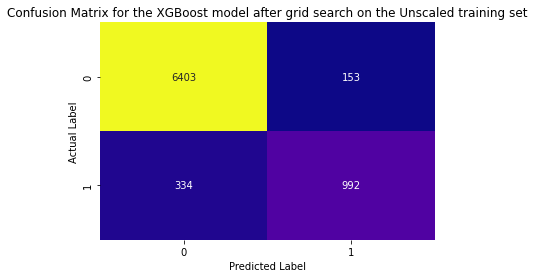

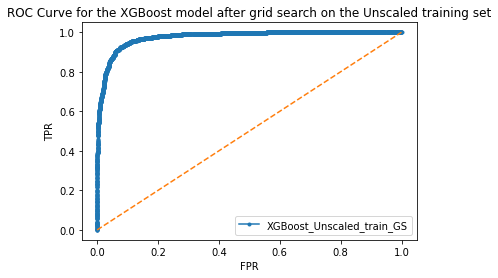



############################################Testing Set################################################ 

Classification report for the XGBoost model after grid search on the Unscaled testing set is 
               precision    recall  f1-score   support

           0       0.94      0.97      0.95      2808
           1       0.83      0.68      0.75       570

    accuracy                           0.92      3378
   macro avg       0.88      0.83      0.85      3378
weighted avg       0.92      0.92      0.92      3378



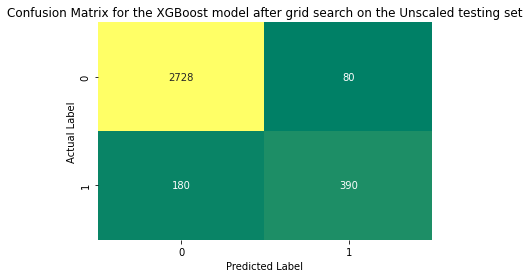

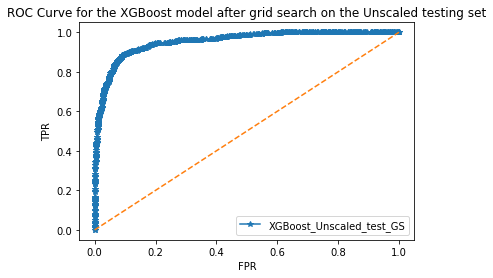

In [ ]:
perf_met_df_unscaled_xgb_gs, best_model_unscaled_xgb_gs = model_func(clfXGB, param_grid_XGB, X_train, X_test, y_train, y_test, 'Unscaled')

#### Scaled Data - GS

--------------------Best Parameters--------------------
{'gamma': 0.5, 'max_depth': 5, 'min_child_weight': 1}


--------------------Best Model Params--------------------
XGBClassifier(gamma=0.5, max_depth=5, random_state=1)


Classification report for the XGBoost model after grid search on the Scaled training set is 
               precision    recall  f1-score   support

           0       0.95      0.98      0.97      6556
           1       0.89      0.74      0.81      1326

    accuracy                           0.94      7882
   macro avg       0.92      0.86      0.89      7882
weighted avg       0.94      0.94      0.94      7882



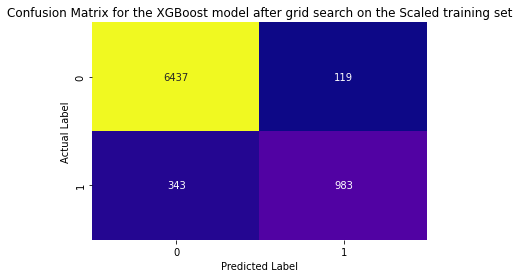

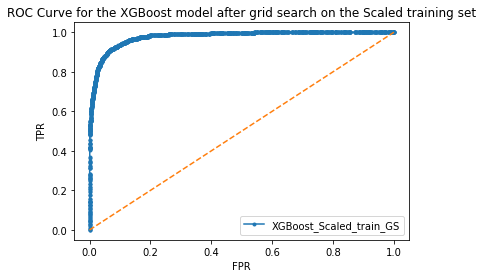



############################################Testing Set################################################ 

Classification report for the XGBoost model after grid search on the Scaled testing set is 
               precision    recall  f1-score   support

           0       0.94      0.98      0.96      2808
           1       0.85      0.69      0.76       570

    accuracy                           0.93      3378
   macro avg       0.89      0.83      0.86      3378
weighted avg       0.92      0.93      0.92      3378



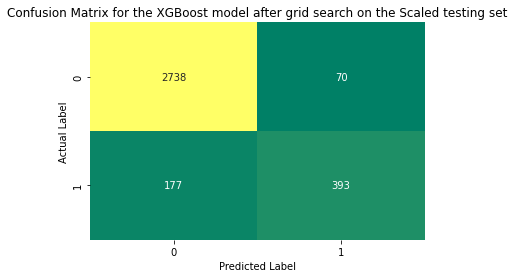

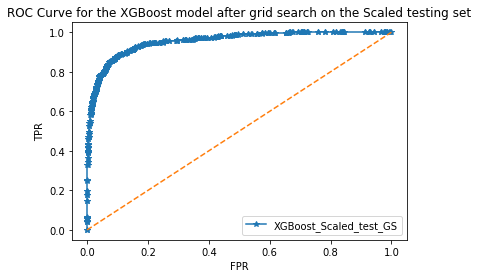

In [ ]:
perf_met_df_scaled_xgb_gs, best_model_scaled_xgb_gs = model_func(clfXGB, param_grid_XGB, X_scaled_train, X_scaled_test, y_scaled_train, y_scaled_test, 'Scaled')

#### Unscaled SMOTE Data - GS

--------------------Best Parameters--------------------
{'gamma': 2, 'max_depth': 5, 'min_child_weight': 1}


--------------------Best Model Params--------------------
XGBClassifier(gamma=2, max_depth=5, random_state=1)


Classification report for the XGBoost model after grid search on the SMOTE training set is 
               precision    recall  f1-score   support

           0       0.96      0.97      0.96      6556
           1       0.96      0.96      0.96      6556

    accuracy                           0.96     13112
   macro avg       0.96      0.96      0.96     13112
weighted avg       0.96      0.96      0.96     13112



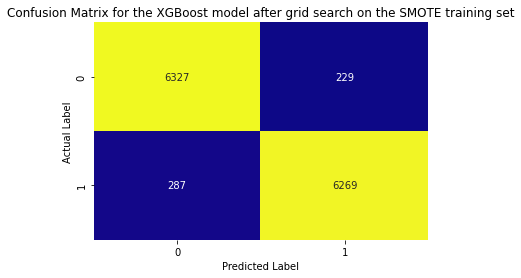

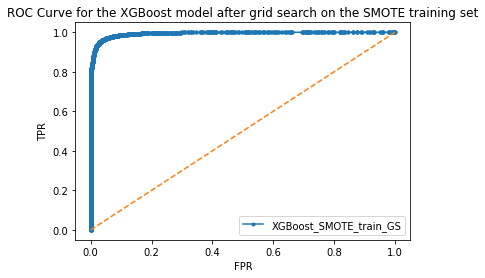



############################################Testing Set################################################ 

Classification report for the XGBoost model after grid search on the SMOTE testing set is 
               precision    recall  f1-score   support

           0       0.95      0.96      0.95      2808
           1       0.77      0.74      0.75       570

    accuracy                           0.92      3378
   macro avg       0.86      0.85      0.85      3378
weighted avg       0.92      0.92      0.92      3378



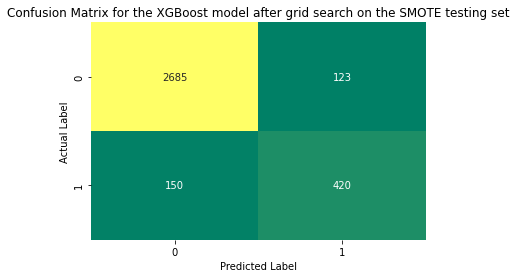

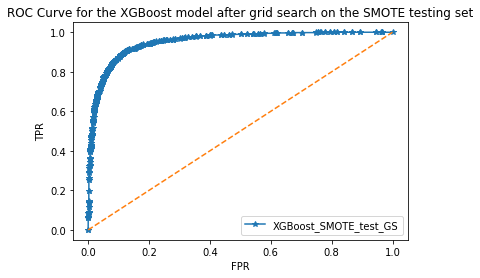

In [ ]:
perf_met_df_unscaled_xgb_smote_gs, best_model_unscaled_xgb_smote_gs = model_func(clfXGB, param_grid_XGB, X_train_smote, X_test_smote, y_train_smote, y_test_smote, 'SMOTE')

#### Scaled SMOTE Data - GS

--------------------Best Parameters--------------------
{'gamma': 1.5, 'max_depth': 5, 'min_child_weight': 1}


--------------------Best Model Params--------------------
XGBClassifier(gamma=1.5, max_depth=5, random_state=1)


Classification report for the XGBoost model after grid search on the SMOTE scaled training set is 
               precision    recall  f1-score   support

           0       0.96      0.96      0.96      6556
           1       0.96      0.96      0.96      6556

    accuracy                           0.96     13112
   macro avg       0.96      0.96      0.96     13112
weighted avg       0.96      0.96      0.96     13112



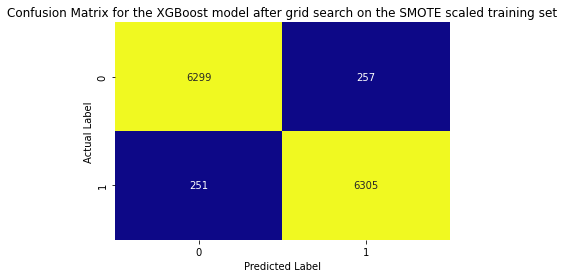

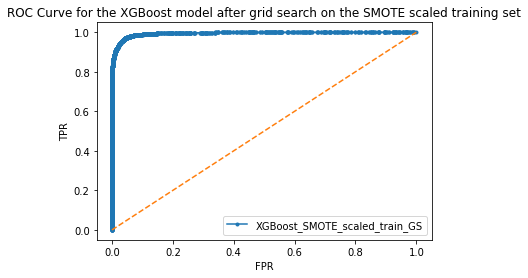



############################################Testing Set################################################ 

Classification report for the XGBoost model after grid search on the SMOTE scaled testing set is 
               precision    recall  f1-score   support

           0       0.95      0.96      0.96      2808
           1       0.80      0.75      0.78       570

    accuracy                           0.93      3378
   macro avg       0.87      0.86      0.87      3378
weighted avg       0.93      0.93      0.93      3378



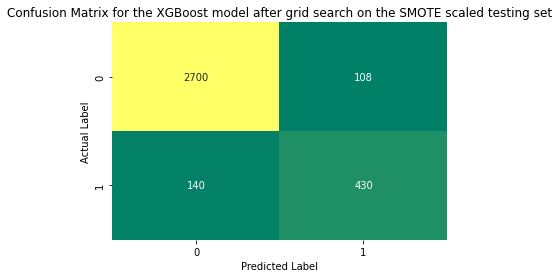

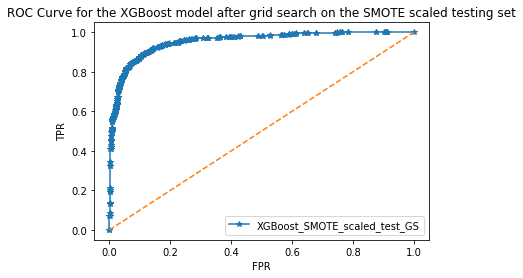

In [ ]:
perf_met_df_scaled_xgb_smote_gs, best_model_scaled_xgb_smote_gs = model_func(clfXGB, param_grid_XGB, X_scaled_train_smote, X_scaled_test_smote, y_scaled_train_smote, y_scaled_test_smote, 'SMOTE_Scaled')

### **Performance Metrics Comparison**

In [ ]:
perf_met_df_train = pd.DataFrame([perf_met_df_unscaled_lr.iloc[0],perf_met_df_scaled_lr.iloc[0], perf_met_df_unscaled_lr_smote.iloc[0], perf_met_df_scaled_lr_smote.iloc[0], perf_met_df_unscaled_lr_gs.iloc[0], perf_met_df_scaled_lr_gs.iloc[0], perf_met_df_unscaled_lr_smote_gs.iloc[0], perf_met_df_scaled_lr_smote_gs.iloc[0],
                               perf_met_df_unscaled_lda.iloc[0],perf_met_df_scaled_lda.iloc[0], perf_met_df_unscaled_lda_smote.iloc[0], perf_met_df_scaled_lda_smote.iloc[0], perf_met_df_unscaled_lda_gs.iloc[0], perf_met_df_scaled_lda_gs.iloc[0], perf_met_df_unscaled_lda_smote_gs.iloc[0], perf_met_df_scaled_lda_smote_gs.iloc[0],
                               perf_met_df_unscaled_knn.iloc[0],perf_met_df_scaled_knn.iloc[0], perf_met_df_unscaled_knn_smote.iloc[0], perf_met_df_scaled_knn_smote.iloc[0], perf_met_df_unscaled_knn_gs.iloc[0], perf_met_df_scaled_knn_gs.iloc[0], perf_met_df_unscaled_knn_smote_gs.iloc[0], perf_met_df_scaled_knn_smote_gs.iloc[0],
                               perf_met_df_unscaled_nb.iloc[0],perf_met_df_scaled_nb.iloc[0], perf_met_df_unscaled_nb_smote.iloc[0], perf_met_df_scaled_nb_smote.iloc[0], perf_met_df_unscaled_nb_gs.iloc[0], perf_met_df_scaled_nb_gs.iloc[0], perf_met_df_unscaled_nb_smote_gs.iloc[0], perf_met_df_scaled_nb_smote_gs.iloc[0],
                               perf_met_df_unscaled_dtc.iloc[0],perf_met_df_scaled_dtc.iloc[0], perf_met_df_unscaled_dtc_smote.iloc[0], perf_met_df_scaled_dtc_smote.iloc[0], perf_met_df_unscaled_dtc_gs.iloc[0], perf_met_df_scaled_dtc_gs.iloc[0], perf_met_df_unscaled_dtc_smote_gs.iloc[0], perf_met_df_scaled_dtc_smote_gs.iloc[0],
                               perf_met_df_unscaled_rf.iloc[0],perf_met_df_scaled_rf.iloc[0], perf_met_df_unscaled_rf_smote.iloc[0], perf_met_df_scaled_rf_smote.iloc[0], perf_met_df_unscaled_rf_gs.iloc[0], perf_met_df_scaled_rf_gs.iloc[0], perf_met_df_unscaled_rf_smote_gs.iloc[0], perf_met_df_scaled_rf_smote_gs.iloc[0],
                               perf_met_df_unscaled_bgcl.iloc[0],perf_met_df_scaled_bgcl.iloc[0], perf_met_df_unscaled_bgcl_smote.iloc[0], perf_met_df_scaled_bgcl_smote.iloc[0], perf_met_df_unscaled_bgcl_gs.iloc[0], perf_met_df_scaled_bgcl_gs.iloc[0], perf_met_df_unscaled_bgcl_smote_gs.iloc[0], perf_met_df_scaled_bgcl_smote_gs.iloc[0],
                               perf_met_df_unscaled_adb.iloc[0],perf_met_df_scaled_adb.iloc[0], perf_met_df_unscaled_adb_smote.iloc[0], perf_met_df_scaled_adb_smote.iloc[0], perf_met_df_unscaled_adb_gs.iloc[0], perf_met_df_scaled_adb_gs.iloc[0], perf_met_df_unscaled_adb_smote_gs.iloc[0], perf_met_df_scaled_adb_smote_gs.iloc[0],
                               perf_met_df_unscaled_gbc.iloc[0],perf_met_df_scaled_gbc.iloc[0], perf_met_df_unscaled_gbc_smote.iloc[0], perf_met_df_scaled_gbc_smote.iloc[0], perf_met_df_unscaled_gbc_gs.iloc[0], perf_met_df_scaled_gbc_gs.iloc[0], perf_met_df_unscaled_gbc_smote_gs.iloc[0], perf_met_df_scaled_gbc_smote_gs.iloc[0],
                               perf_met_df_unscaled_svc.iloc[0],perf_met_df_scaled_svc.iloc[0], perf_met_df_unscaled_svc_smote.iloc[0], perf_met_df_scaled_svc_smote.iloc[0], perf_met_df_unscaled_svc_gs.iloc[0], perf_met_df_scaled_svc_gs.iloc[0], perf_met_df_unscaled_svc_smote_gs.iloc[0], perf_met_df_scaled_svc_smote_gs.iloc[0],
                               perf_met_df_unscaled_xgb.iloc[0],perf_met_df_scaled_xgb.iloc[0], perf_met_df_unscaled_xgb_smote.iloc[0], perf_met_df_scaled_xgb_smote.iloc[0], perf_met_df_unscaled_xgb_gs.iloc[0], perf_met_df_scaled_xgb_gs.iloc[0], perf_met_df_unscaled_xgb_smote_gs.iloc[0], perf_met_df_scaled_xgb_smote_gs.iloc[0]
                               ])
perf_met_df_train

,Accuracy,ROC-AUC,Precision,Recall,F1-Score,Mean_CV_Score
Logistic Regression_Unscaled_Train,0.864882,0.847195,0.728546,0.313725,0.438587,0.864627
Logistic Regression_Scaled_Train,0.876300,0.850348,0.780800,0.368024,0.500256,0.876046
Logistic Regression_SMOTE_Train,0.784091,0.852753,0.769576,0.811013,0.789751,0.782949
Logistic Regression_SMOTE_Scaled_Train,0.781117,0.853179,0.769918,0.801861,0.785565,0.781881
Logistic Regression_Unscaled_Train_GS,0.866531,0.848719,0.737024,0.321267,0.447479,0.865515
Logistic Regression_Scaled_Train_GS,0.876300,0.850347,0.780800,0.368024,0.500256,0.876046
Logistic Regression_SMOTE_Train_GS,0.783786,0.852696,0.769209,0.810860,0.789485,0.782873
Logistic Regression_SMOTE_Scaled_Train_GS,0.781269,0.853206,0.770064,0.802013,0.785714,0.781957
Linear Discriminant Analysis_Unscaled_Train,0.857650,0.809304,0.714286,0.256410,0.377358,0.857142
Linear Discriminant Analysis_Scaled_Train,0.866785,0.819868,0.758427,0.305430,0.435484,0.865515


In [ ]:
perf_met_df_train.sort_values(by=['Accuracy'], ascending=False)

,Accuracy,ROC-AUC,Precision,Recall,F1-Score,Mean_CV_Score
Ensemble Random Forest_Scaled_Train,1.000000,1.000000,1.000000,1.000000,1.000000,0.951663
Ensemble Random Forest_SMOTE_Scaled_Train,1.000000,1.000000,1.000000,1.000000,1.000000,0.980861
Decision Tree Classifier_SMOTE_Scaled_Train,1.000000,1.000000,1.000000,1.000000,1.000000,0.945935
Decision Tree Classifier_Scaled_Train,1.000000,1.000000,1.000000,1.000000,1.000000,0.931618
Support Vector Machine_SMOTE_Scaled_Train_GS,1.000000,1.000000,1.000000,1.000000,1.000000,0.991992
K-Nearest Neighbours Classifier_Scaled_Train_GS,1.000000,1.000000,1.000000,1.000000,1.000000,0.952296
Ensemble Random Forest_SMOTE_Train,0.999771,1.000000,0.999695,0.999847,0.999771,0.974534
Decision Tree Classifier_SMOTE_Train,0.999771,1.000000,1.000000,0.999542,0.999771,0.952343
K-Nearest Neighbours Classifier_SMOTE_Train_GS,0.999771,1.000000,1.000000,0.999542,0.999771,0.973307
K-Nearest Neighbours Classifier_SMOTE_Scaled_Train_GS,0.999161,0.999990,1.000000,0.998322,0.999160,0.992069


In [ ]:
perf_met_df_test = pd.DataFrame([perf_met_df_unscaled_lr.iloc[1],perf_met_df_scaled_lr.iloc[1], perf_met_df_unscaled_lr_smote.iloc[1], perf_met_df_scaled_lr_smote.iloc[1], perf_met_df_unscaled_lr_gs.iloc[1], perf_met_df_scaled_lr_gs.iloc[1], perf_met_df_unscaled_lr_smote_gs.iloc[1], perf_met_df_scaled_lr_smote_gs.iloc[1],
                               perf_met_df_unscaled_lda.iloc[1],perf_met_df_scaled_lda.iloc[1], perf_met_df_unscaled_lda_smote.iloc[1], perf_met_df_scaled_lda_smote.iloc[1], perf_met_df_unscaled_lda_gs.iloc[1], perf_met_df_scaled_lda_gs.iloc[1], perf_met_df_unscaled_lda_smote_gs.iloc[1], perf_met_df_scaled_lda_smote_gs.iloc[1],
                               perf_met_df_unscaled_knn.iloc[1],perf_met_df_scaled_knn.iloc[1], perf_met_df_unscaled_knn_smote.iloc[1], perf_met_df_scaled_knn_smote.iloc[1], perf_met_df_unscaled_knn_gs.iloc[1], perf_met_df_scaled_knn_gs.iloc[1], perf_met_df_unscaled_knn_smote_gs.iloc[1], perf_met_df_scaled_knn_smote_gs.iloc[1],
                               perf_met_df_unscaled_nb.iloc[1],perf_met_df_scaled_nb.iloc[1], perf_met_df_unscaled_nb_smote.iloc[1], perf_met_df_scaled_nb_smote.iloc[1], perf_met_df_unscaled_nb_gs.iloc[1], perf_met_df_scaled_nb_gs.iloc[1], perf_met_df_unscaled_nb_smote_gs.iloc[1], perf_met_df_scaled_nb_smote_gs.iloc[1],
                               perf_met_df_unscaled_dtc.iloc[1],perf_met_df_scaled_dtc.iloc[1], perf_met_df_unscaled_dtc_smote.iloc[1], perf_met_df_scaled_dtc_smote.iloc[1], perf_met_df_unscaled_dtc_gs.iloc[1], perf_met_df_scaled_dtc_gs.iloc[1], perf_met_df_unscaled_dtc_smote_gs.iloc[1], perf_met_df_scaled_dtc_smote_gs.iloc[1],
                               perf_met_df_unscaled_rf.iloc[1],perf_met_df_scaled_rf.iloc[1], perf_met_df_unscaled_rf_smote.iloc[1], perf_met_df_scaled_rf_smote.iloc[1], perf_met_df_unscaled_rf_gs.iloc[1], perf_met_df_scaled_rf_gs.iloc[1], perf_met_df_unscaled_rf_smote_gs.iloc[1], perf_met_df_scaled_rf_smote_gs.iloc[1],
                               perf_met_df_unscaled_bgcl.iloc[1],perf_met_df_scaled_bgcl.iloc[1], perf_met_df_unscaled_bgcl_smote.iloc[1], perf_met_df_scaled_bgcl_smote.iloc[1], perf_met_df_unscaled_bgcl_gs.iloc[1], perf_met_df_scaled_bgcl_gs.iloc[1], perf_met_df_unscaled_bgcl_smote_gs.iloc[1], perf_met_df_scaled_bgcl_smote_gs.iloc[1],
                               perf_met_df_unscaled_adb.iloc[1],perf_met_df_scaled_adb.iloc[1], perf_met_df_unscaled_adb_smote.iloc[1], perf_met_df_scaled_adb_smote.iloc[1], perf_met_df_unscaled_adb_gs.iloc[1], perf_met_df_scaled_adb_gs.iloc[1], perf_met_df_unscaled_adb_smote_gs.iloc[1], perf_met_df_scaled_adb_smote_gs.iloc[1],
                               perf_met_df_unscaled_gbc.iloc[1],perf_met_df_scaled_gbc.iloc[1], perf_met_df_unscaled_gbc_smote.iloc[1], perf_met_df_scaled_gbc_smote.iloc[1], perf_met_df_unscaled_gbc_gs.iloc[1], perf_met_df_scaled_gbc_gs.iloc[1], perf_met_df_unscaled_gbc_smote_gs.iloc[1], perf_met_df_scaled_gbc_smote_gs.iloc[1],
                               perf_met_df_unscaled_svc.iloc[1],perf_met_df_scaled_svc.iloc[1], perf_met_df_unscaled_svc_smote.iloc[1], perf_met_df_scaled_svc_smote.iloc[1], perf_met_df_unscaled_svc_gs.iloc[1], perf_met_df_scaled_svc_gs.iloc[1], perf_met_df_unscaled_svc_smote_gs.iloc[1], perf_met_df_scaled_svc_smote_gs.iloc[1],
                               perf_met_df_unscaled_xgb.iloc[1],perf_met_df_scaled_xgb.iloc[1], perf_met_df_unscaled_xgb_smote.iloc[1], perf_met_df_scaled_xgb_smote.iloc[1], perf_met_df_unscaled_xgb_gs.iloc[1], perf_met_df_scaled_xgb_gs.iloc[1], perf_met_df_unscaled_xgb_smote_gs.iloc[1], perf_met_df_scaled_xgb_smote_gs.iloc[1]
                               ])
perf_met_df_test

,Accuracy,ROC-AUC,Precision,Recall,F1-Score,Mean_CV_Score
Logistic Regression_Unscaled_Test,0.861456,0.844072,0.686131,0.329825,0.445498,0.865304
Logistic Regression_Scaled_Test,0.874778,0.851228,0.752577,0.384211,0.508711,0.875073
Logistic Regression_SMOTE_Test,0.751036,0.836486,0.384089,0.787719,0.516389,0.876551
Logistic Regression_SMOTE_Scaled_Test,0.764062,0.849076,0.398023,0.777193,0.526441,0.874482
Logistic Regression_Unscaled_Test_GS,0.863529,0.846225,0.705660,0.328070,0.447904,0.865308
Logistic Regression_Scaled_Test_GS,0.874778,0.851228,0.752577,0.384211,0.508711,0.875073
Logistic Regression_SMOTE_Test_GS,0.751036,0.836348,0.384089,0.787719,0.516389,0.876255
Logistic Regression_SMOTE_Scaled_Test_GS,0.764062,0.849101,0.398023,0.777193,0.526441,0.875371
Linear Discriminant Analysis_Unscaled_Test,0.857608,0.806937,0.684647,0.289474,0.406905,0.857311
Linear Discriminant Analysis_Scaled_Test,0.867377,0.819637,0.734615,0.335088,0.460241,0.865007


In [ ]:
perf_met_df_test.sort_values(by=['Accuracy'], ascending=False)

,Accuracy,ROC-AUC,Precision,Recall,F1-Score,Mean_CV_Score
K-Nearest Neighbours Classifier_SMOTE_Scaled_Test_GS,0.981054,0.981747,0.951786,0.935088,0.943363,0.917700
Ensemble Random Forest_SMOTE_Scaled_Test,0.969509,0.990801,0.928440,0.887719,0.907623,0.928655
Ensemble Random Forest_Scaled_Test,0.965068,0.988038,0.953815,0.833333,0.889513,0.923030
K-Nearest Neighbours Classifier_Scaled_Test_GS,0.963588,0.960983,0.895575,0.887719,0.891630,0.925401
Ensemble Random Forest_SMOTE_Test,0.963588,0.987029,0.914657,0.864912,0.889089,0.927178
Ensemble Random Forest_Unscaled_Test,0.962700,0.982336,0.914179,0.859649,0.886076,0.924216
Bagging Classifier Model_SMOTE_Scaled_Test,0.960924,0.986316,0.884211,0.884211,0.884211,0.918882
Bagging Classifier Model_Unscaled_Test,0.958555,0.981013,0.921569,0.824561,0.870370,0.917407
Bagging Classifier Model_SMOTE_Test,0.955891,0.982841,0.879279,0.856140,0.867556,0.918588
Decision Tree Classifier_Unscaled_Test,0.952339,0.926855,0.854419,0.864912,0.859634,0.899646


In [ ]:
perf_met_df = pd.concat([perf_met_df_unscaled_lr,perf_met_df_scaled_lr, perf_met_df_unscaled_lr_smote, perf_met_df_scaled_lr_smote, perf_met_df_unscaled_lr_gs, perf_met_df_scaled_lr_gs, perf_met_df_unscaled_lr_smote_gs, perf_met_df_scaled_lr_smote_gs,
                               perf_met_df_unscaled_lda,perf_met_df_scaled_lda, perf_met_df_unscaled_lda_smote, perf_met_df_scaled_lda_smote, perf_met_df_unscaled_lda_gs, perf_met_df_scaled_lda_gs, perf_met_df_unscaled_lda_smote_gs, perf_met_df_scaled_lda_smote_gs,
                               perf_met_df_unscaled_knn,perf_met_df_scaled_knn, perf_met_df_unscaled_knn_smote, perf_met_df_scaled_knn_smote, perf_met_df_unscaled_knn_gs, perf_met_df_scaled_knn_gs, perf_met_df_unscaled_knn_smote_gs, perf_met_df_scaled_knn_smote_gs,
                               perf_met_df_unscaled_nb,perf_met_df_scaled_nb, perf_met_df_unscaled_nb_smote, perf_met_df_scaled_nb_smote, perf_met_df_unscaled_nb_gs, perf_met_df_scaled_nb_gs, perf_met_df_unscaled_nb_smote_gs, perf_met_df_scaled_nb_smote_gs,
                               perf_met_df_unscaled_dtc,perf_met_df_scaled_dtc, perf_met_df_unscaled_dtc_smote, perf_met_df_scaled_dtc_smote, perf_met_df_unscaled_dtc_gs, perf_met_df_scaled_dtc_gs, perf_met_df_unscaled_dtc_smote_gs, perf_met_df_scaled_dtc_smote_gs,
                               perf_met_df_unscaled_rf,perf_met_df_scaled_rf, perf_met_df_unscaled_rf_smote, perf_met_df_scaled_rf_smote, perf_met_df_unscaled_rf_gs, perf_met_df_scaled_rf_gs, perf_met_df_unscaled_rf_smote_gs, perf_met_df_scaled_rf_smote_gs,
                               perf_met_df_unscaled_bgcl,perf_met_df_scaled_bgcl, perf_met_df_unscaled_bgcl_smote, perf_met_df_scaled_bgcl_smote, perf_met_df_unscaled_bgcl_gs, perf_met_df_scaled_bgcl_gs, perf_met_df_unscaled_bgcl_smote_gs, perf_met_df_scaled_bgcl_smote_gs,
                               perf_met_df_unscaled_adb,perf_met_df_scaled_adb, perf_met_df_unscaled_adb_smote, perf_met_df_scaled_adb_smote, perf_met_df_unscaled_adb_gs, perf_met_df_scaled_adb_gs, perf_met_df_unscaled_adb_smote_gs, perf_met_df_scaled_adb_smote_gs,
                               perf_met_df_unscaled_gbc,perf_met_df_scaled_gbc, perf_met_df_unscaled_gbc_smote, perf_met_df_scaled_gbc_smote, perf_met_df_unscaled_gbc_gs, perf_met_df_scaled_gbc_gs, perf_met_df_unscaled_gbc_smote_gs, perf_met_df_scaled_gbc_smote_gs,
                               perf_met_df_unscaled_svc,perf_met_df_scaled_svc, perf_met_df_unscaled_svc_smote, perf_met_df_scaled_svc_smote, perf_met_df_unscaled_svc_gs, perf_met_df_scaled_svc_gs, perf_met_df_unscaled_svc_smote_gs, perf_met_df_scaled_svc_smote_gs,
                               perf_met_df_unscaled_xgb,perf_met_df_scaled_xgb, perf_met_df_unscaled_xgb_smote, perf_met_df_scaled_xgb_smote, perf_met_df_unscaled_xgb_gs, perf_met_df_scaled_xgb_gs, perf_met_df_unscaled_xgb_smote_gs, perf_met_df_scaled_xgb_smote_gs
                               ])
perf_met_df

,Accuracy,ROC-AUC,Precision,Recall,F1-Score,Mean_CV_Score
Logistic Regression_Unscaled_Train,0.864882,0.847195,0.728546,0.313725,0.438587,0.864627
Logistic Regression_Unscaled_Test,0.861456,0.844072,0.686131,0.329825,0.445498,0.865304
Logistic Regression_Scaled_Train,0.876300,0.850348,0.780800,0.368024,0.500256,0.876046
Logistic Regression_Scaled_Test,0.874778,0.851228,0.752577,0.384211,0.508711,0.875073
Logistic Regression_SMOTE_Train,0.784091,0.852753,0.769576,0.811013,0.789751,0.782949
Logistic Regression_SMOTE_Test,0.751036,0.836486,0.384089,0.787719,0.516389,0.876551
Logistic Regression_SMOTE_Scaled_Train,0.781117,0.853179,0.769918,0.801861,0.785565,0.781881
Logistic Regression_SMOTE_Scaled_Test,0.764062,0.849076,0.398023,0.777193,0.526441,0.874482
Logistic Regression_Unscaled_Train_GS,0.866531,0.848719,0.737024,0.321267,0.447479,0.865515
Logistic Regression_Unscaled_Test_GS,0.863529,0.846225,0.705660,0.328070,0.447904,0.865308


In [ ]:
perf_met_df.to_excel('Capstone_Perf_Metrics.xlsx')